In [3]:
import pandas as pd 
import numpy as np 
import warnings
warnings.filterwarnings("ignore")
np.random.seed(1)
from shapefinder import Shape,finder
from pmdarima.arima import auto_arima
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt 
from sklearn.metrics import mean_squared_error
import math 
from dtaidistance import dtw
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.layers import Dense,LSTM,Bidirectional,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from pmdarima.arima import auto_arima
import os
from cycler import cycler

In [4]:
# Plot parameters 
plot_params = {"text.usetex":True,"font.family":"serif","font.size":20,"xtick.labelsize":20,"ytick.labelsize":20,"axes.labelsize":20,"figure.titlesize":20,"figure.figsize":(8,5),"axes.prop_cycle":cycler(color=['black','rosybrown','gray','indianred','red','maroon','silver',])}
plt.rcParams.update(plot_params)

In [5]:
### Define out paths ------
home = '/Users/hannahfrank/'
if not os.path.exists(os.path.join(home,'desktop/Views_competition_out')):
    os.makedirs(os.path.join(home,'desktop/Views_competition_out'))

out_paths = {"plots": os.path.join(home,'desktop/Views_competition_out/plots'),
    "data": os.path.join(home,'desktop/Views_competition_out/data'),
    "analysis": os.path.join(home,'desktop/Views_competition_out/analysis'),}

for key, val in out_paths.items():
    if not os.path.exists(val):
        os.makedirs(val)

In [6]:
df_tot_tot=pd.read_csv('data.csv',index_col=0) # fatalities data
bench1_tot = pd.read_csv('bench1.csv',index_col=0) # predicted fatalities for test data
bench2_tot = pd.read_csv('bench2.csv',index_col=0) # predicted fatalities for test data

In [7]:
df_tot_tot

,Guyana,Suriname,Trinidad and Tobago,Venezuela,Samoa,Tonga,Argentina,Bolivia,Brazil,Chile,...,Kosovo,Serbia,United States,Uganda,Kenya,Tanzania,Morocco,Mauritania,Sudan,South Sudan
121,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,0.0,0.0,NaN,0.0,0.0,NaN,NaN
122,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,5.0,0.0,NaN,0.0,0.0,NaN,NaN
123,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,300.0,0.0,NaN,0.0,0.0,NaN,NaN
124,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,53.0,0.0,NaN,0.0,0.0,NaN,NaN
125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,25.0,0.0,NaN,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,32.0
501,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,65.0
502,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0
503,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,2.0,3.0,0.0,0.0,0.0


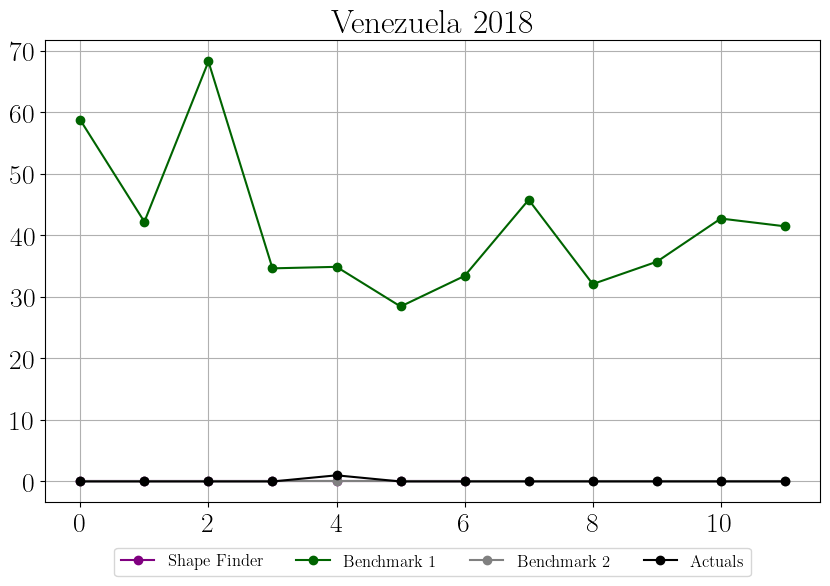

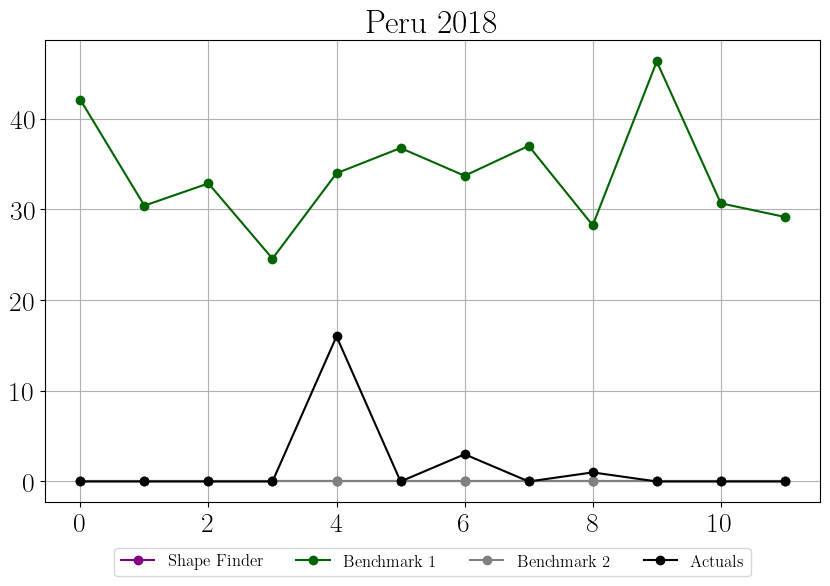

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


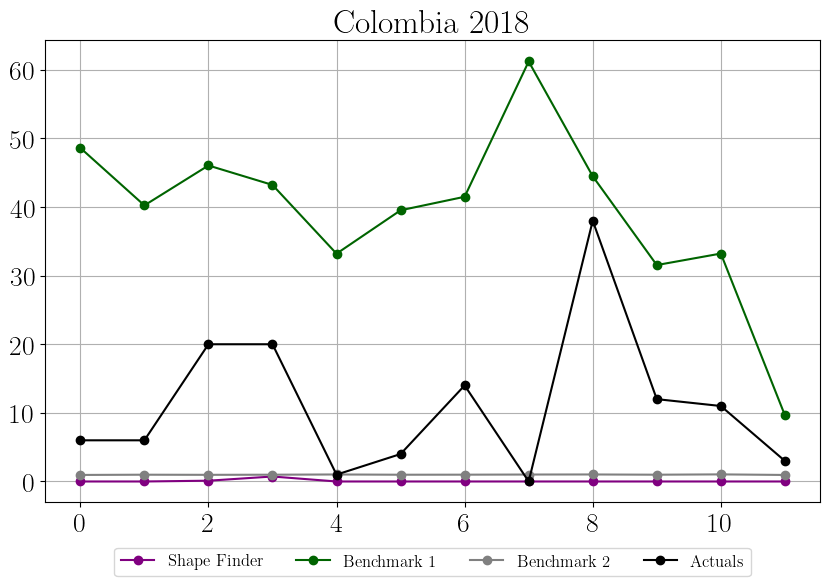

No patterns found to predict. Maybe increase the minimum distance.


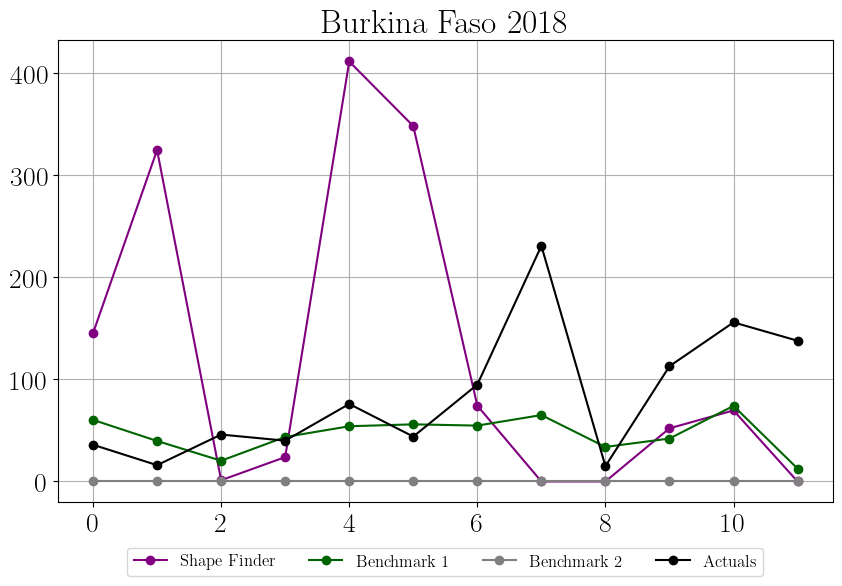

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


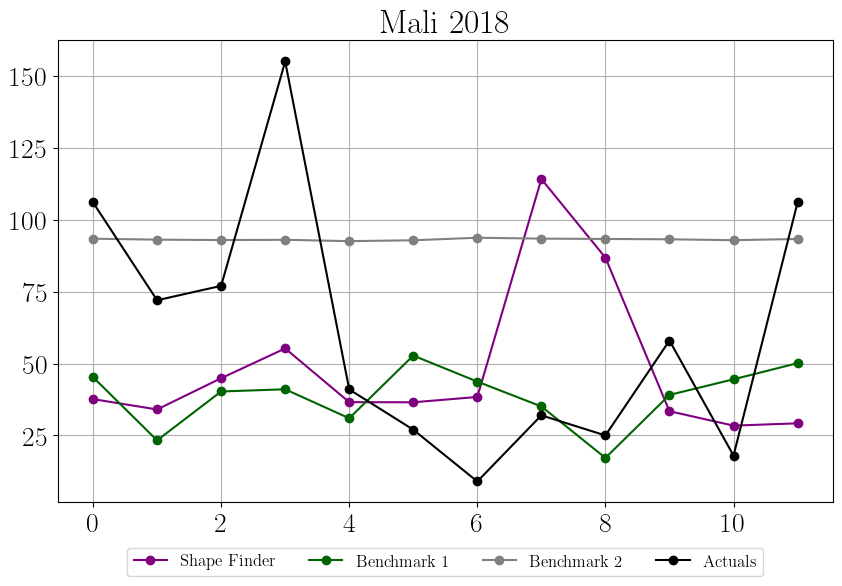

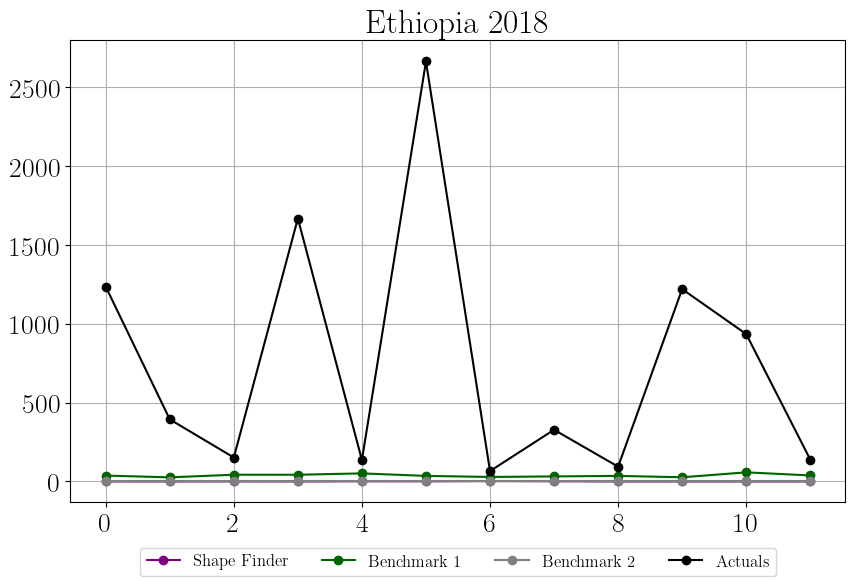

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


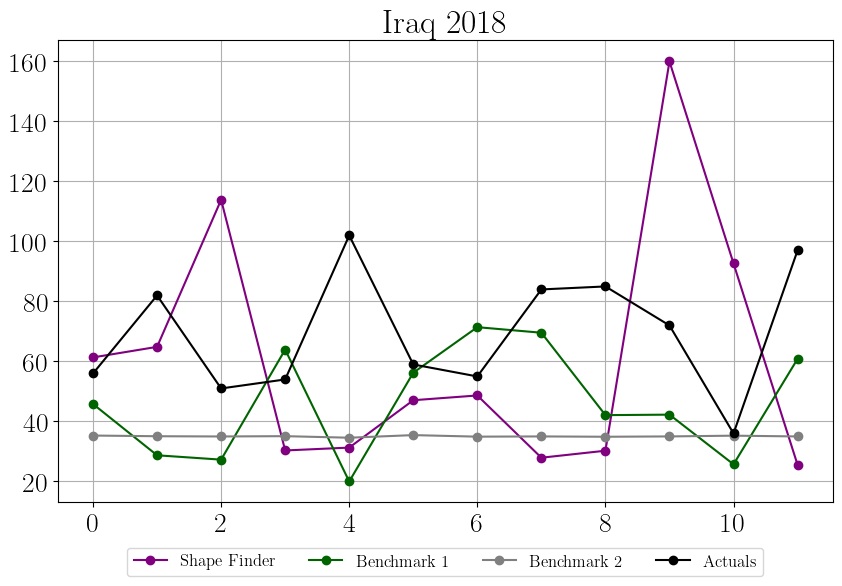

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


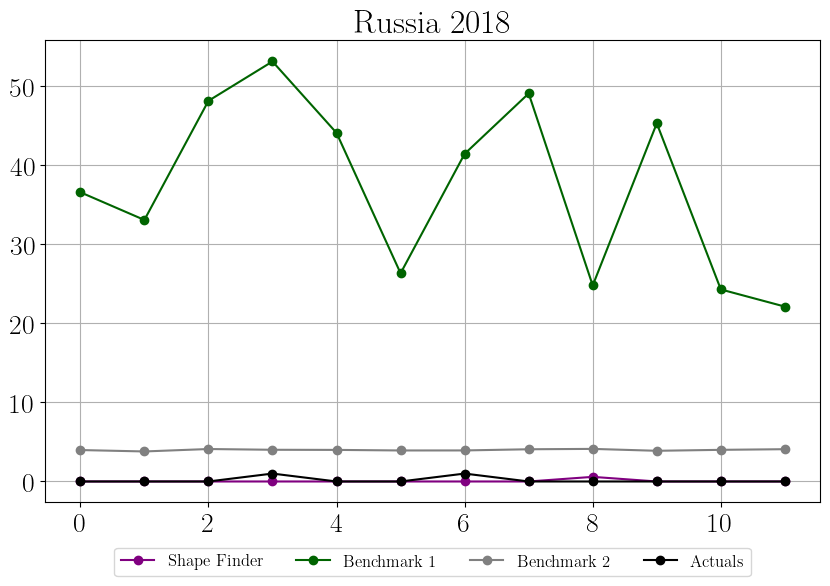

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


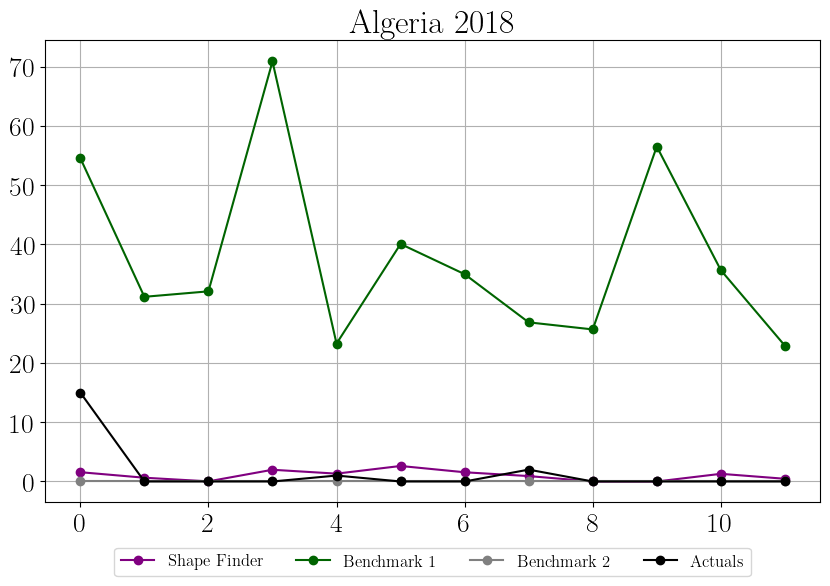

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


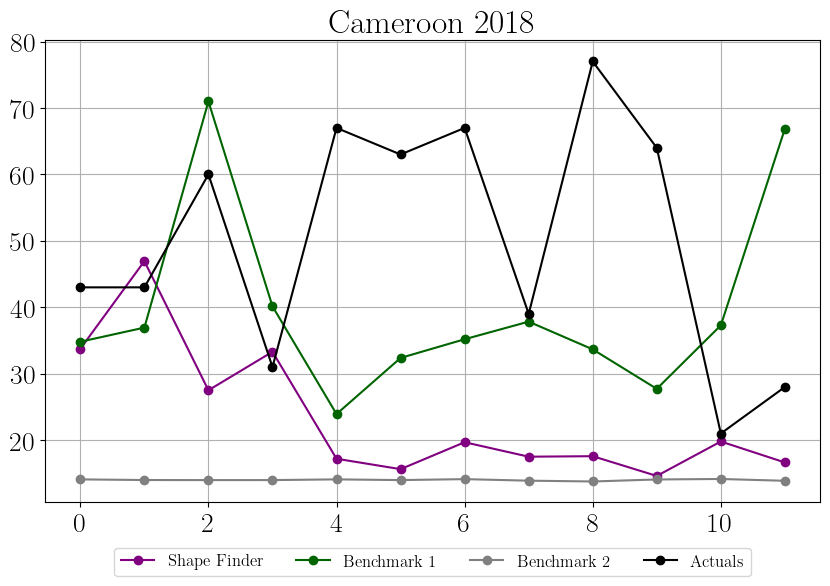

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


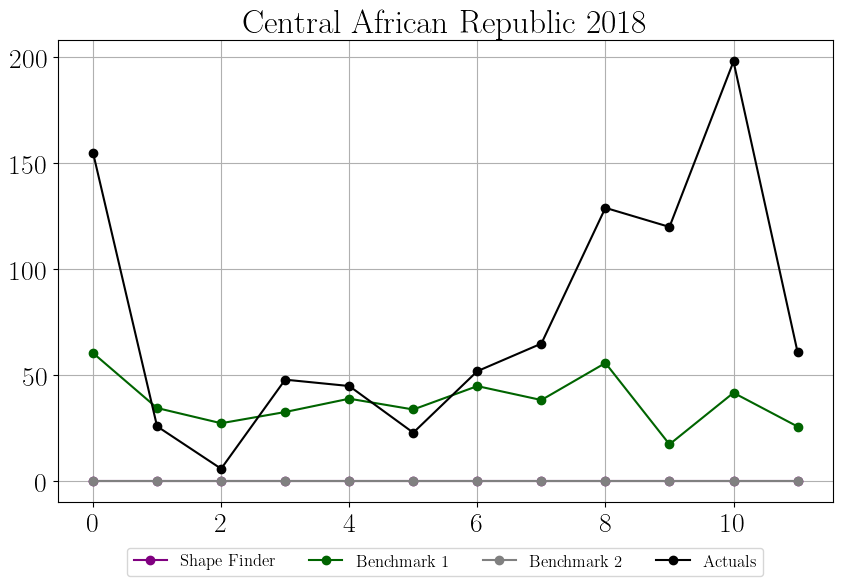

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


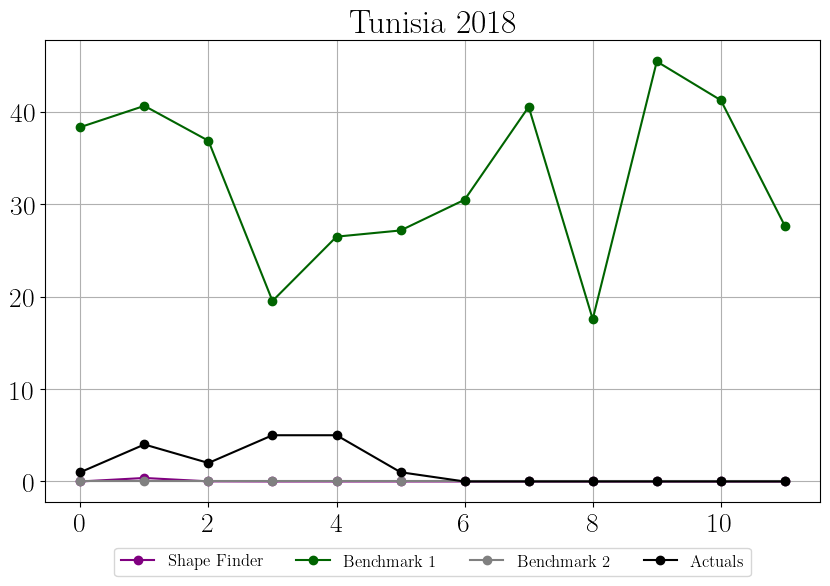

No patterns found to predict. Maybe increase the minimum distance.


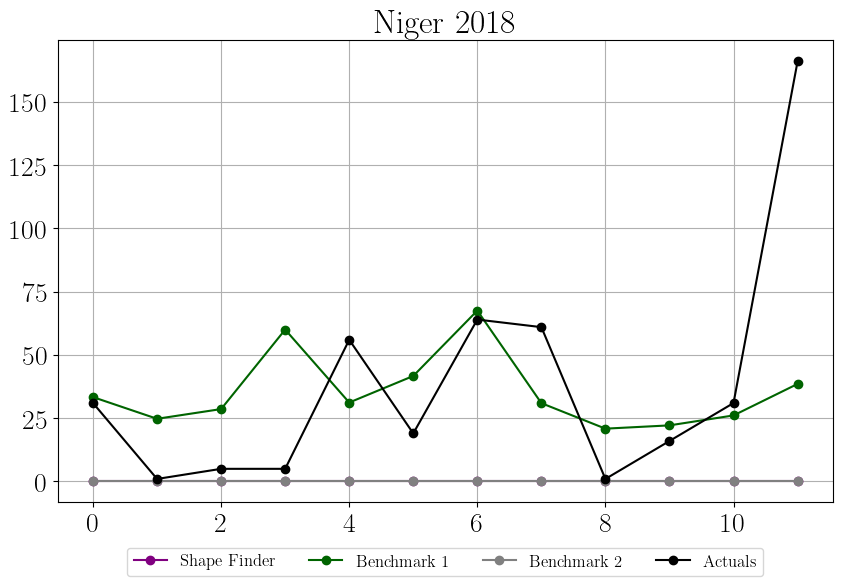

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


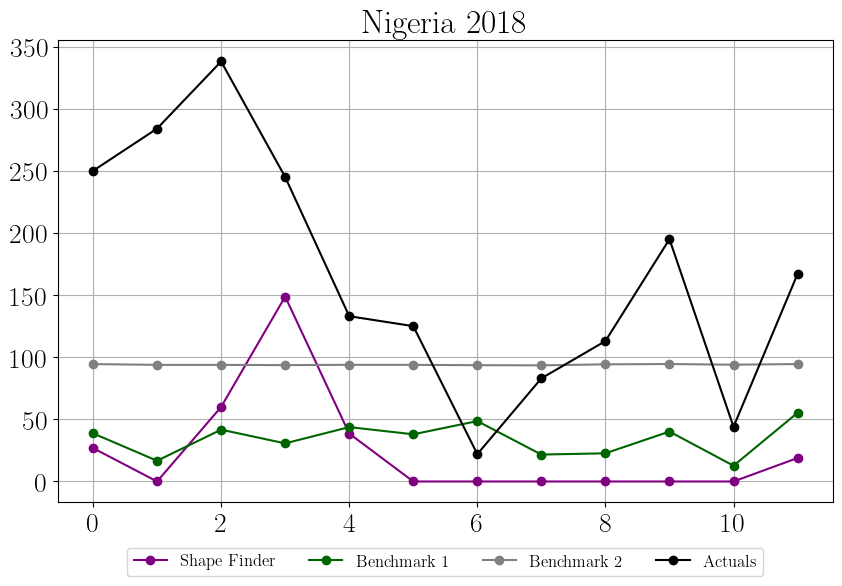

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


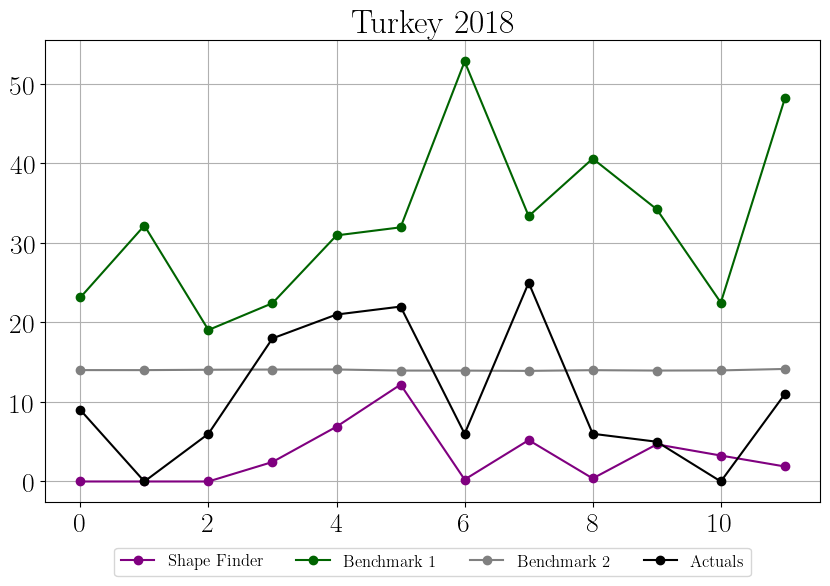

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


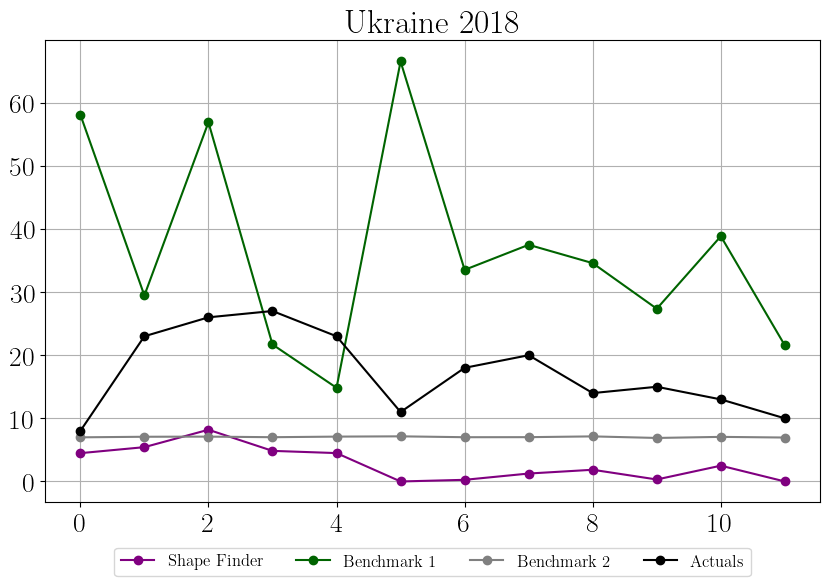

No patterns found to predict. Maybe increase the minimum distance.


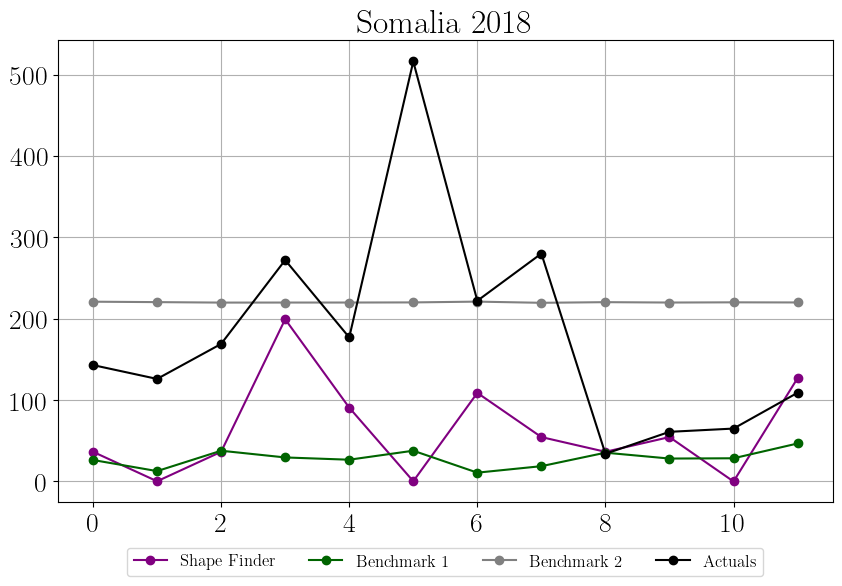

No patterns found to predict. Maybe increase the minimum distance.


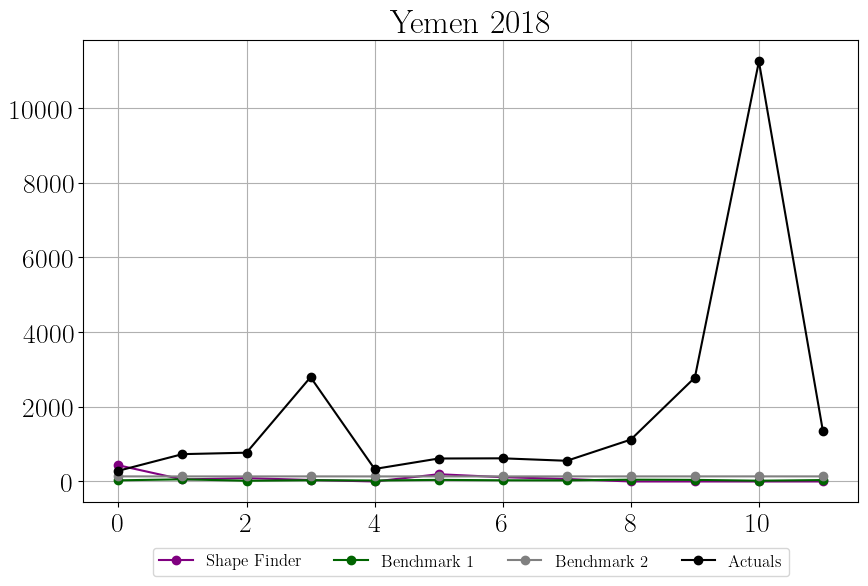

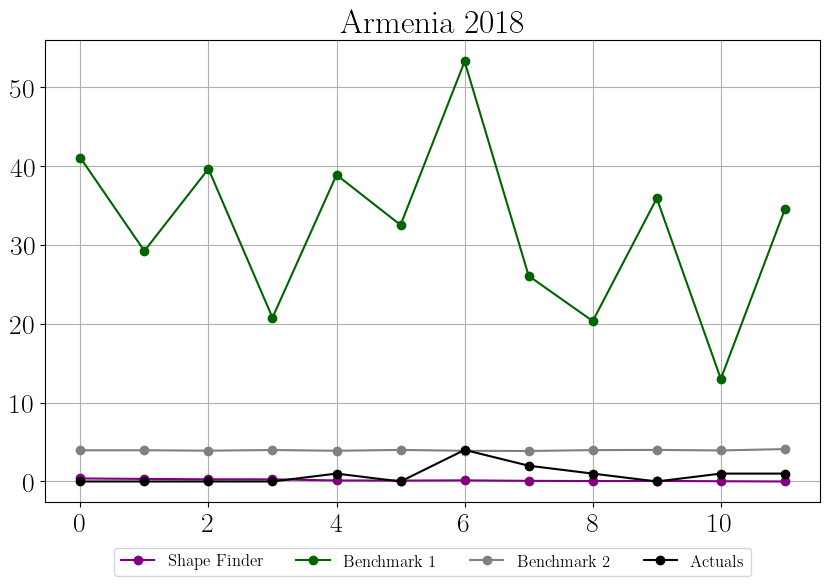

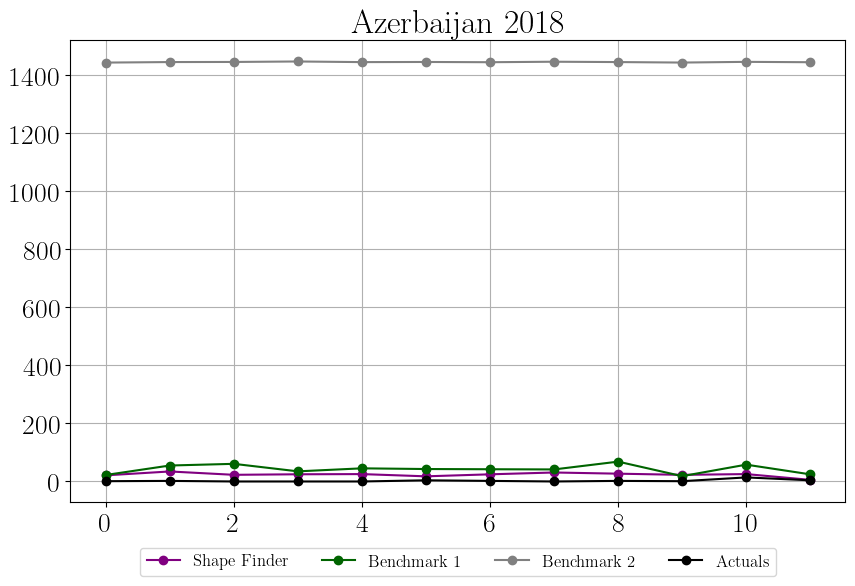

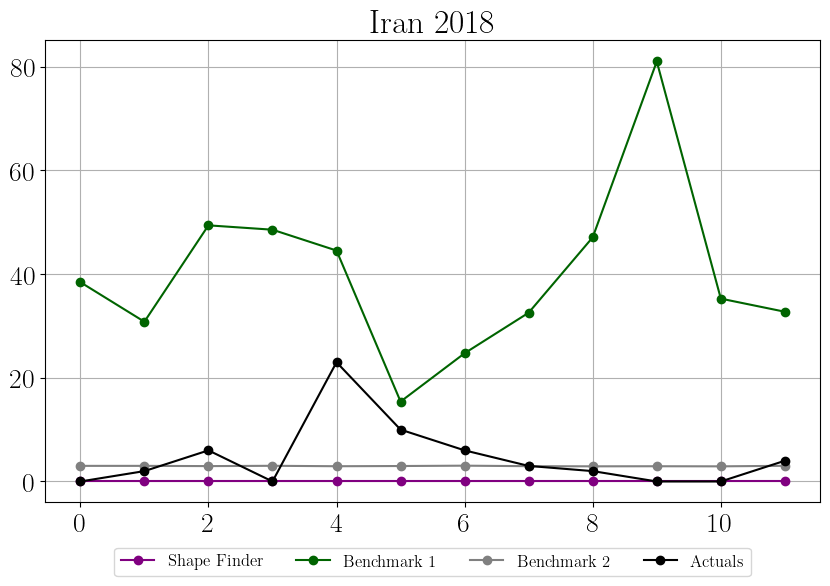

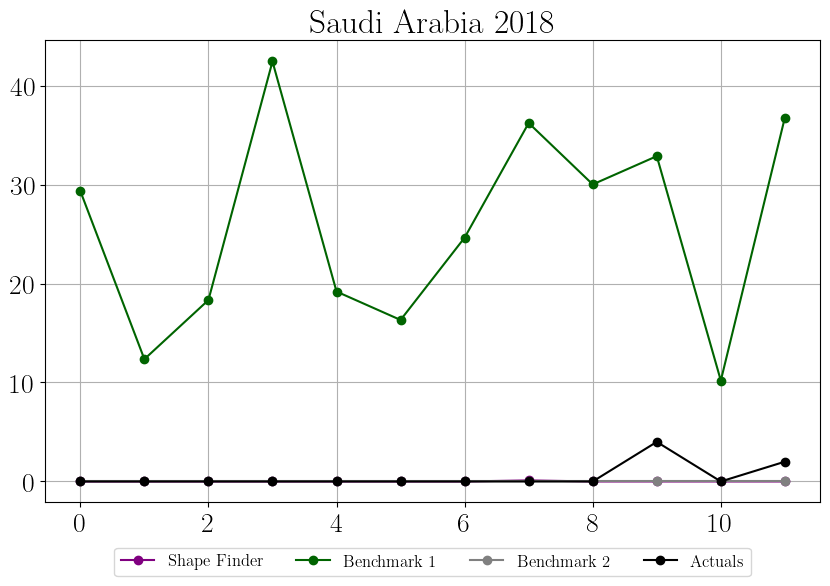

No patterns found to predict. Maybe increase the minimum distance.


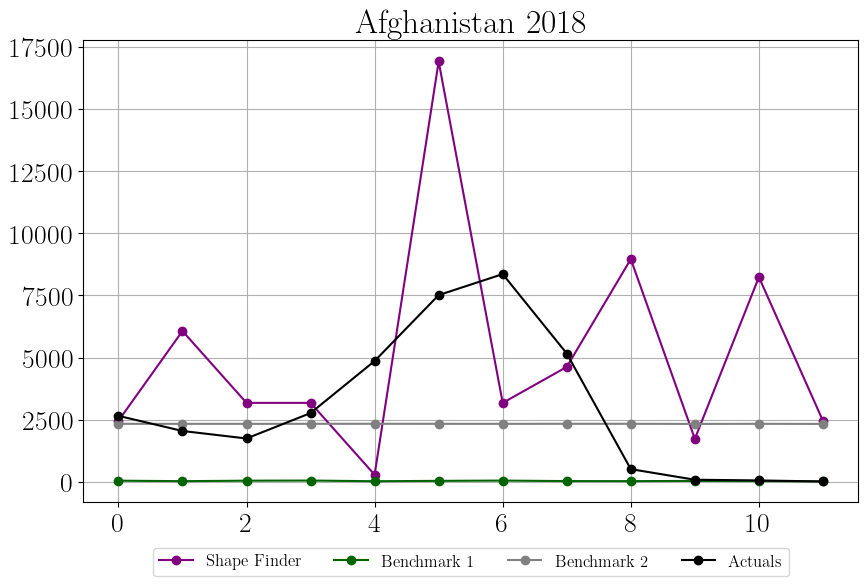

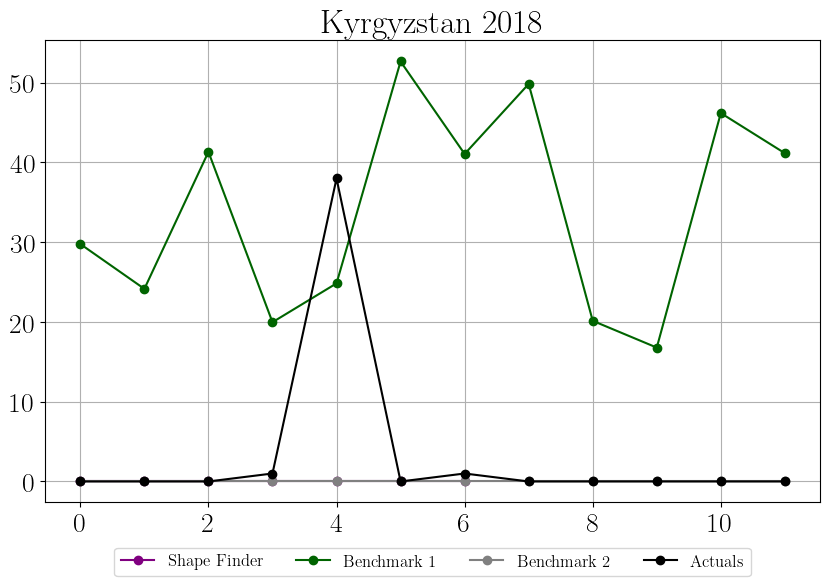

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


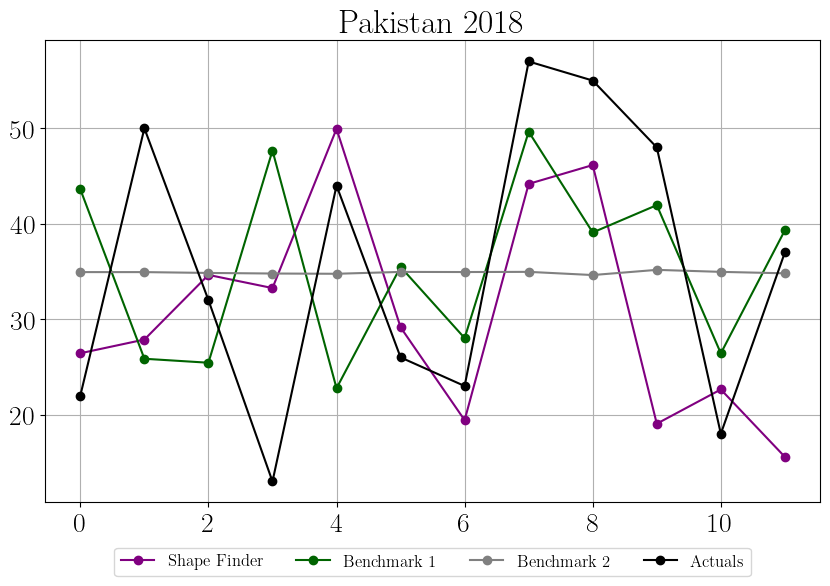

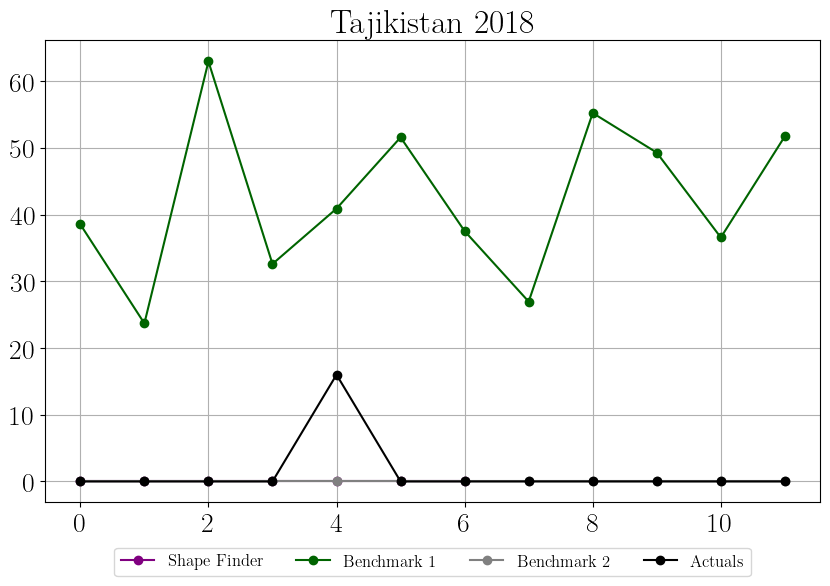

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


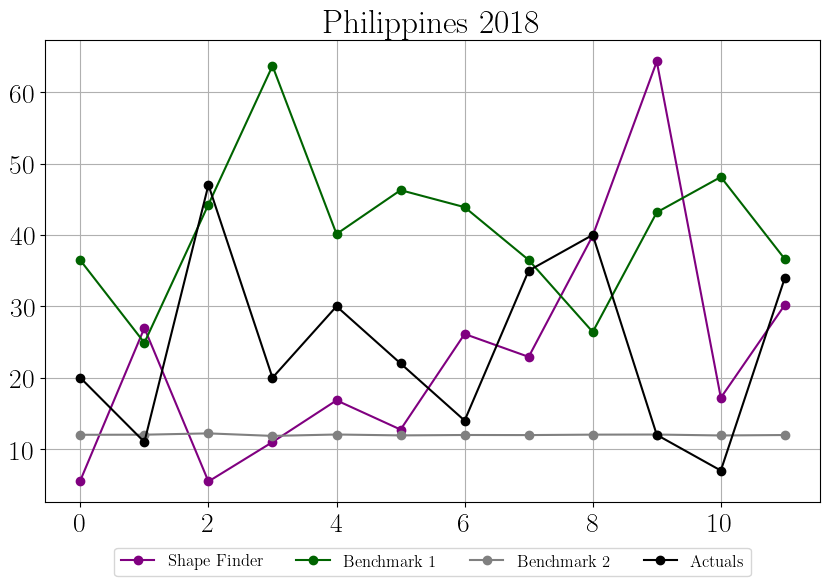

No patterns found to predict. Maybe increase the minimum distance.


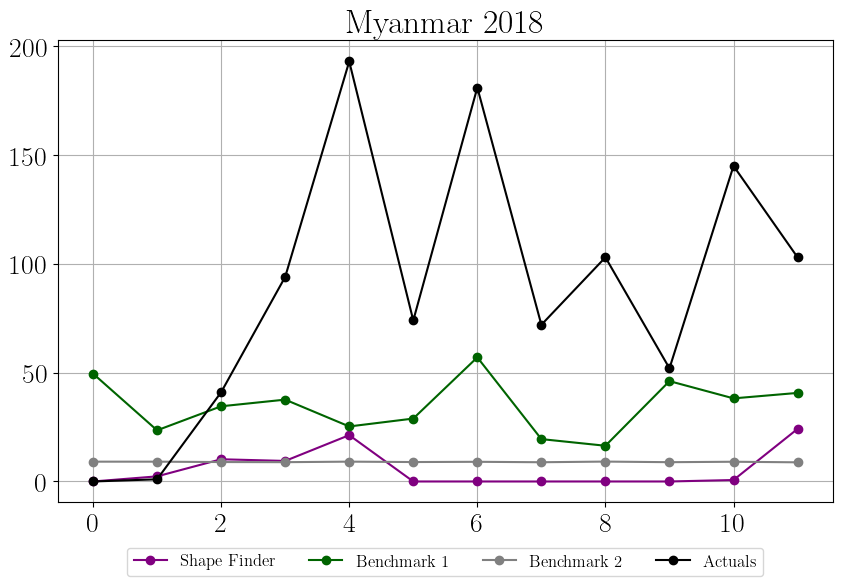

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


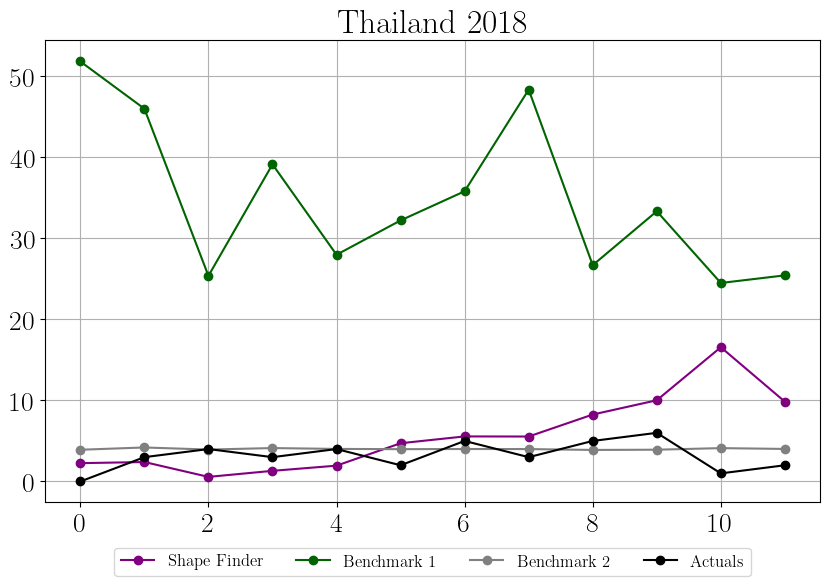

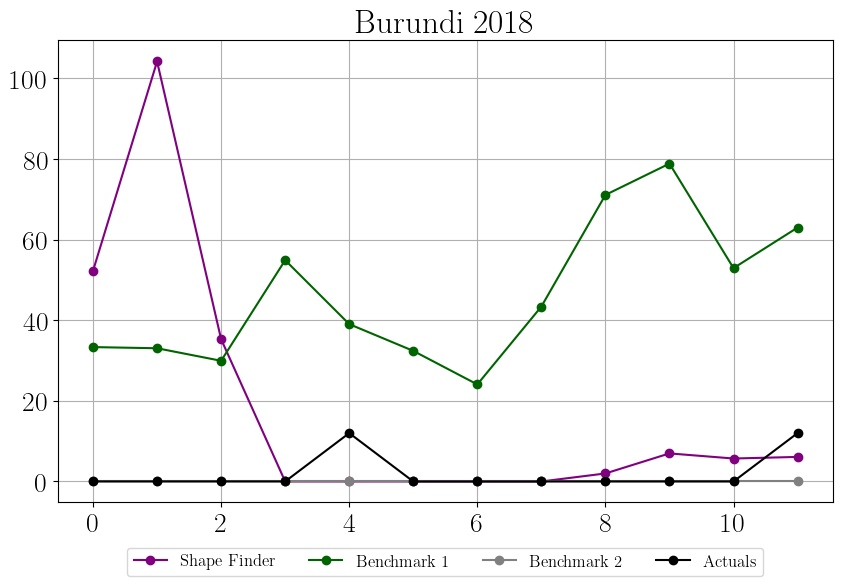

No patterns found to predict. Maybe increase the minimum distance.


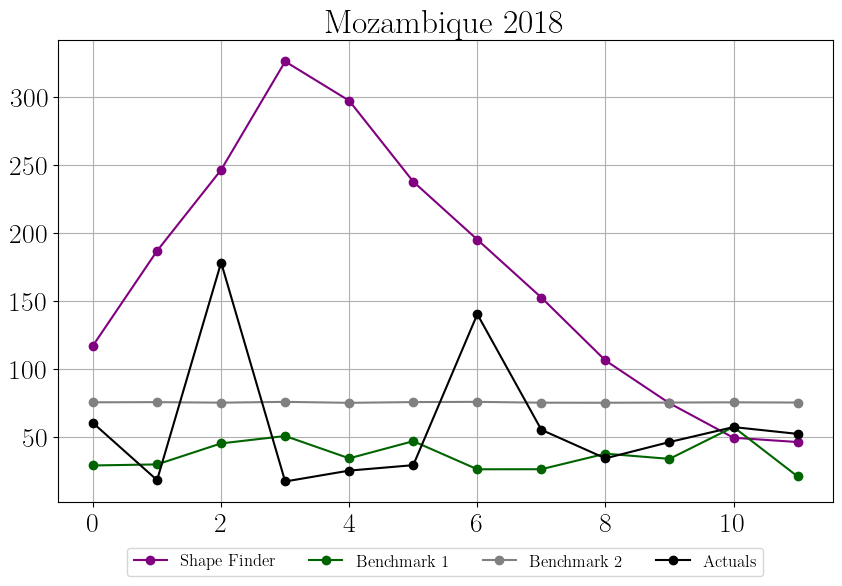

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


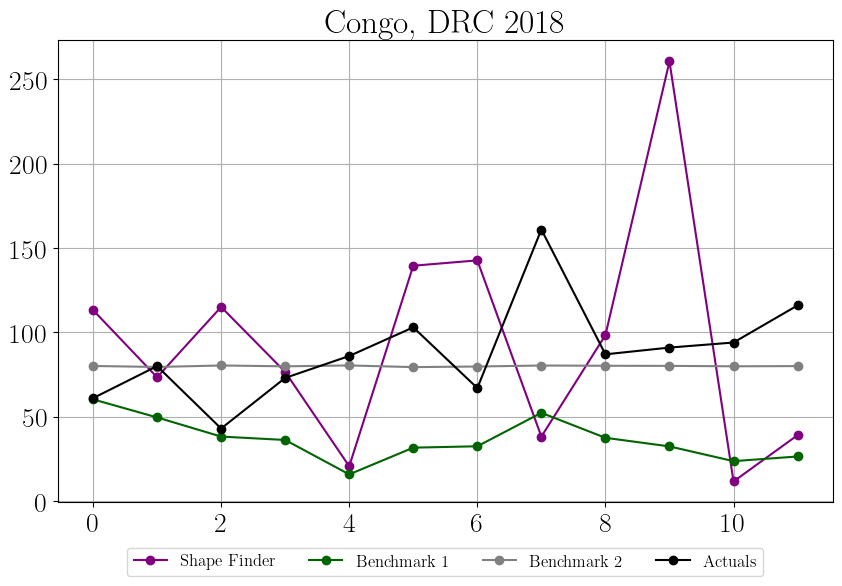

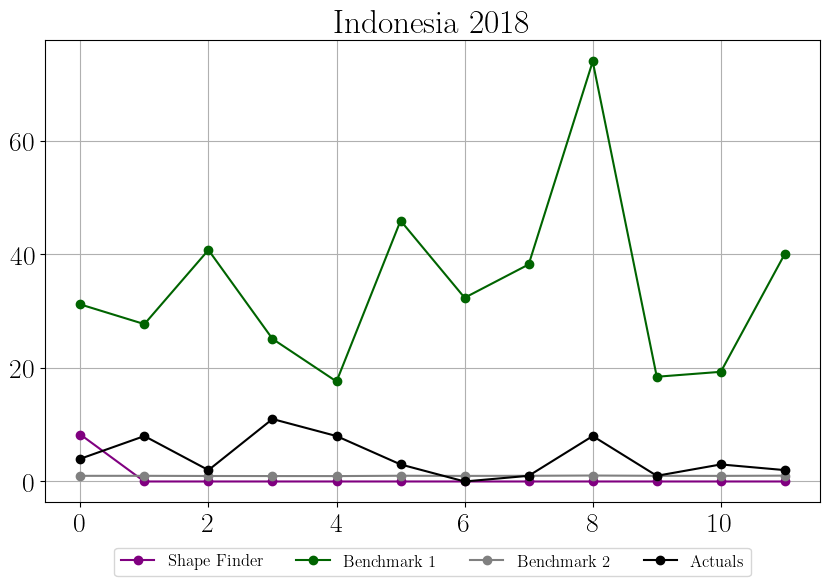

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


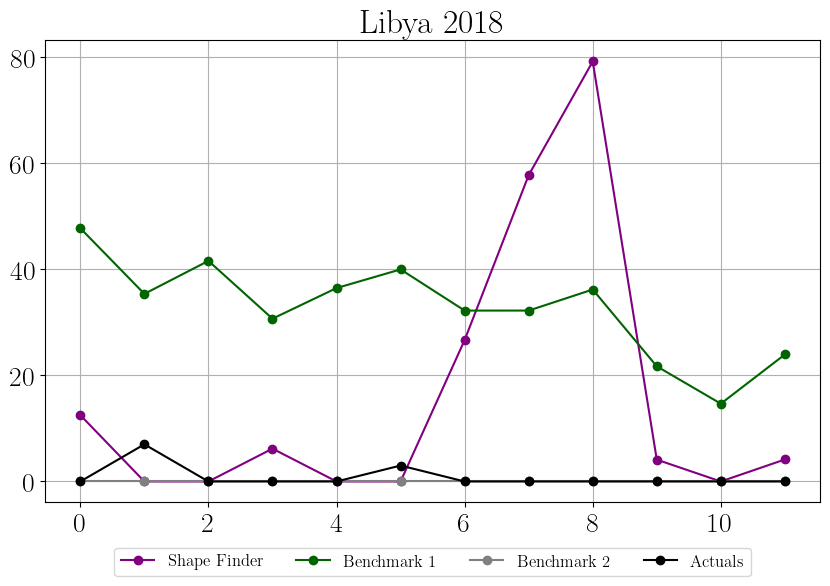

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


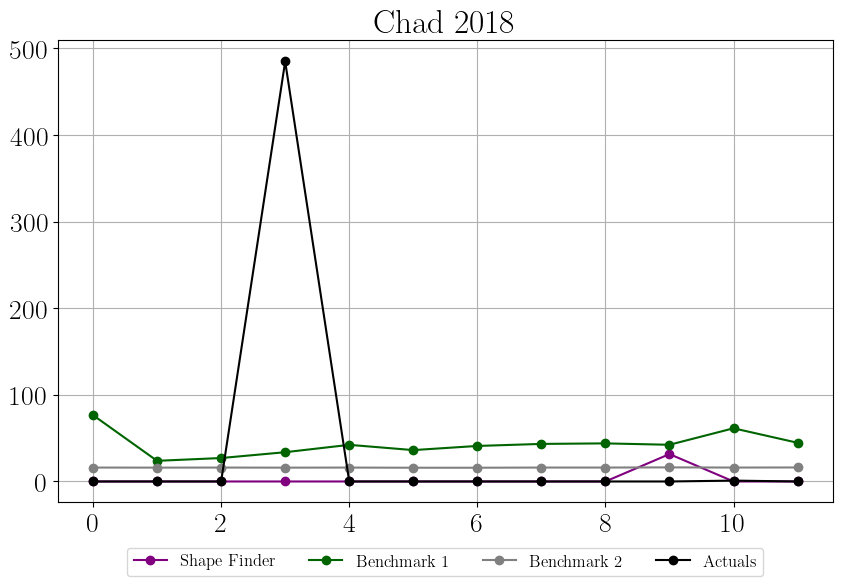

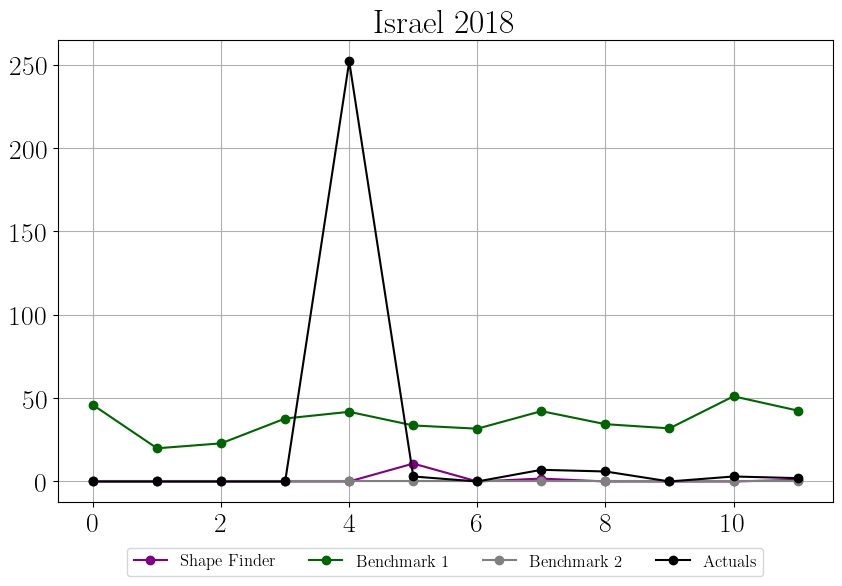

No patterns found to predict. Maybe increase the minimum distance.


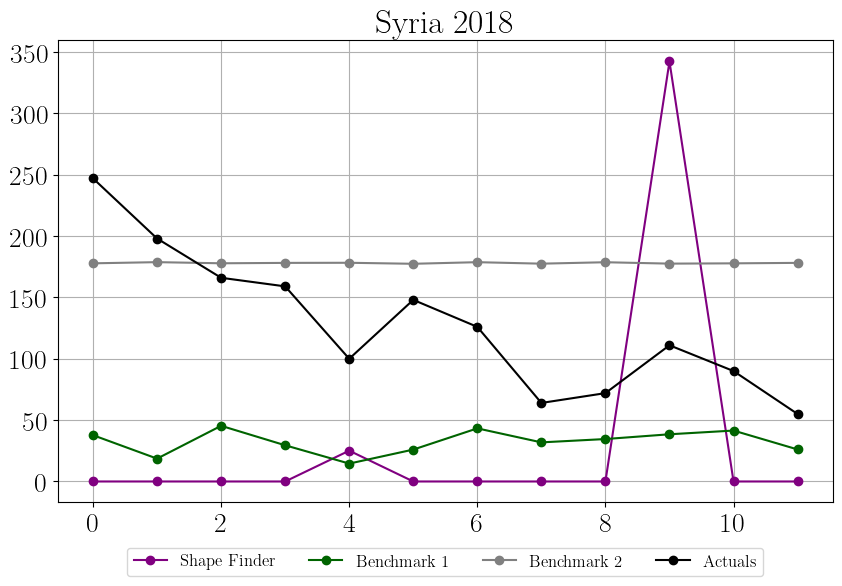

No patterns found to predict. Maybe increase the minimum distance.


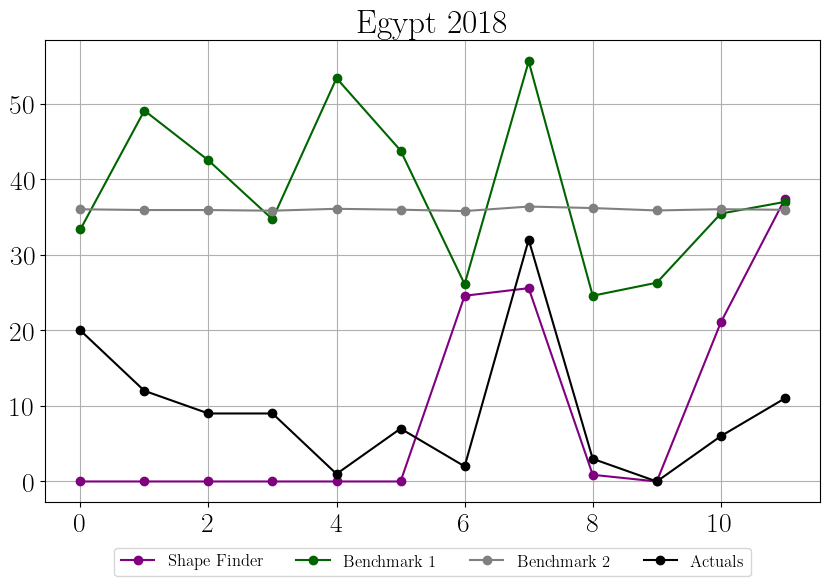

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


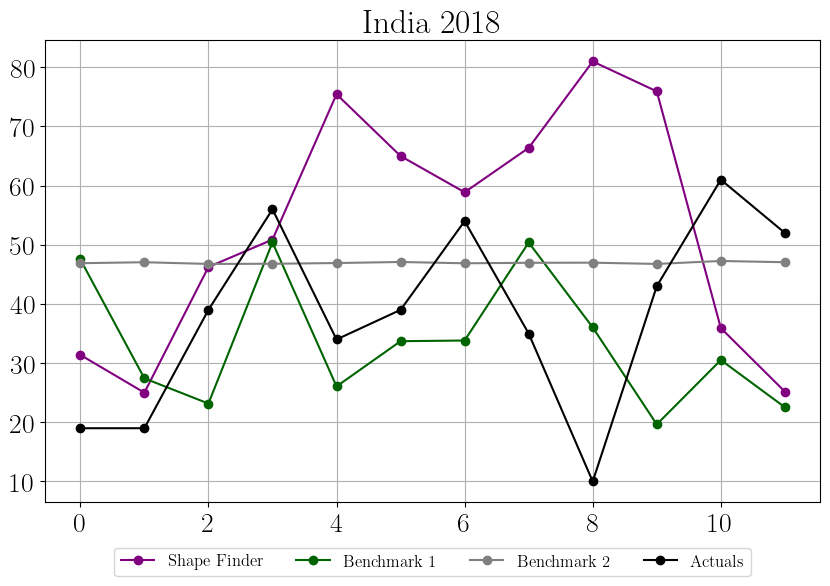

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


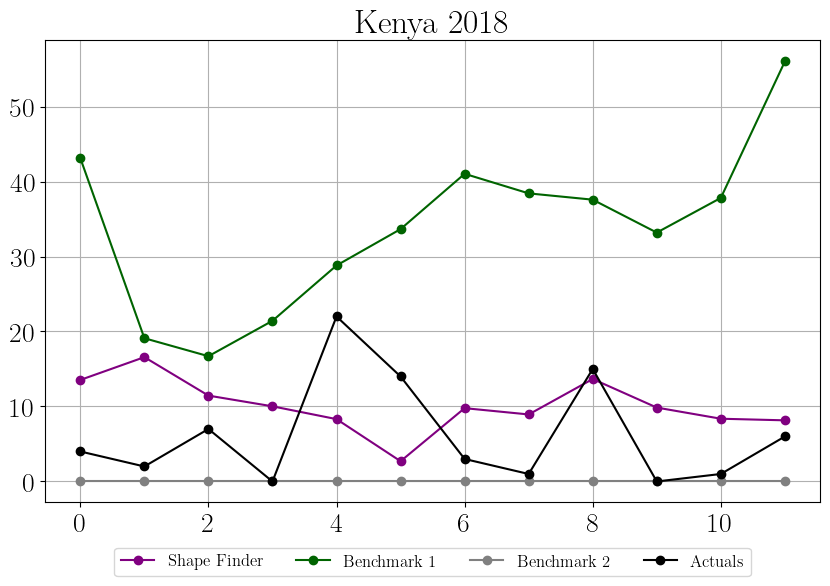

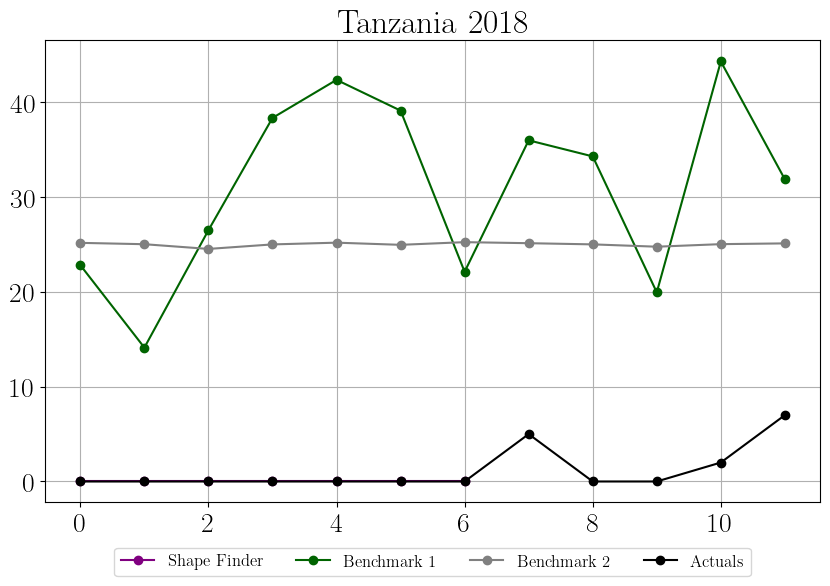

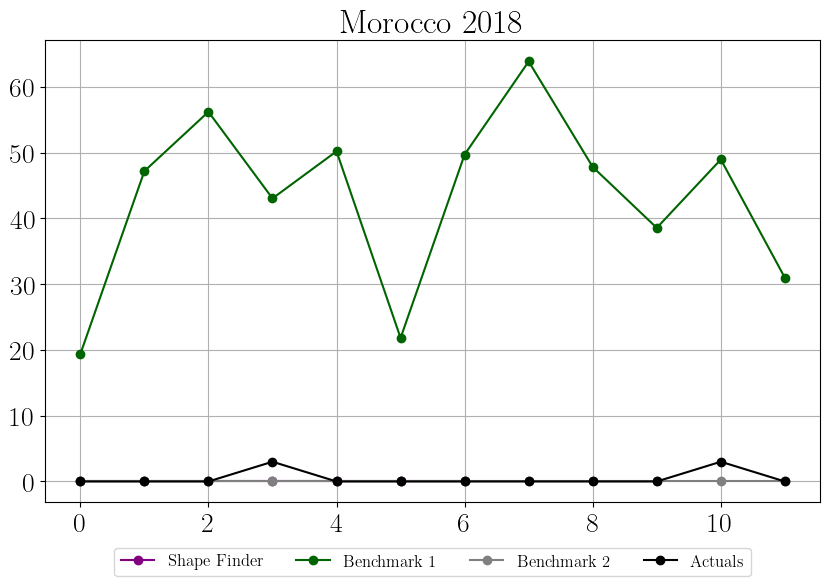

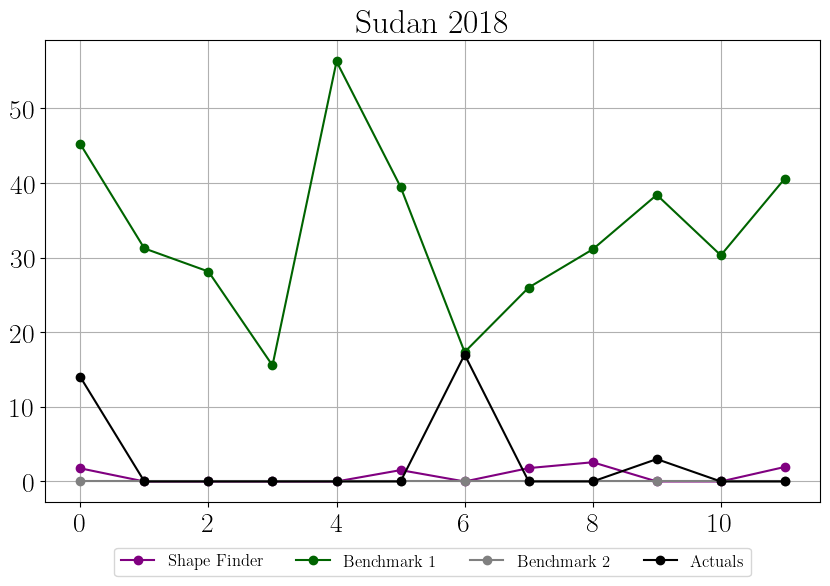

No patterns found to predict. Maybe increase the minimum distance.


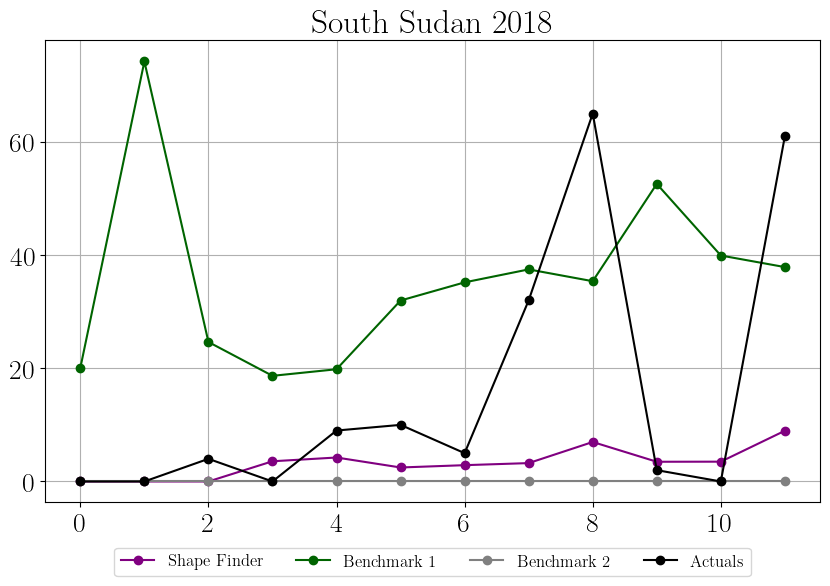

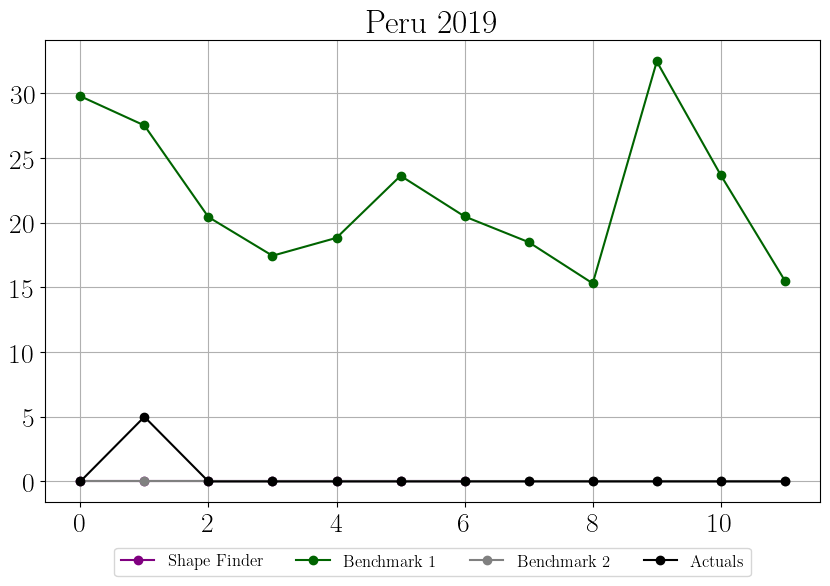

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


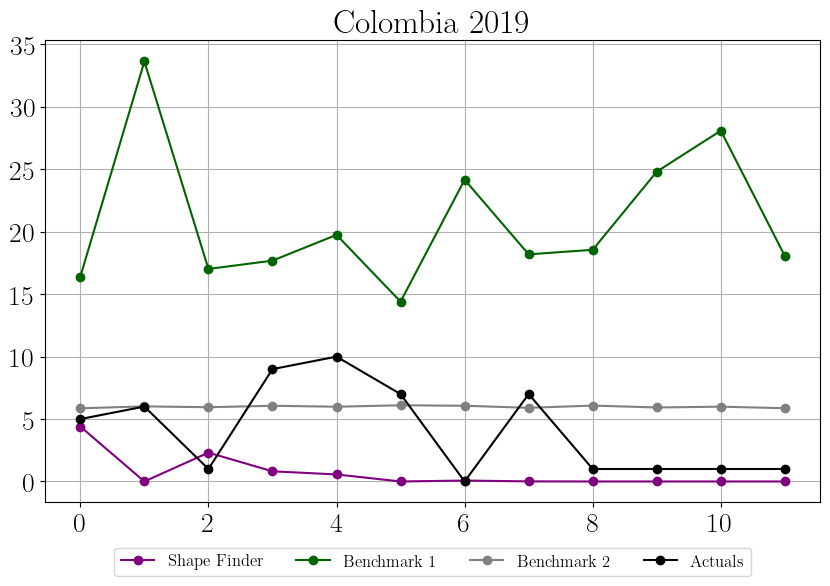

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


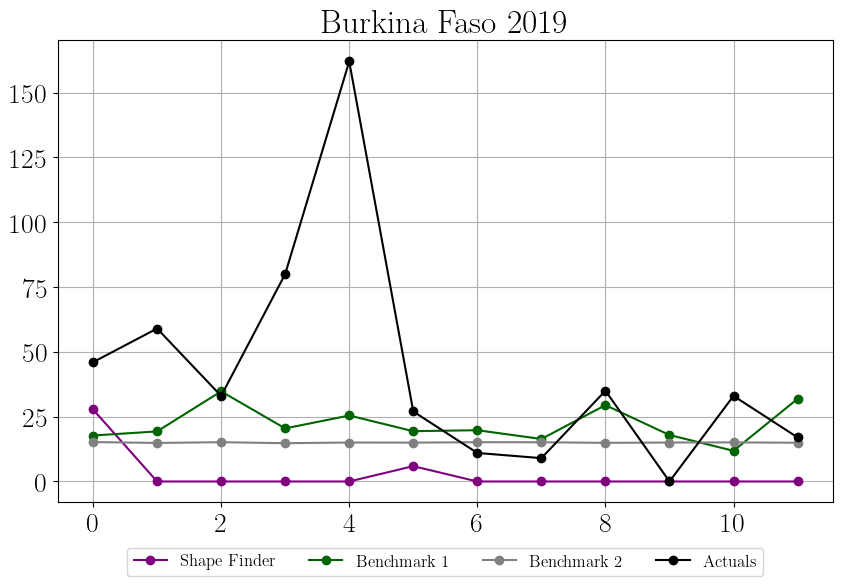

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


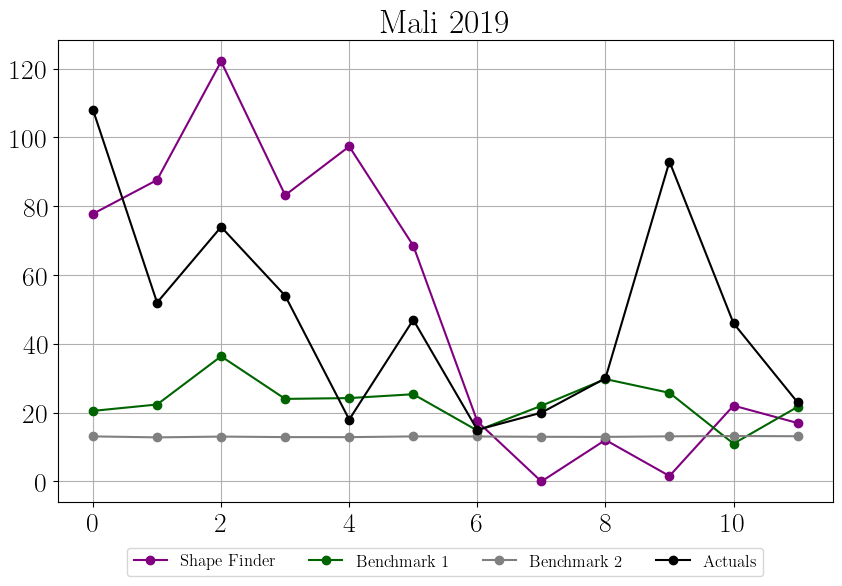

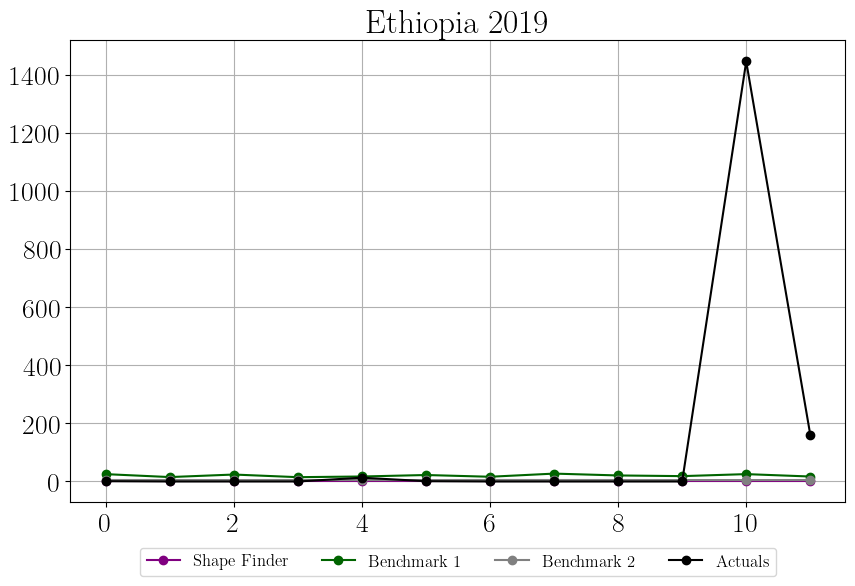

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


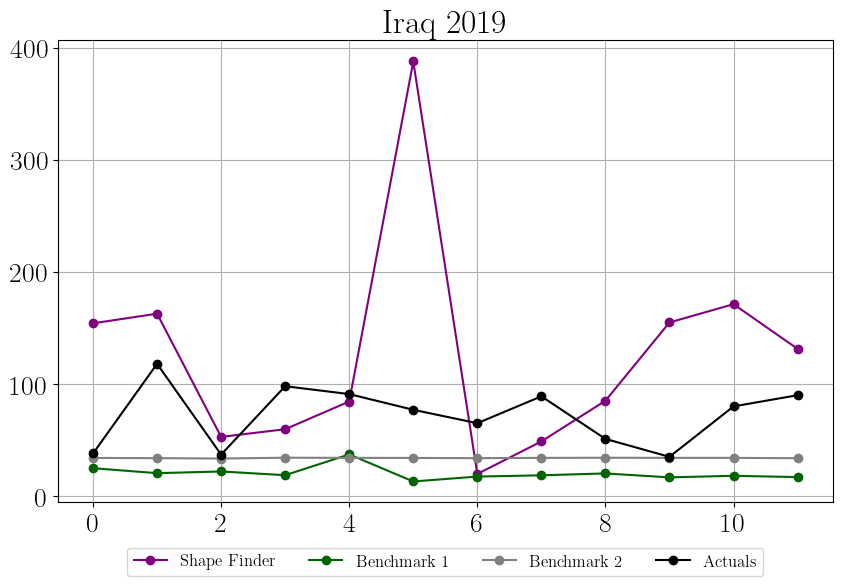

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


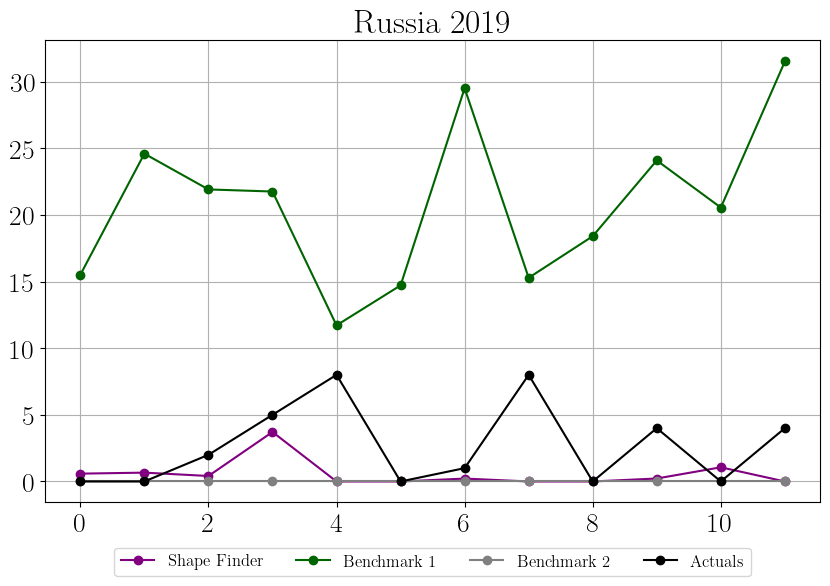

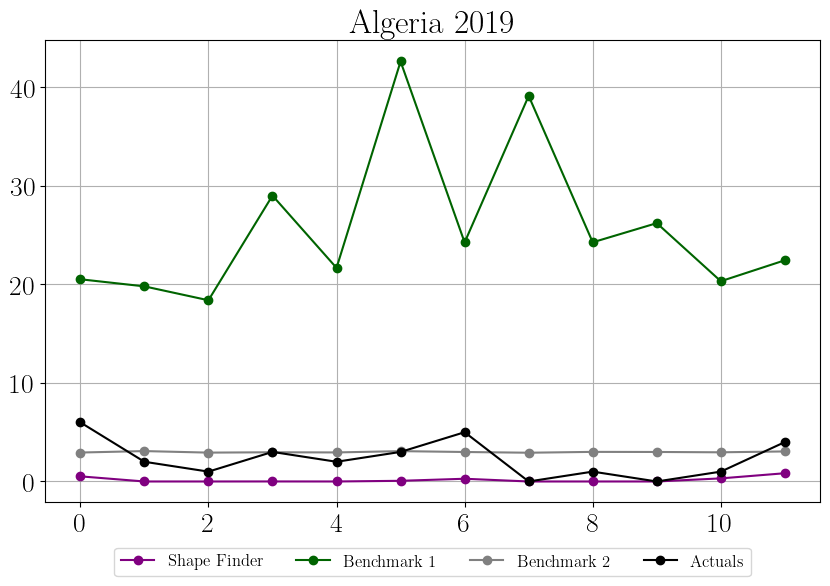

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


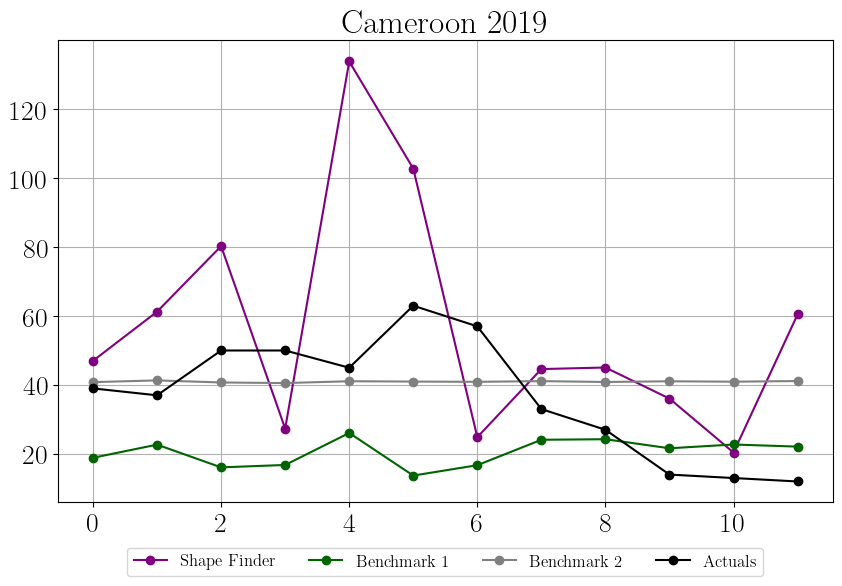

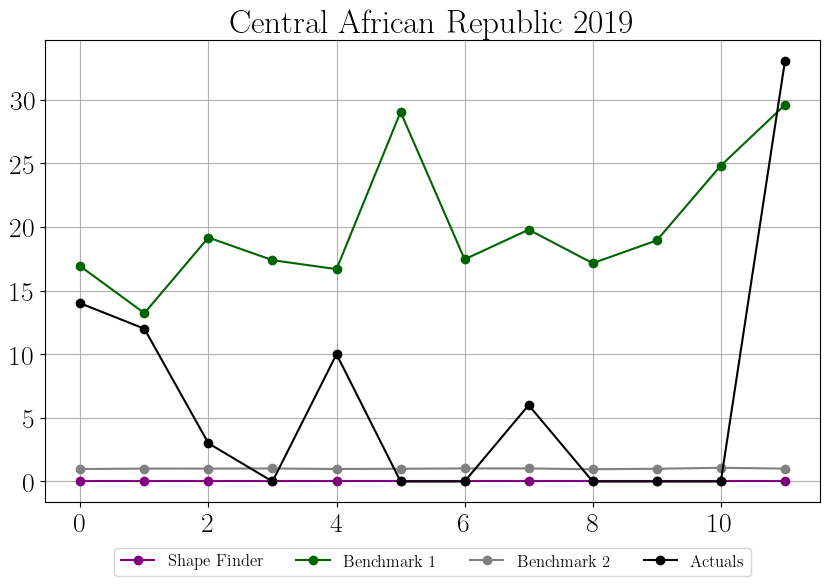

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


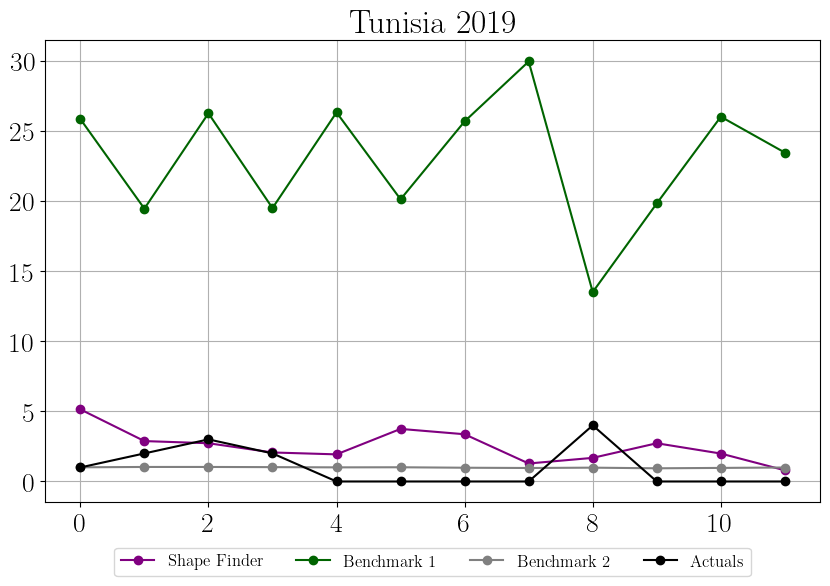

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


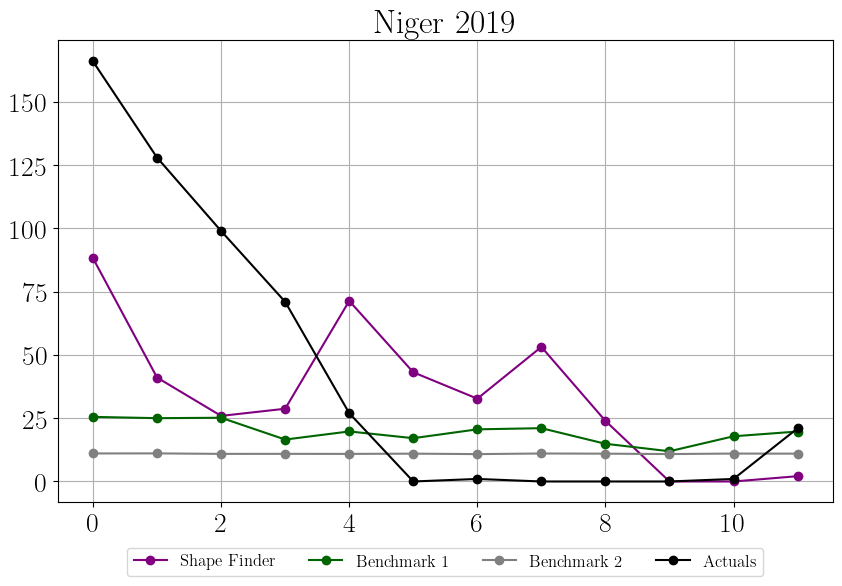

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


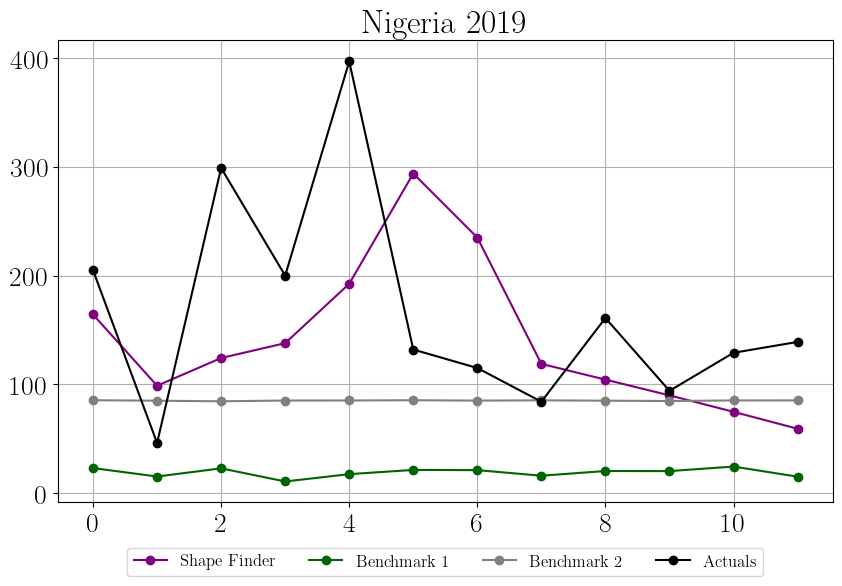

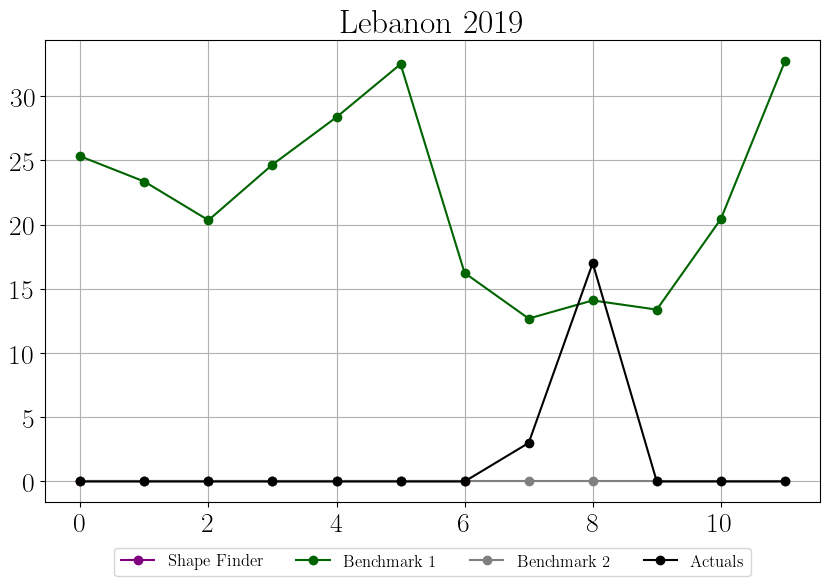

No patterns found to predict. Maybe increase the minimum distance.


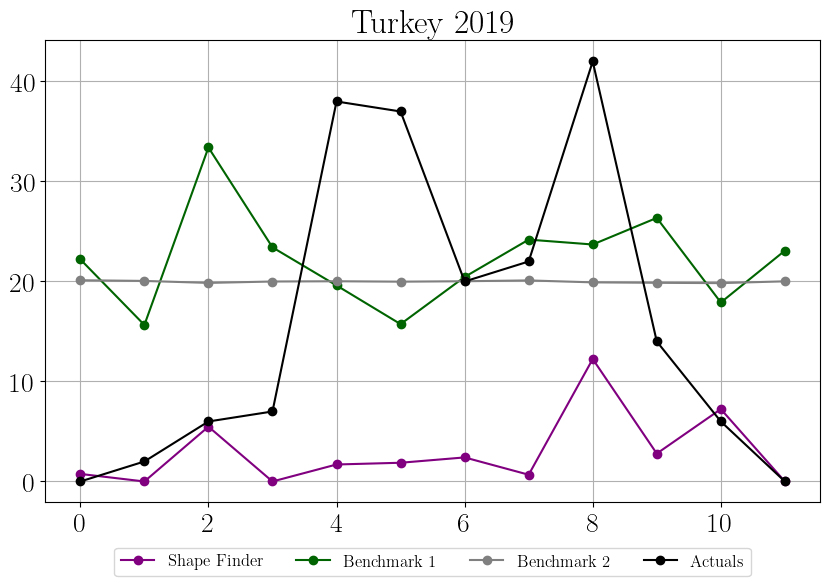

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


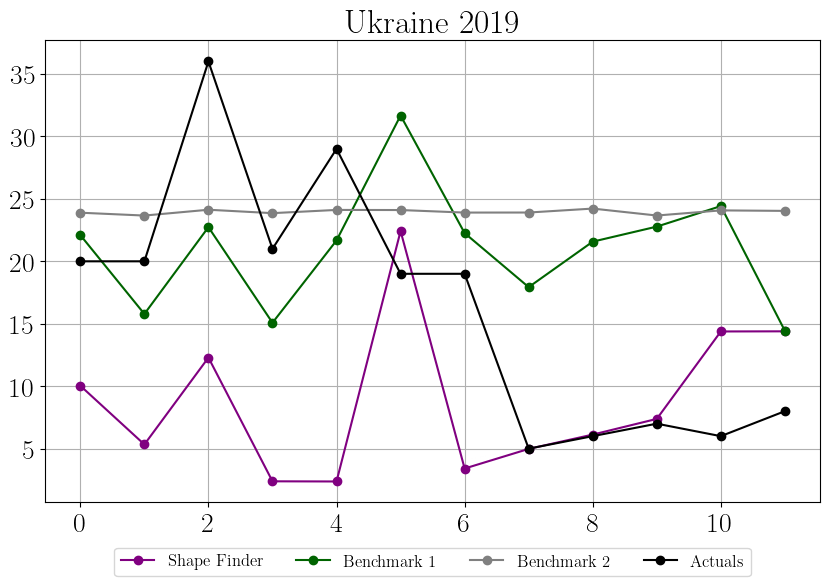

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


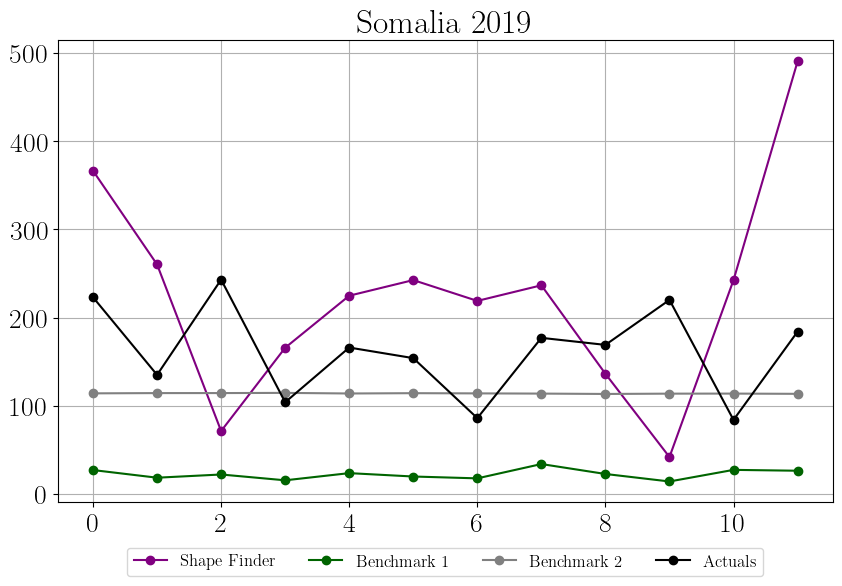

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


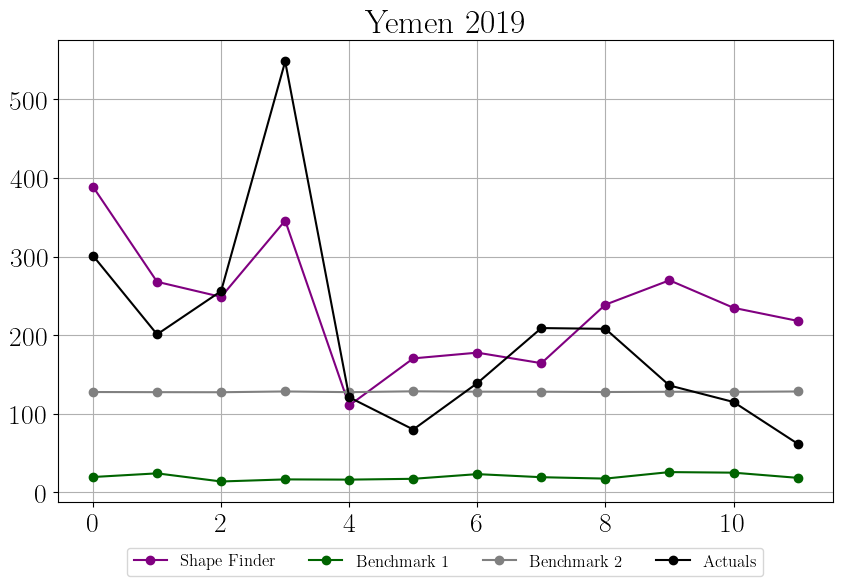

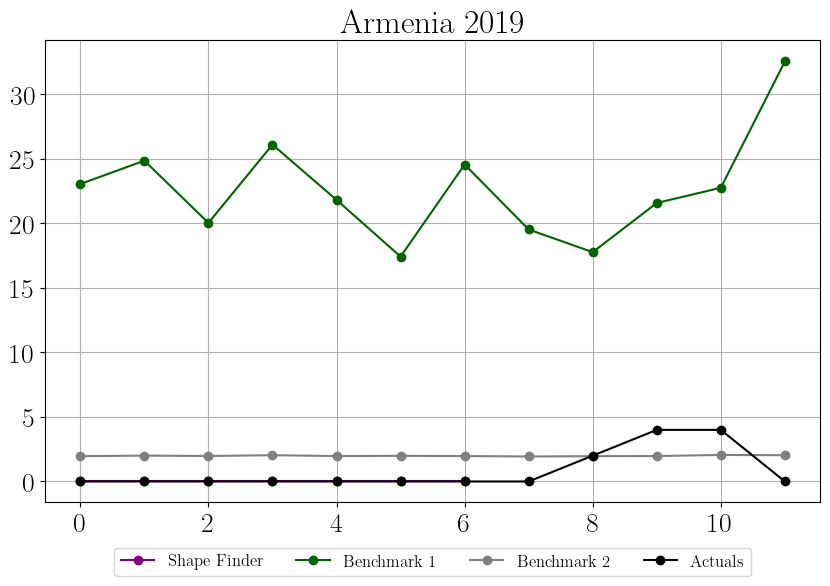

No patterns found to predict. Maybe increase the minimum distance.


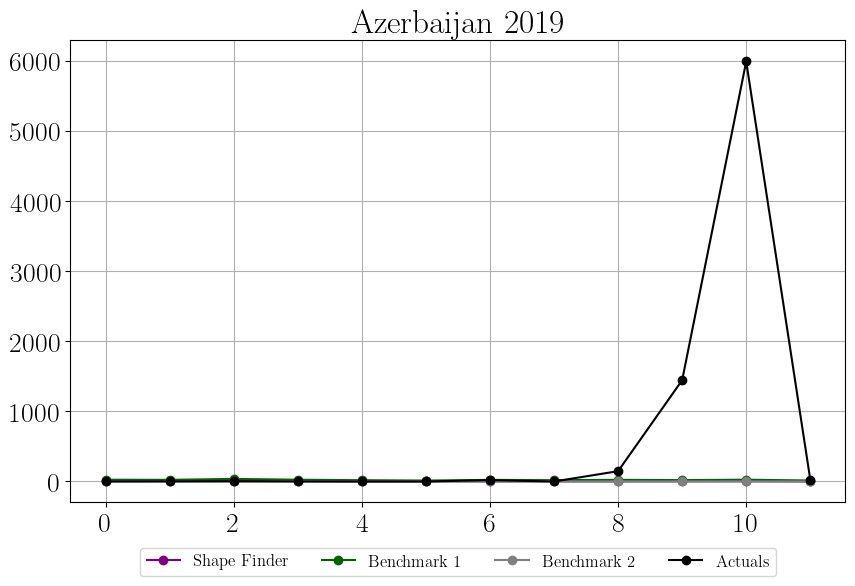

No patterns found to predict. Maybe increase the minimum distance.


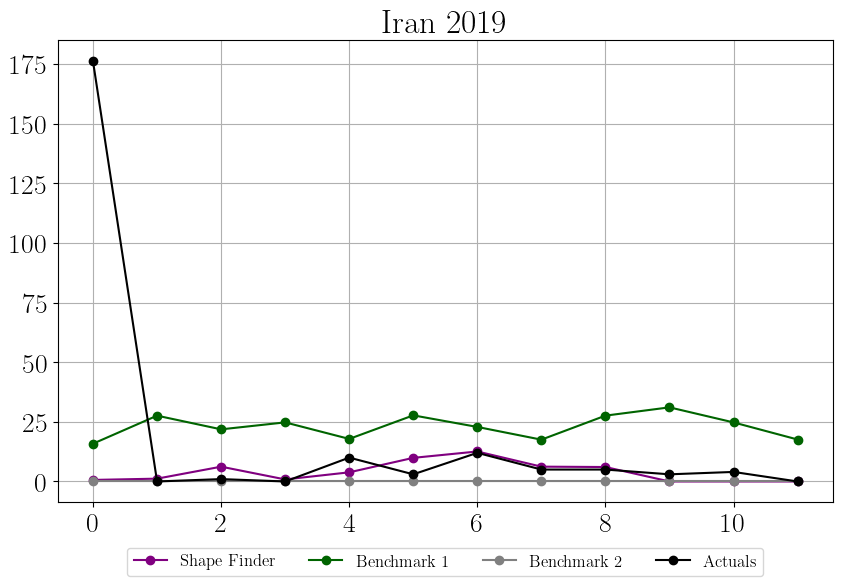

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


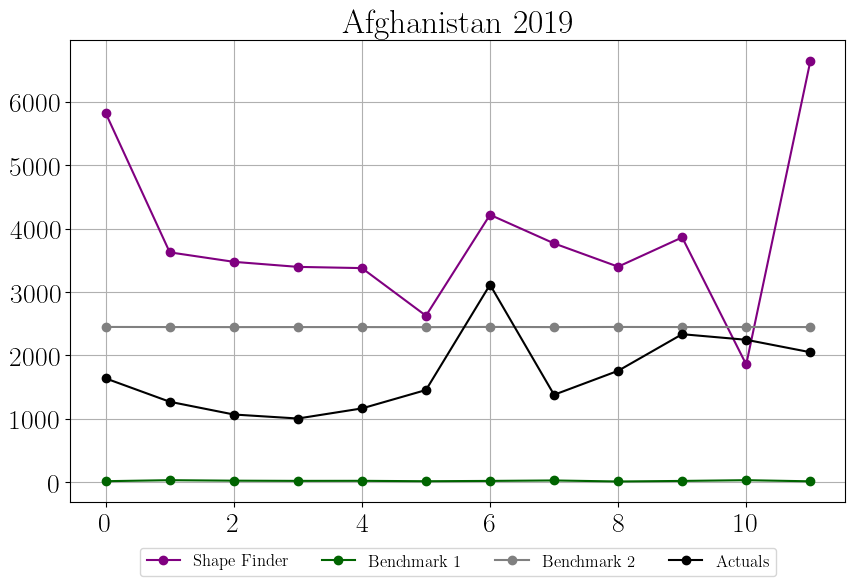

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


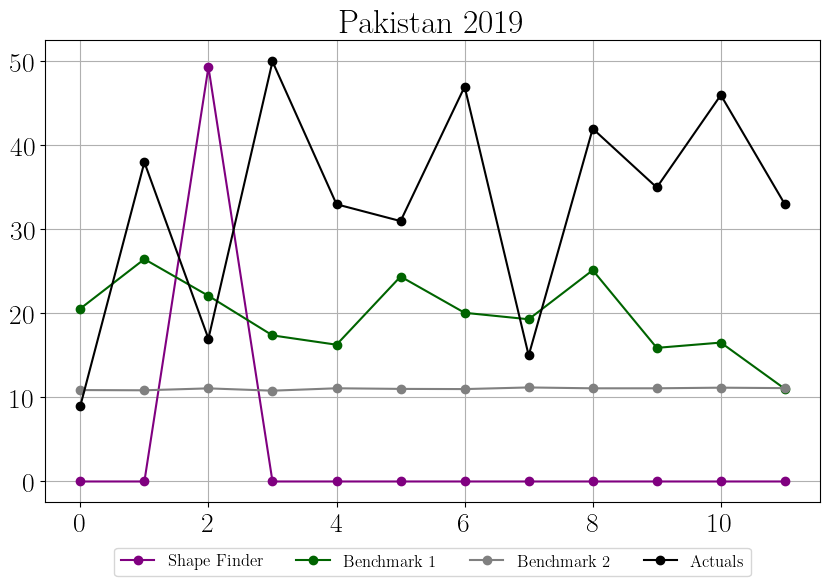

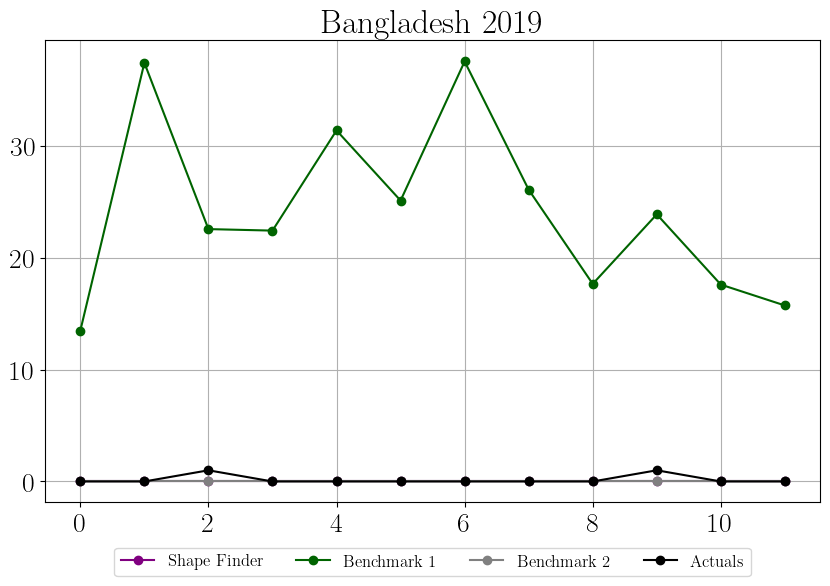

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


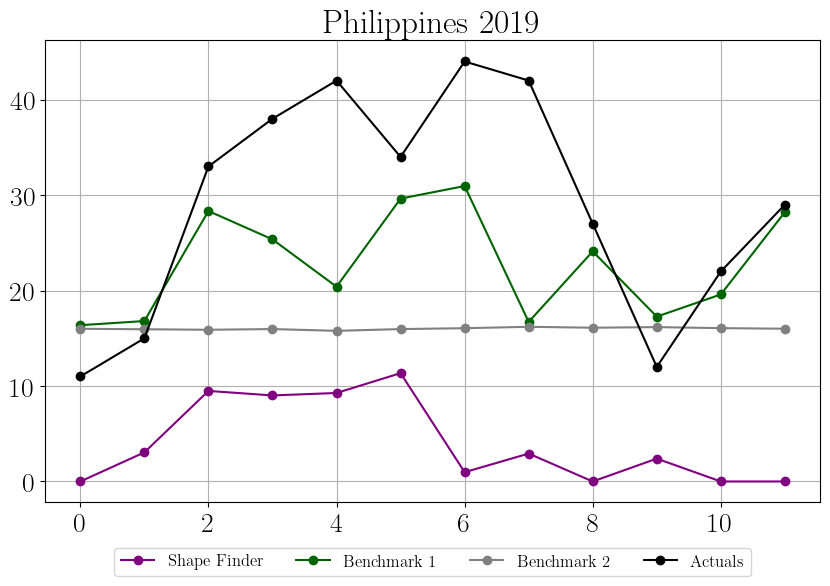

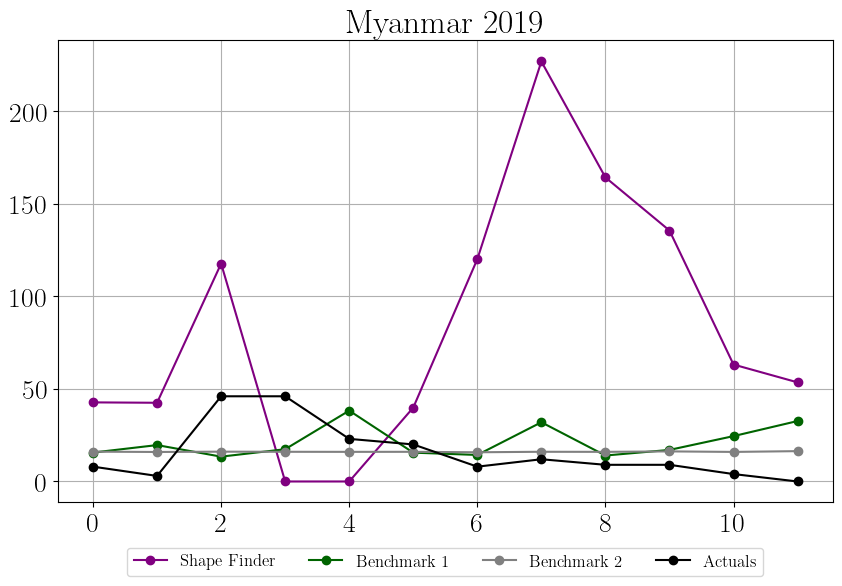

No patterns found to predict. Maybe increase the minimum distance.


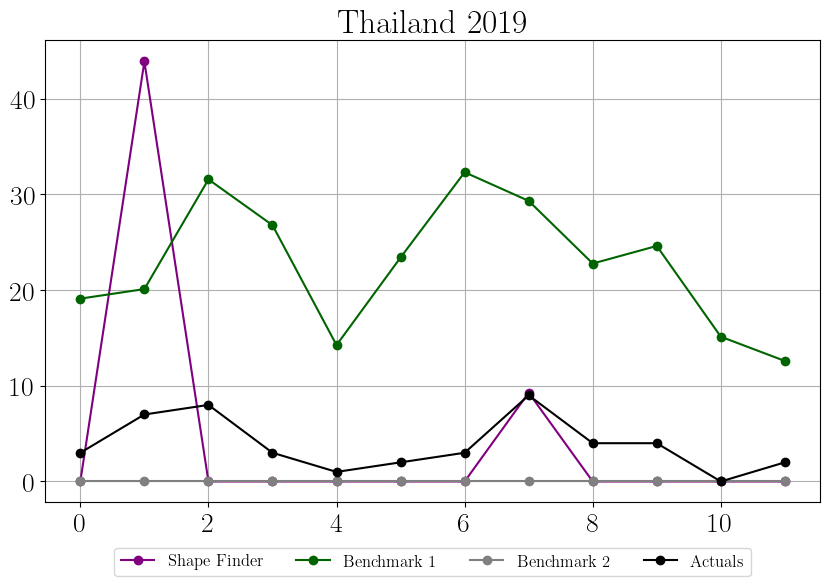

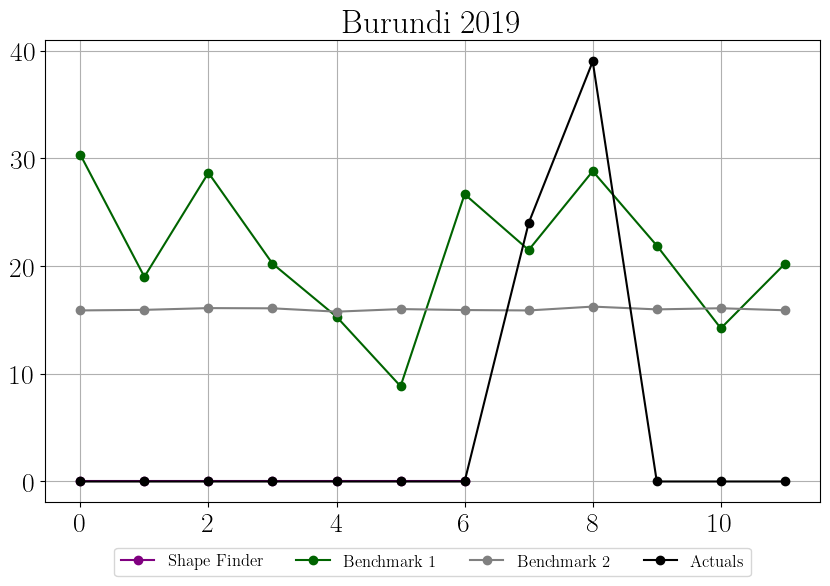

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


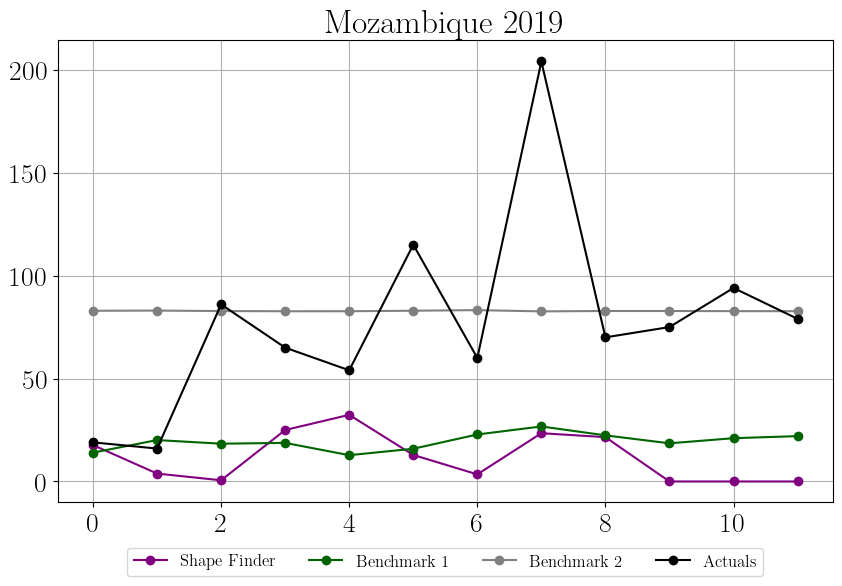

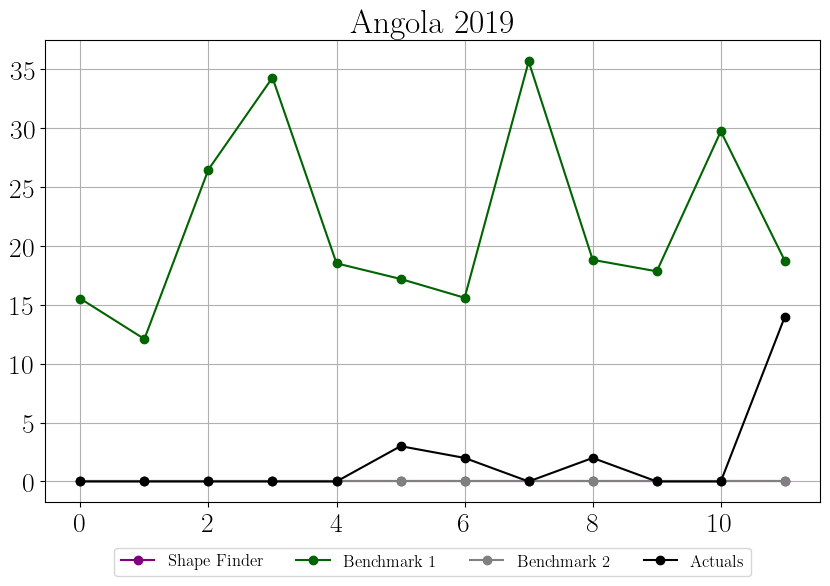

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


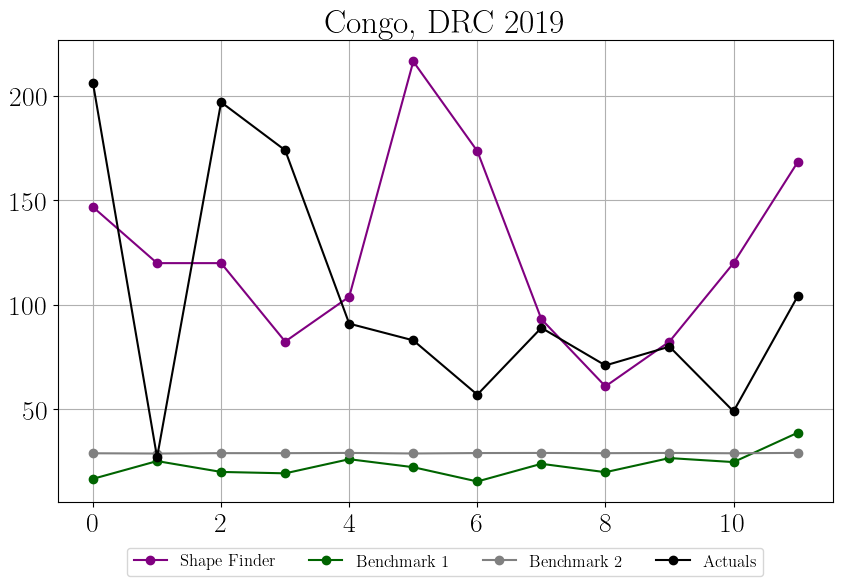

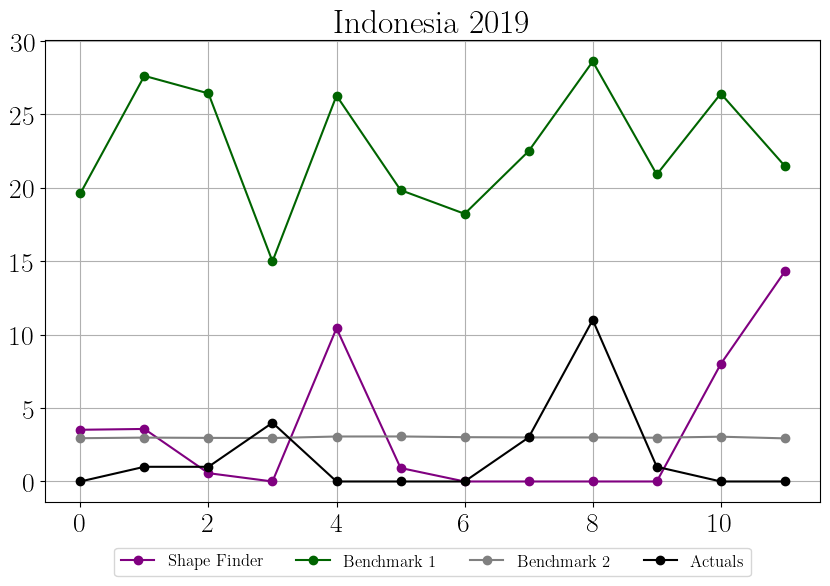

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


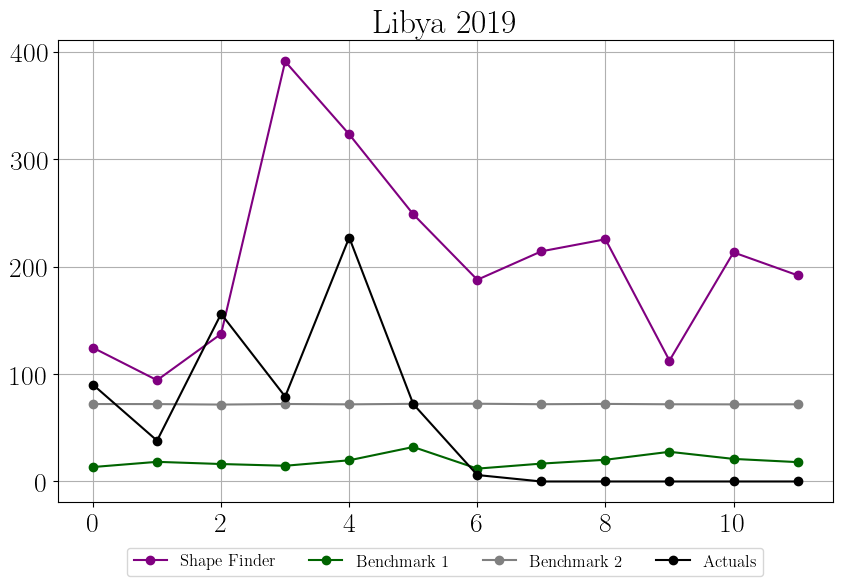

No patterns found to predict. Maybe increase the minimum distance.


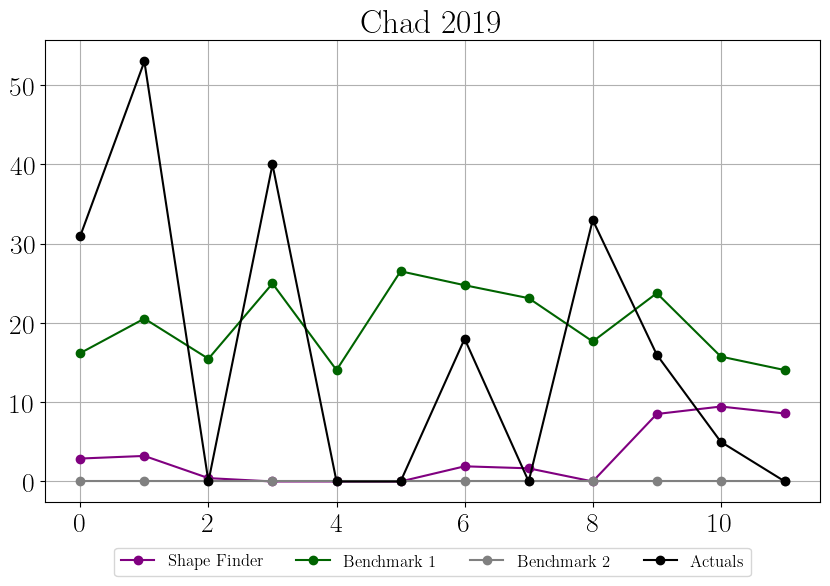

No patterns found to predict. Maybe increase the minimum distance.


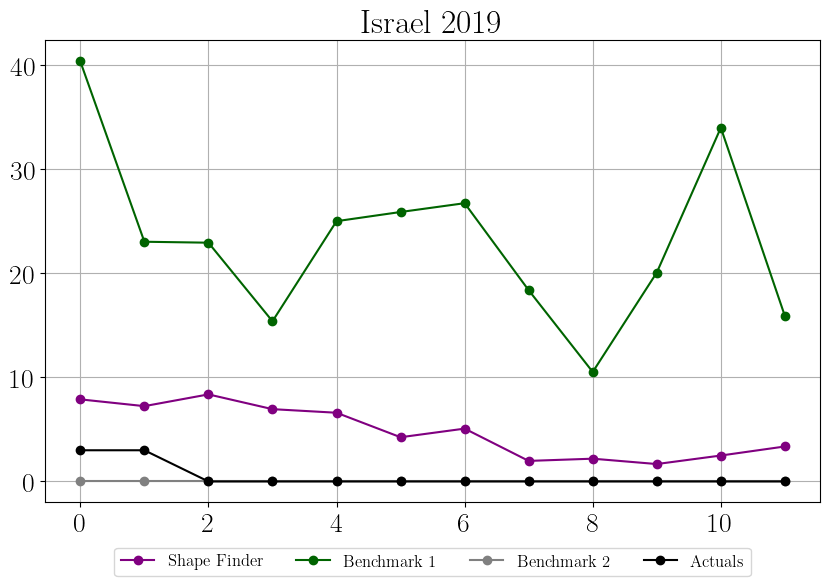

No patterns found to predict. Maybe increase the minimum distance.


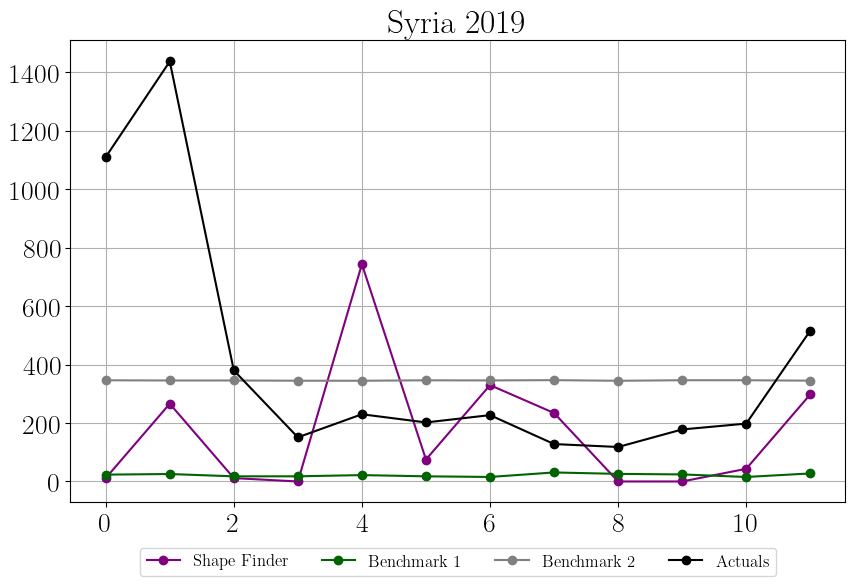

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


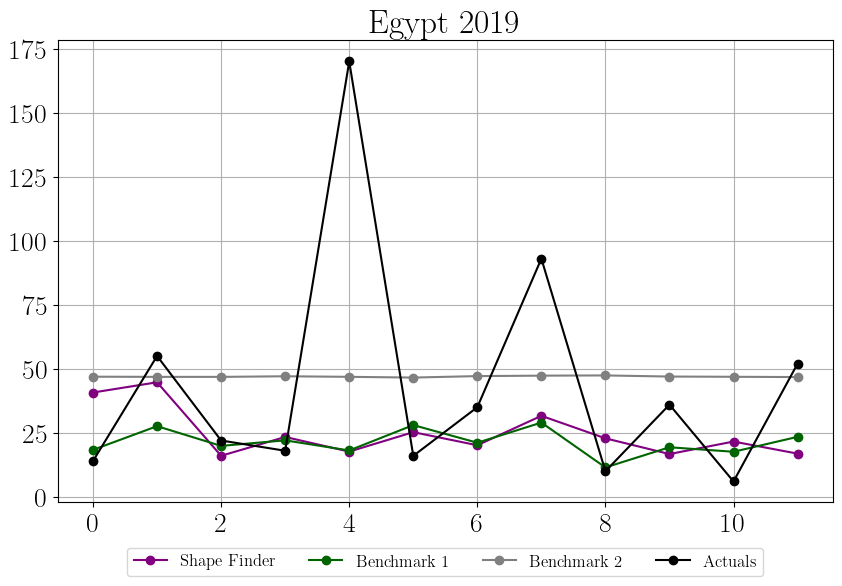

No patterns found to predict. Maybe increase the minimum distance.


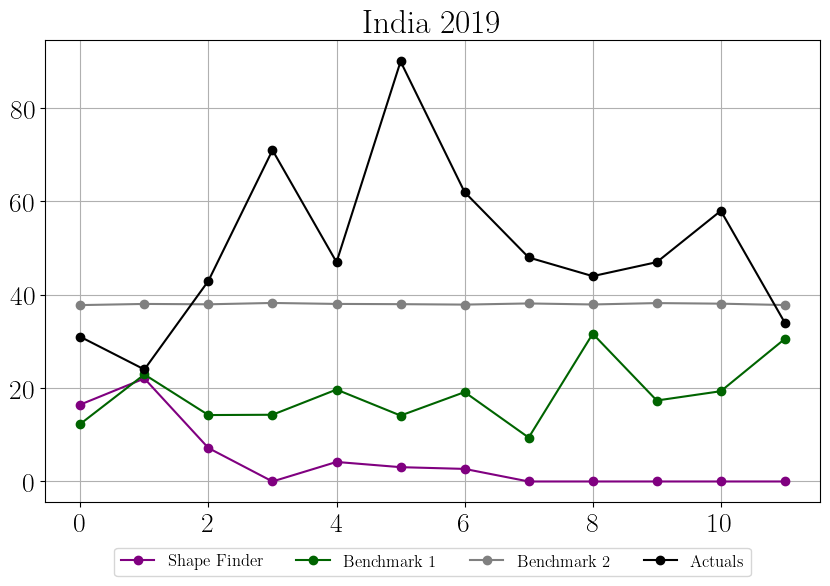

No patterns found to predict. Maybe increase the minimum distance.


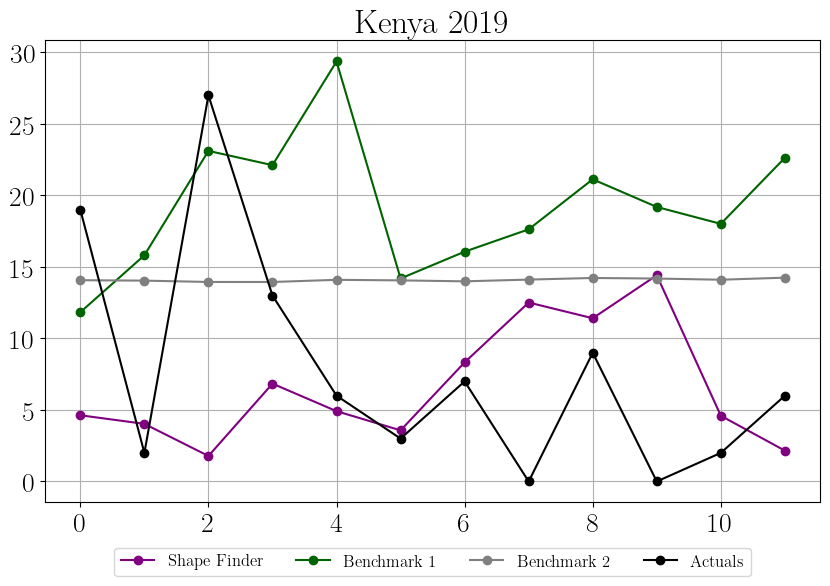

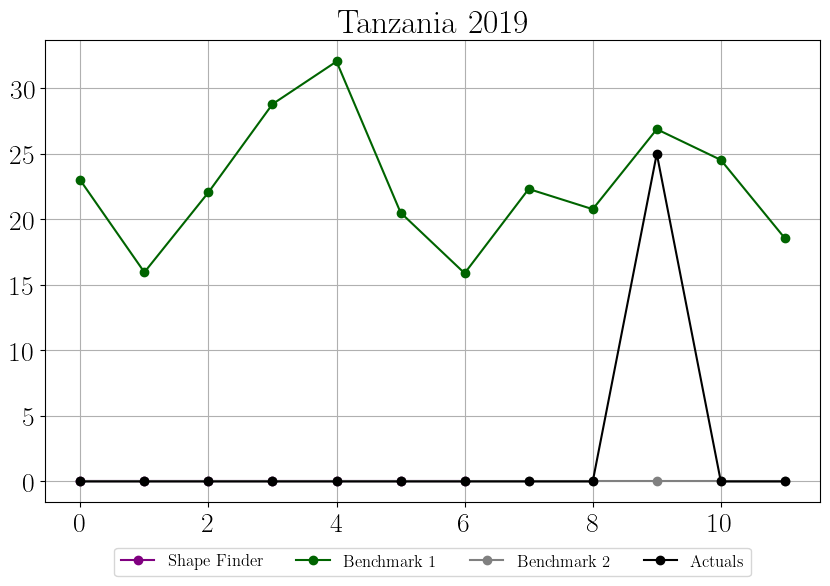

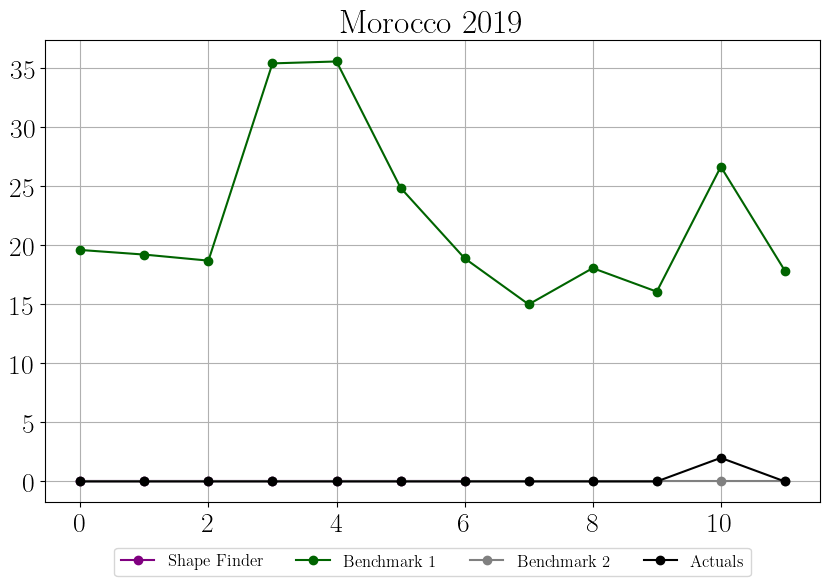

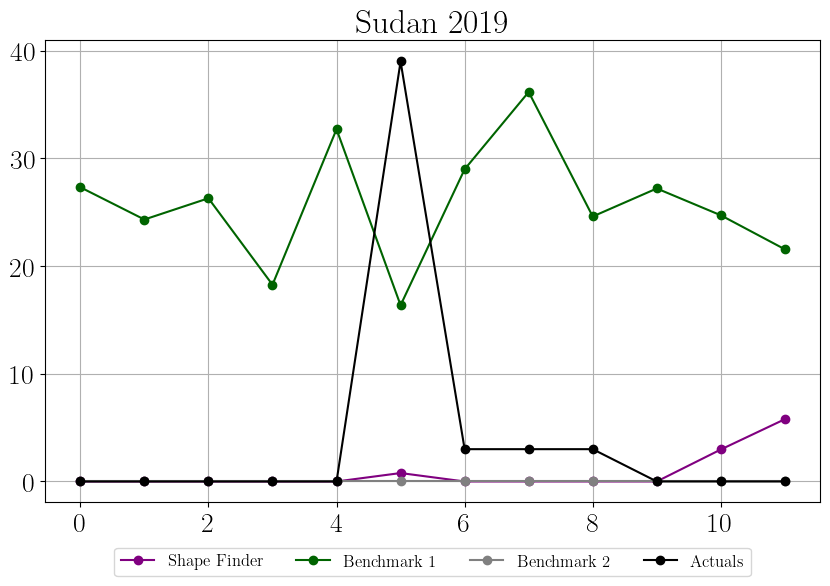

No patterns found to predict. Maybe increase the minimum distance.


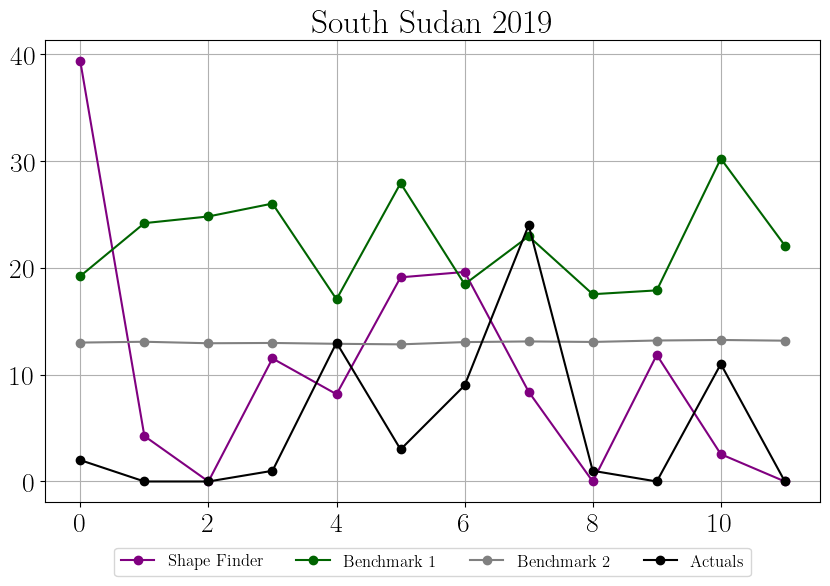

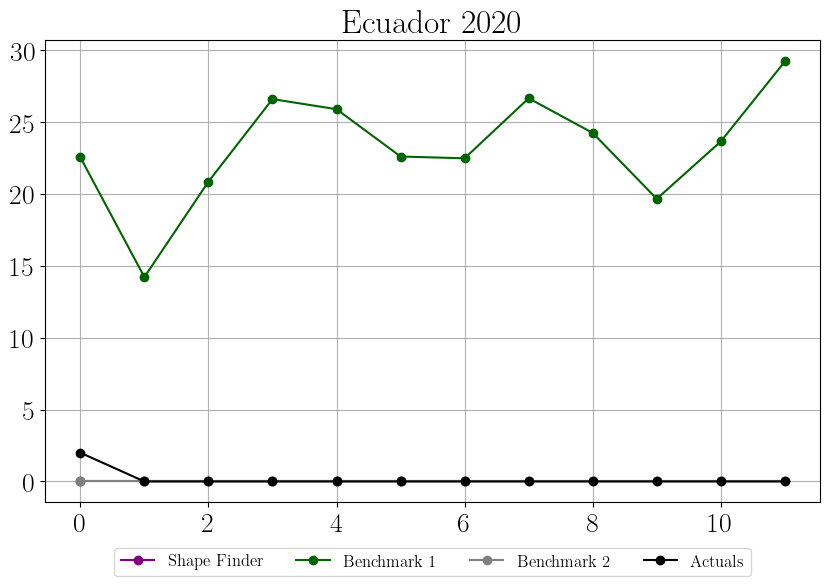

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


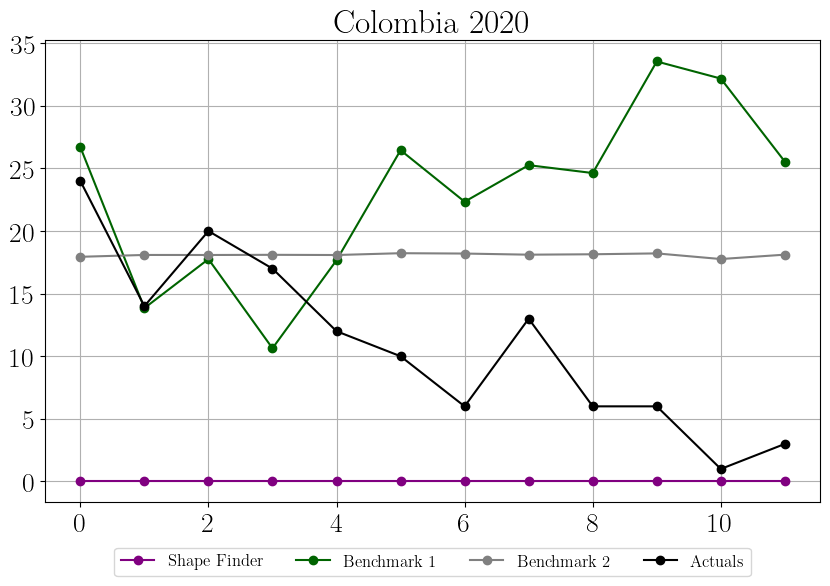

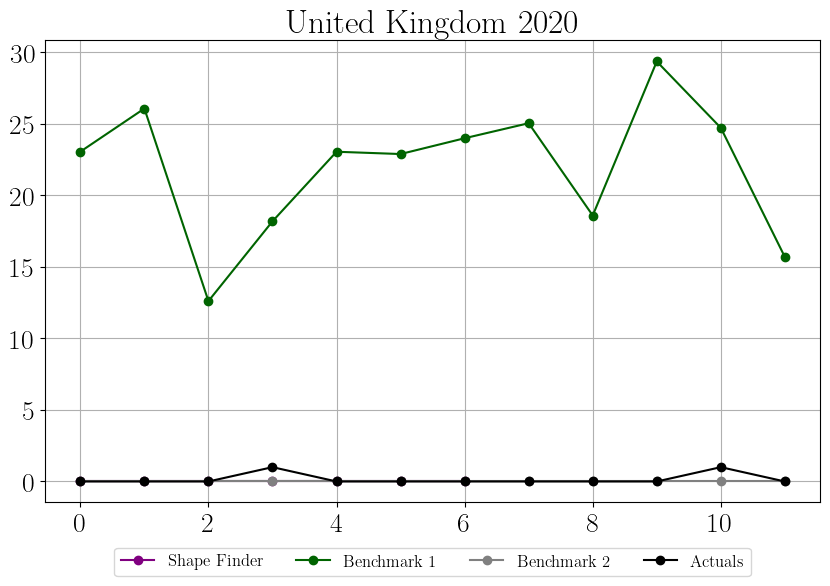

No patterns found to predict. Maybe increase the minimum distance.


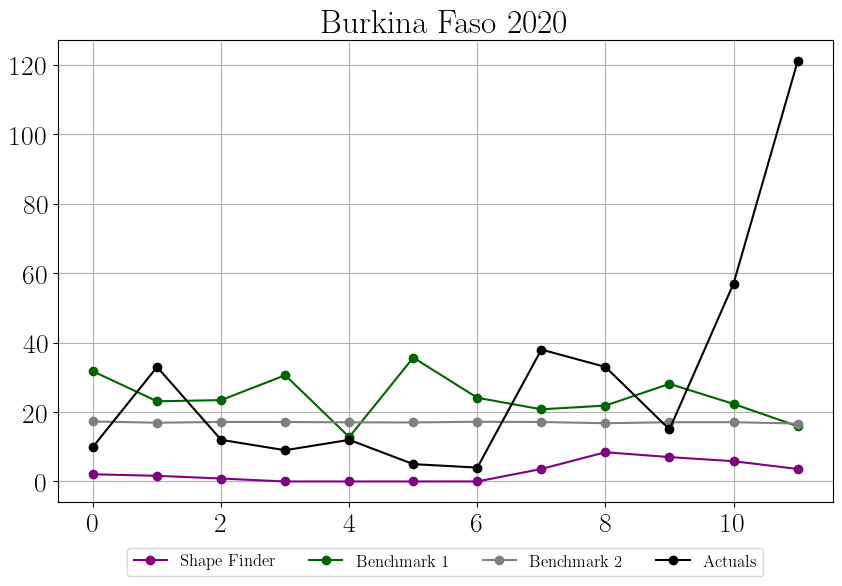

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


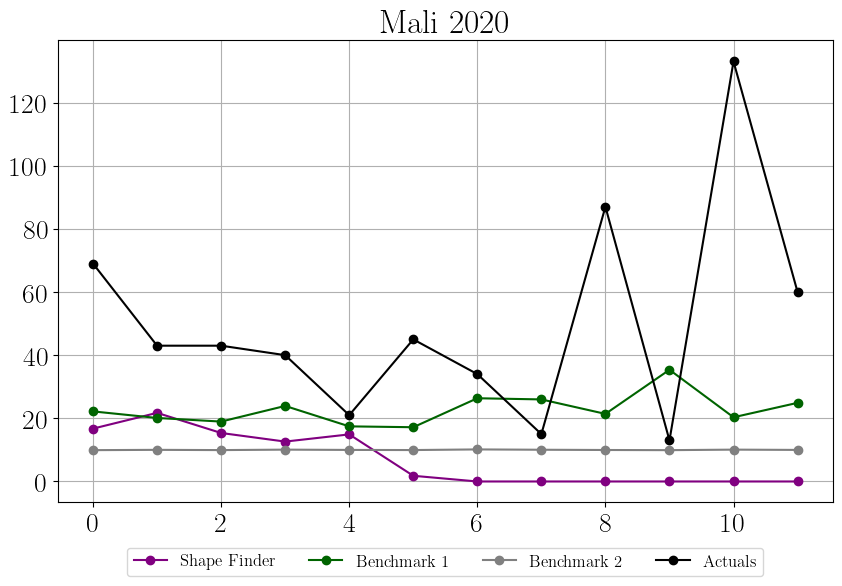

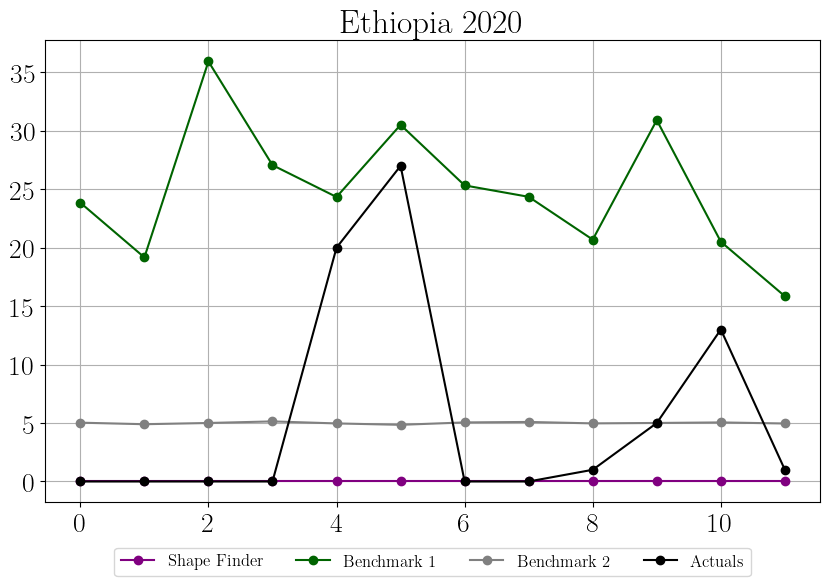

No patterns found to predict. Maybe increase the minimum distance.


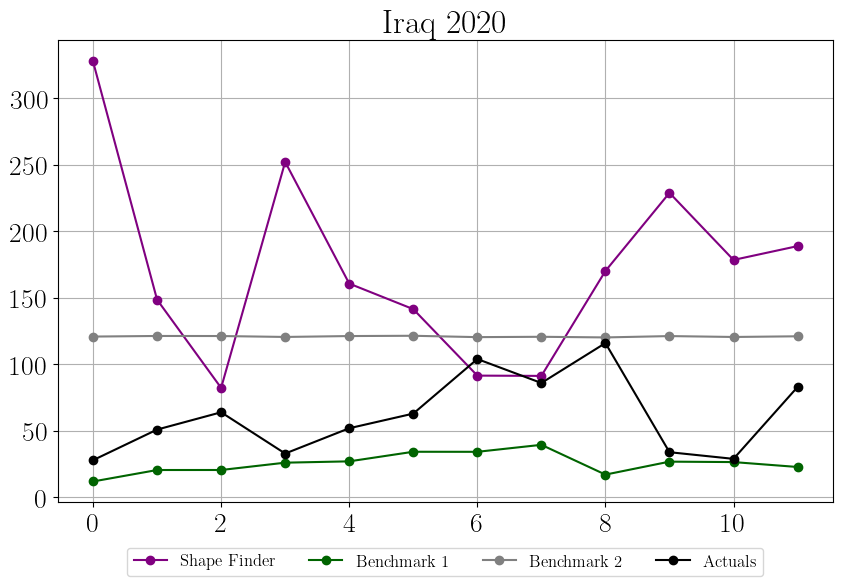

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


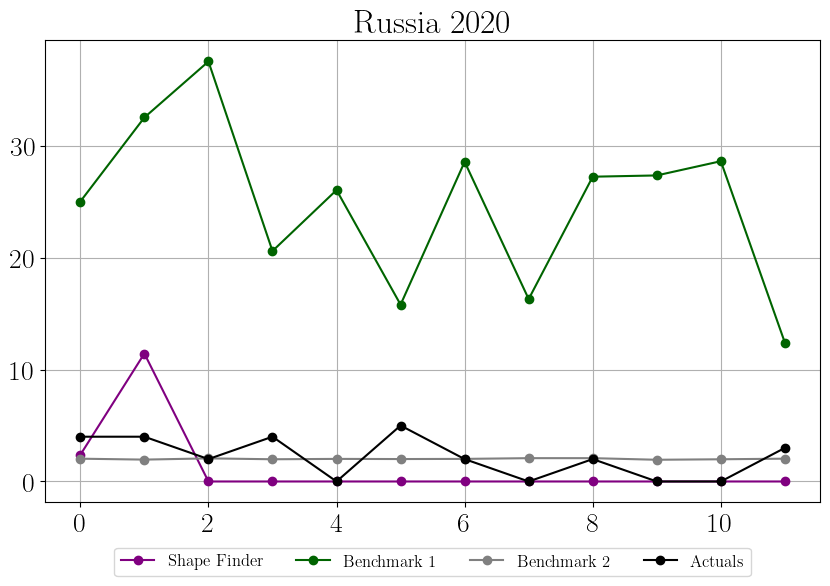

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


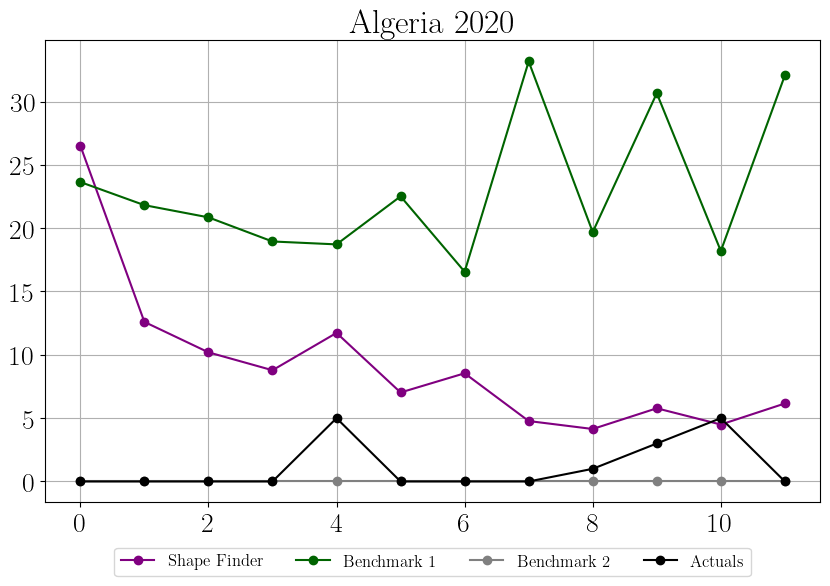

No patterns found to predict. Maybe increase the minimum distance.


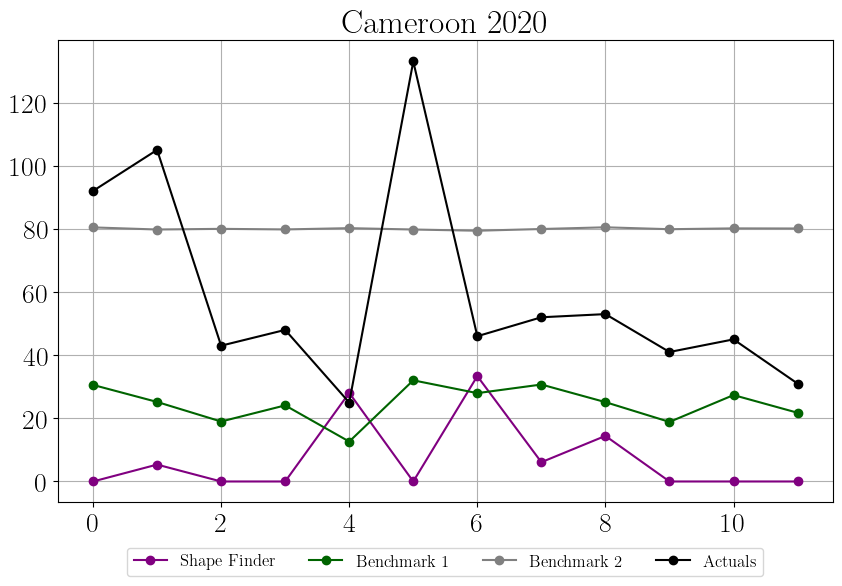

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


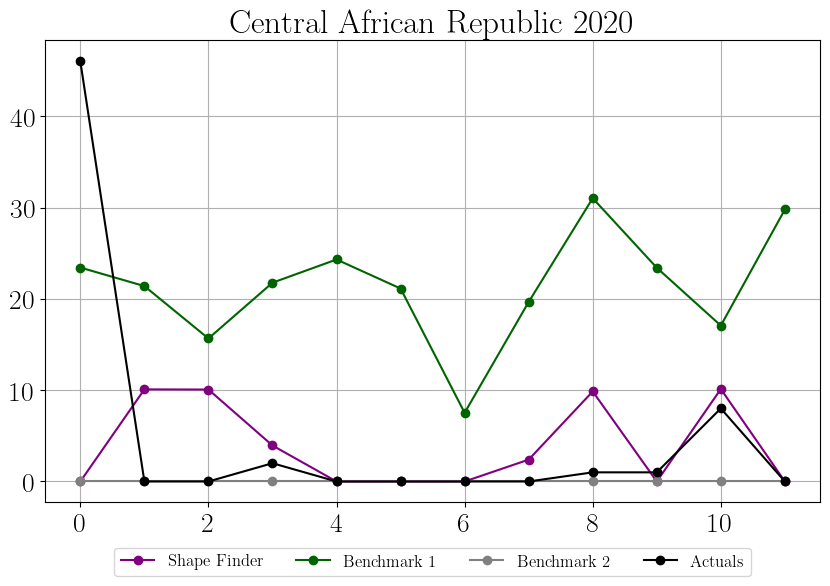

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


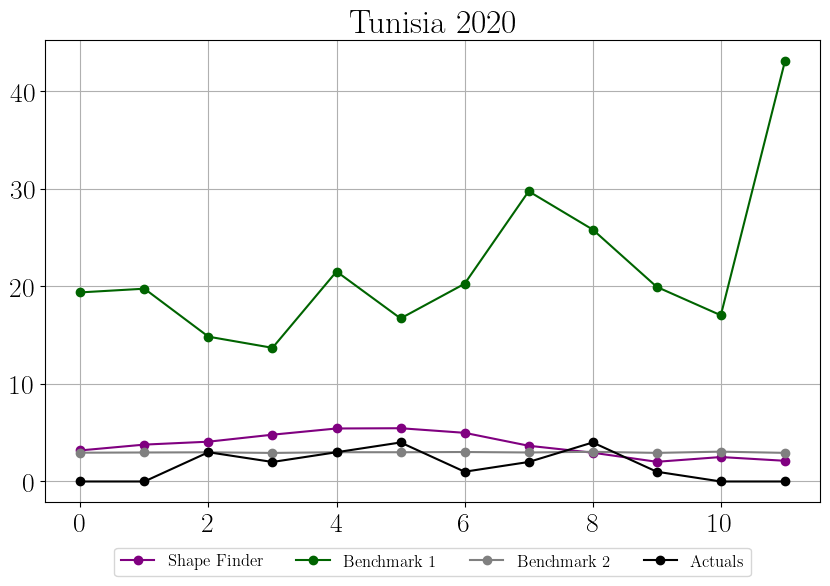

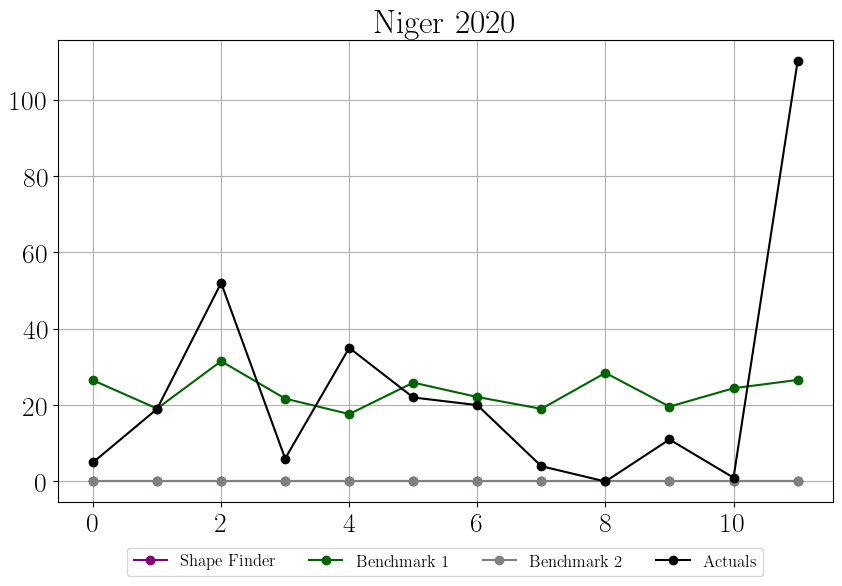

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


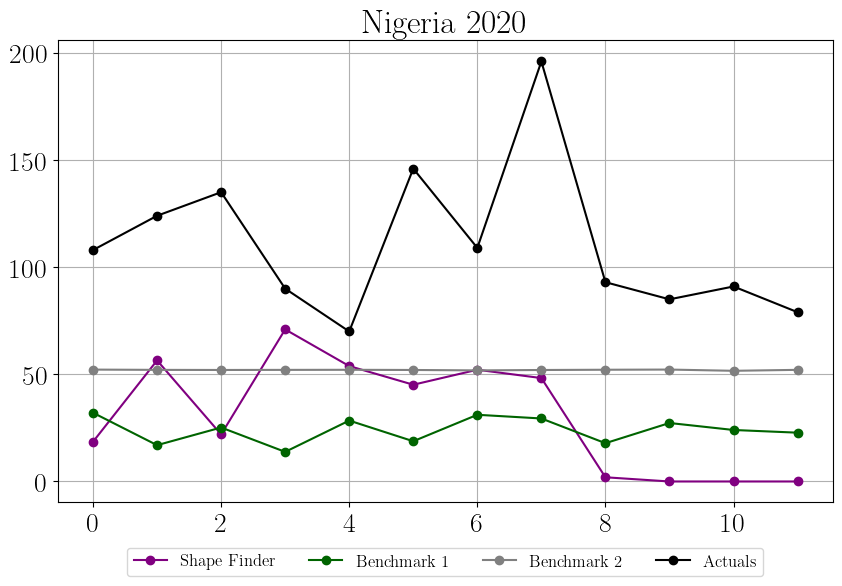

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


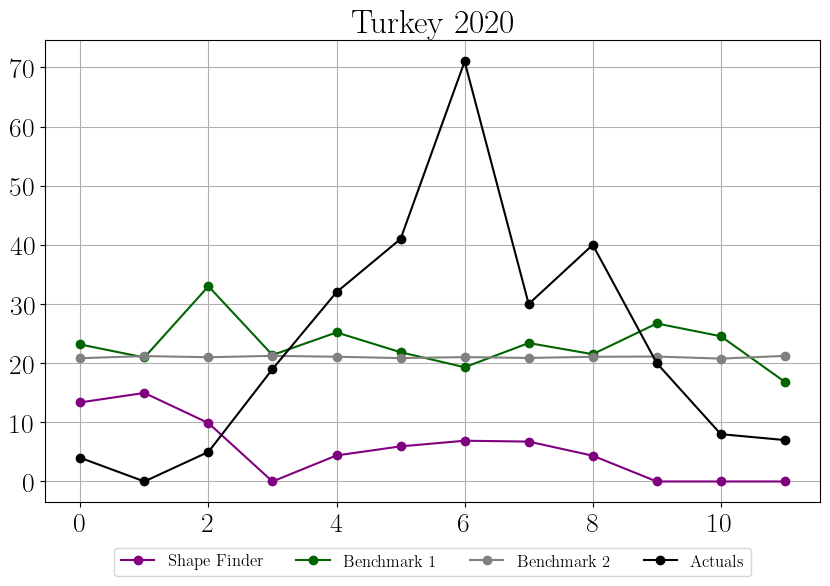

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


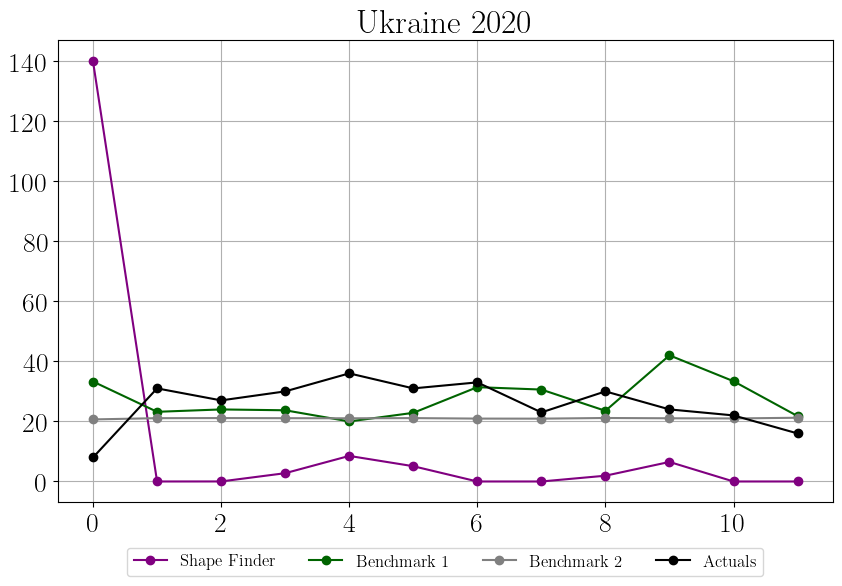

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


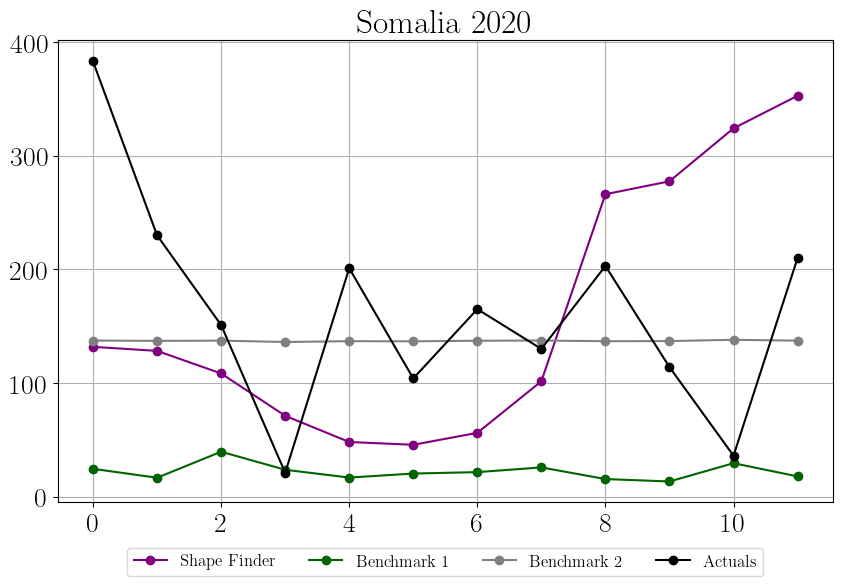

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


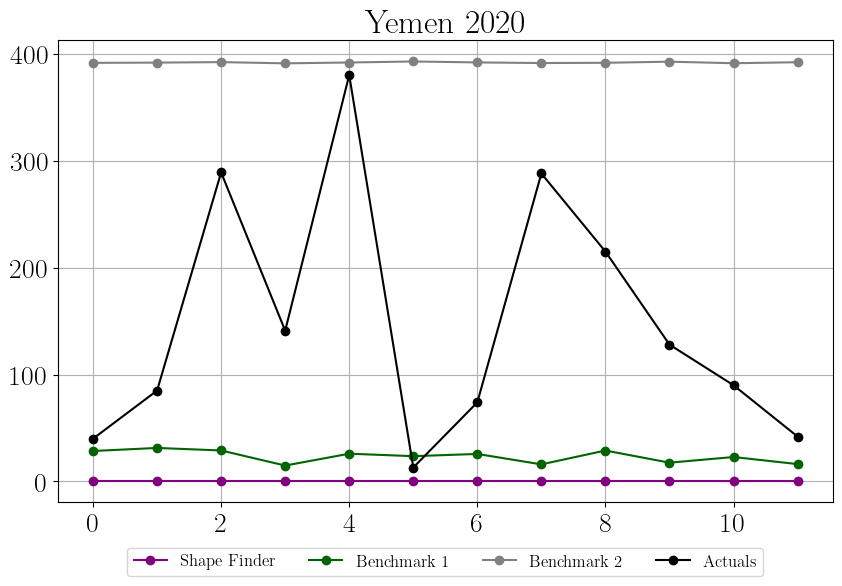

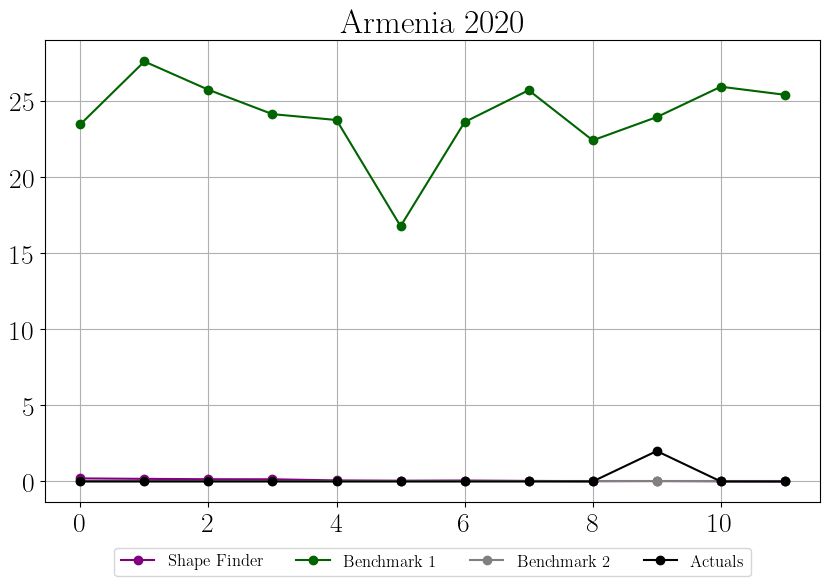

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


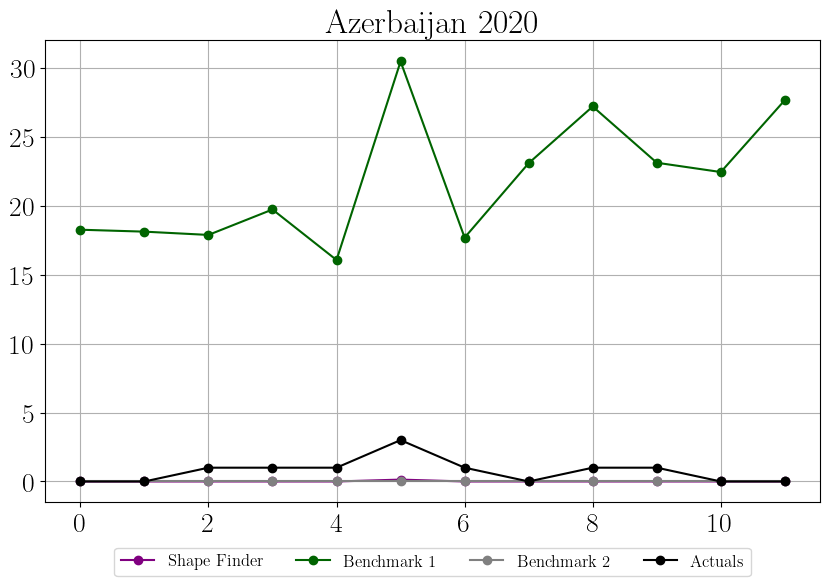

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


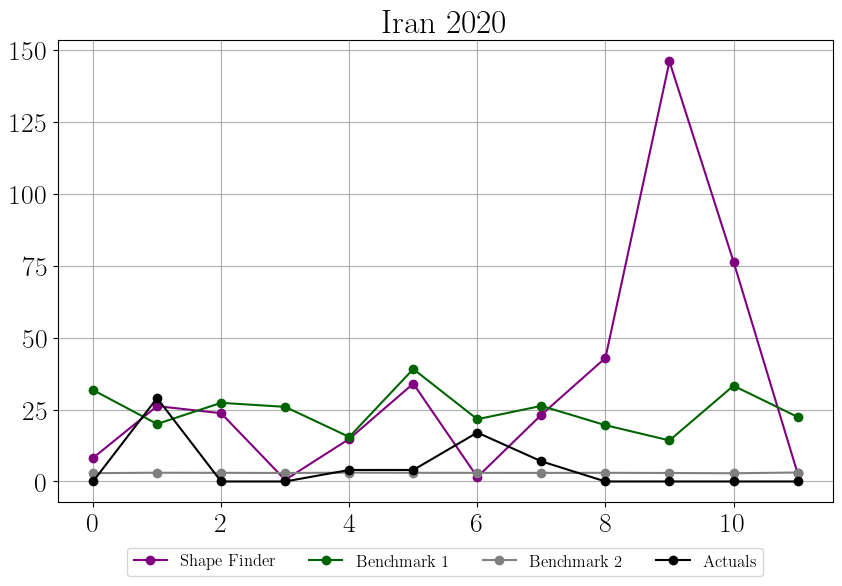

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


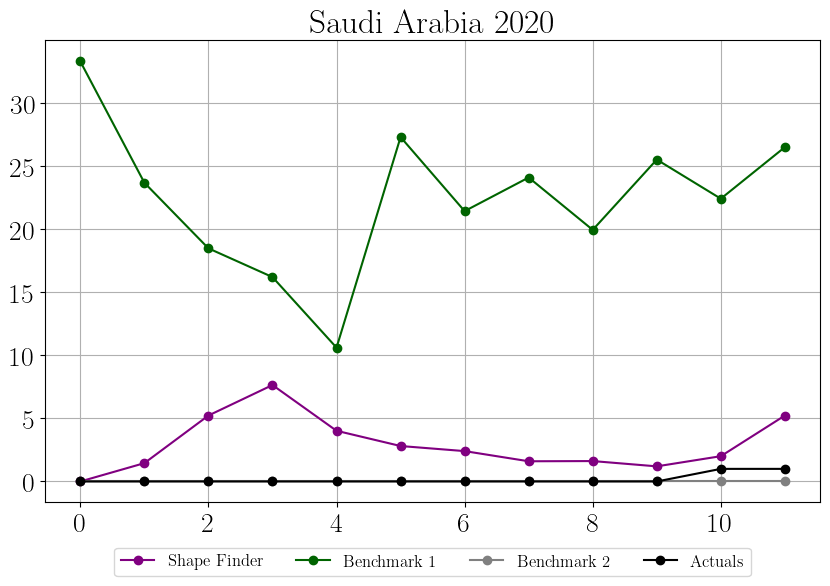

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


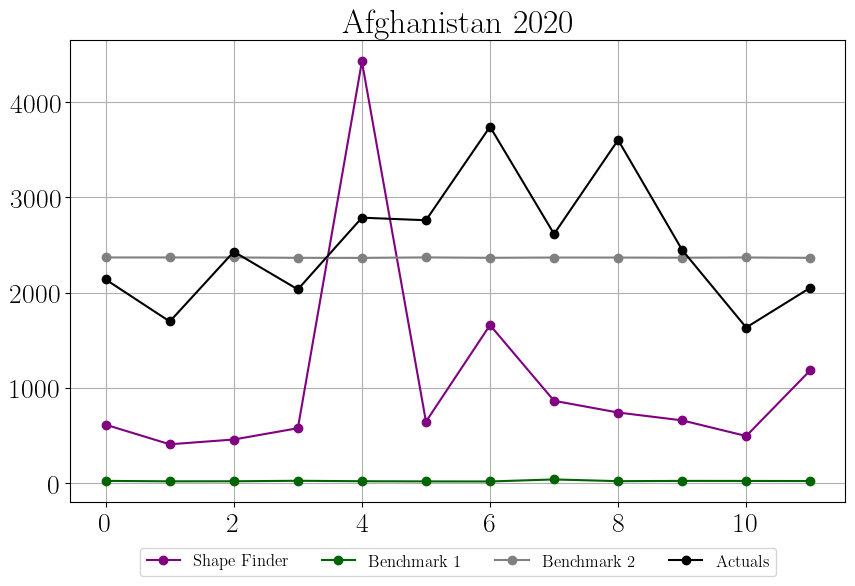

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


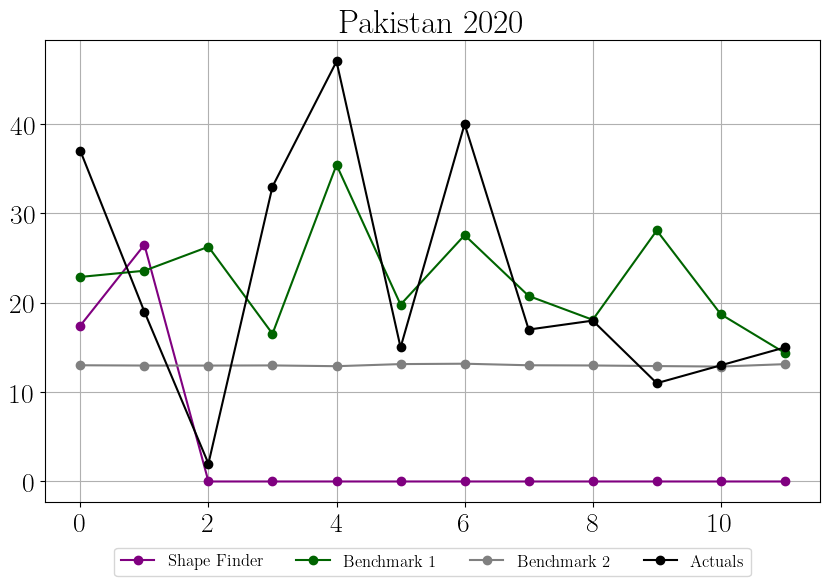

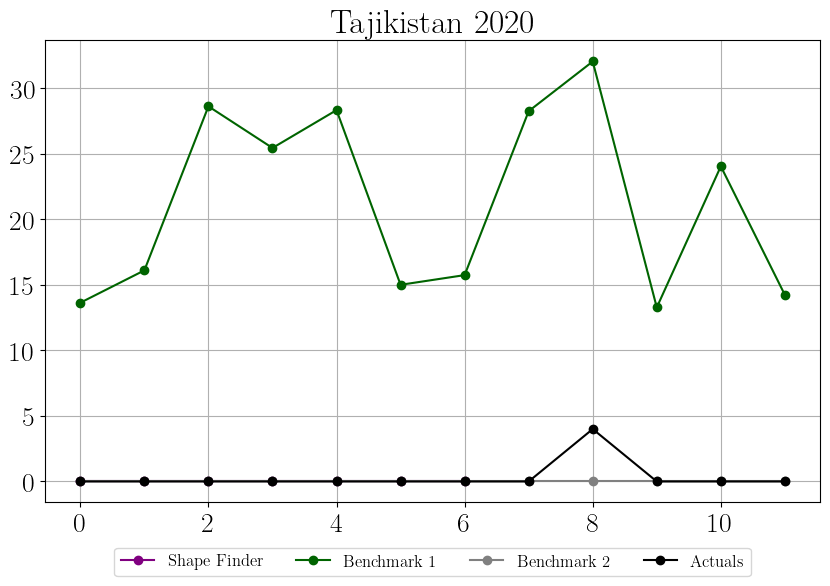

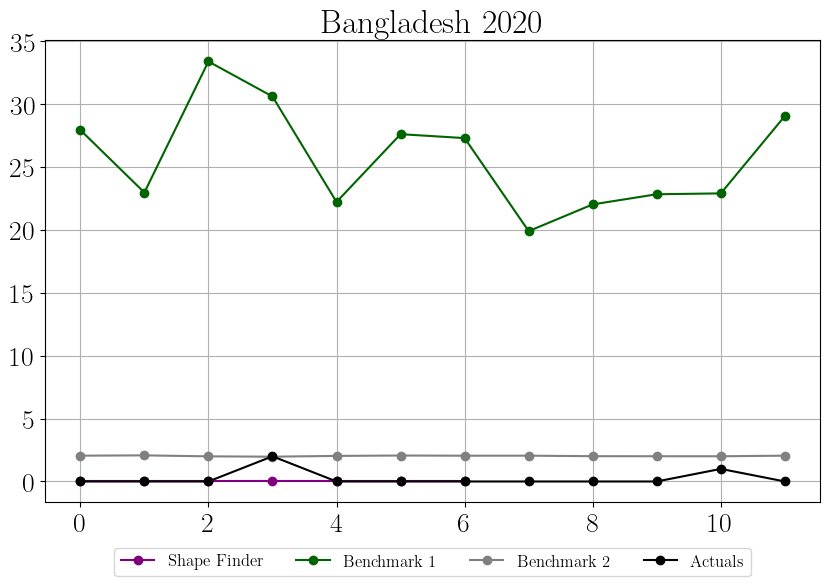

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


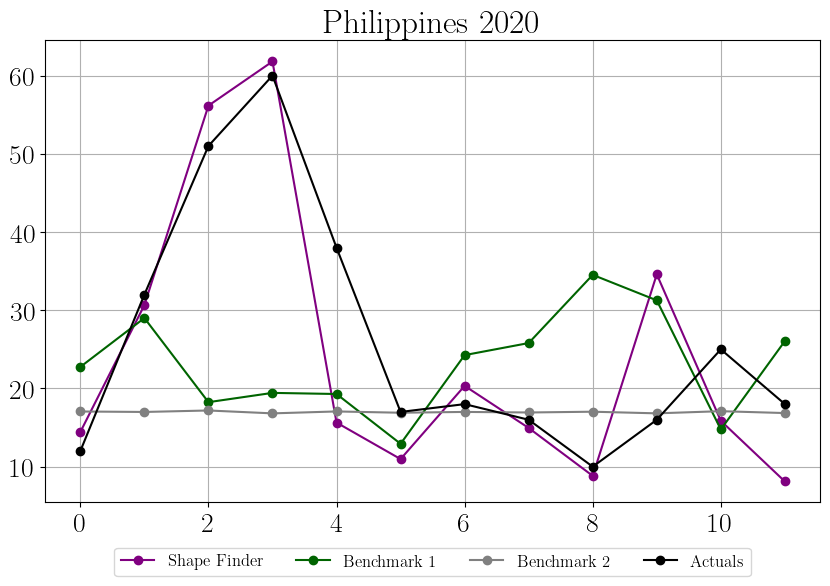

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


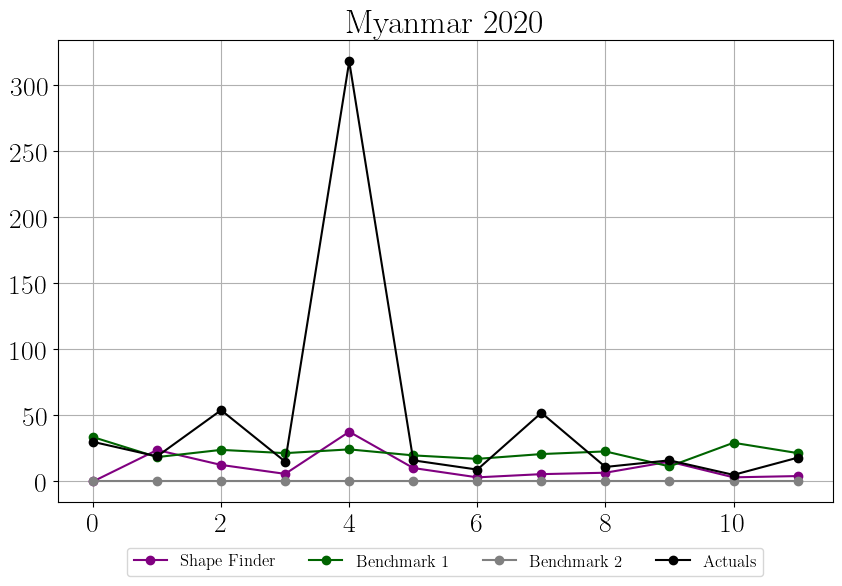

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


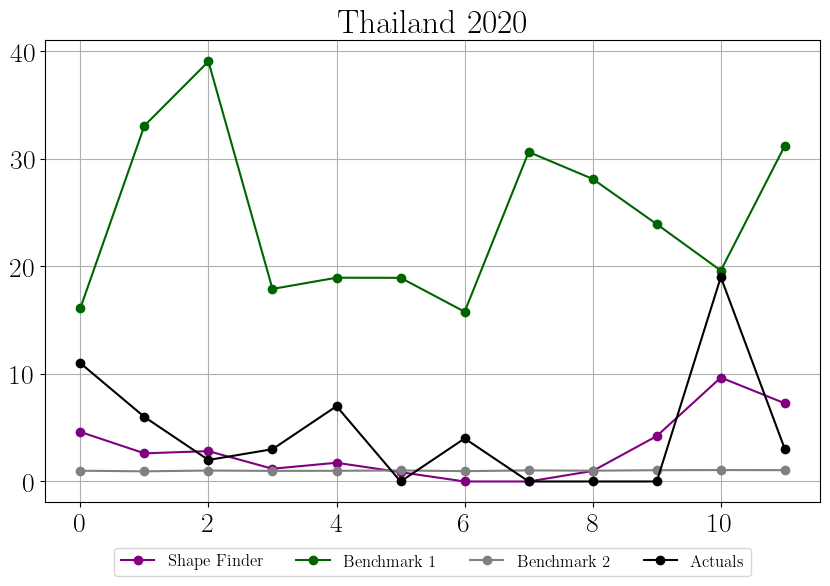

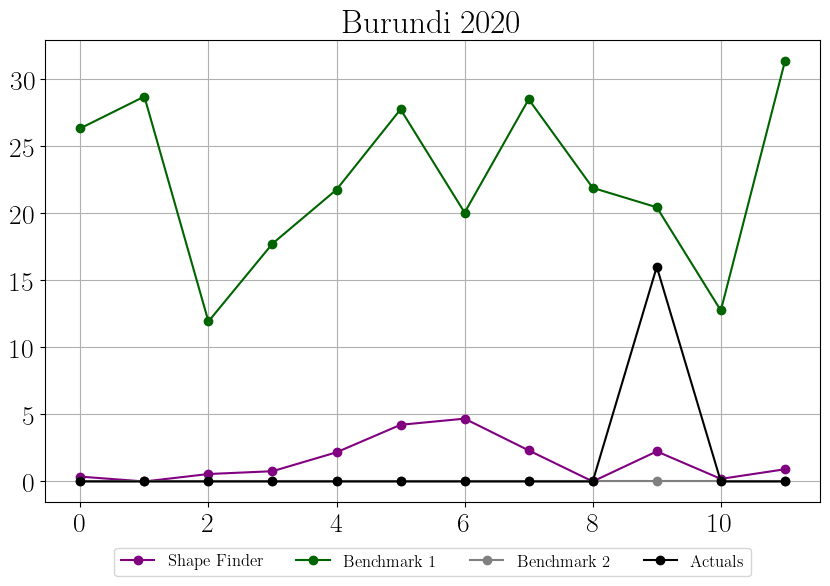

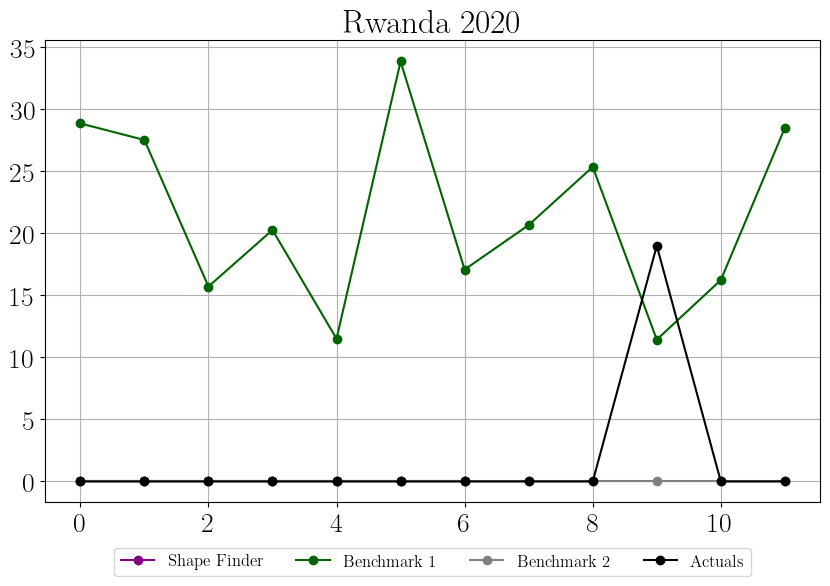

No patterns found to predict. Maybe increase the minimum distance.


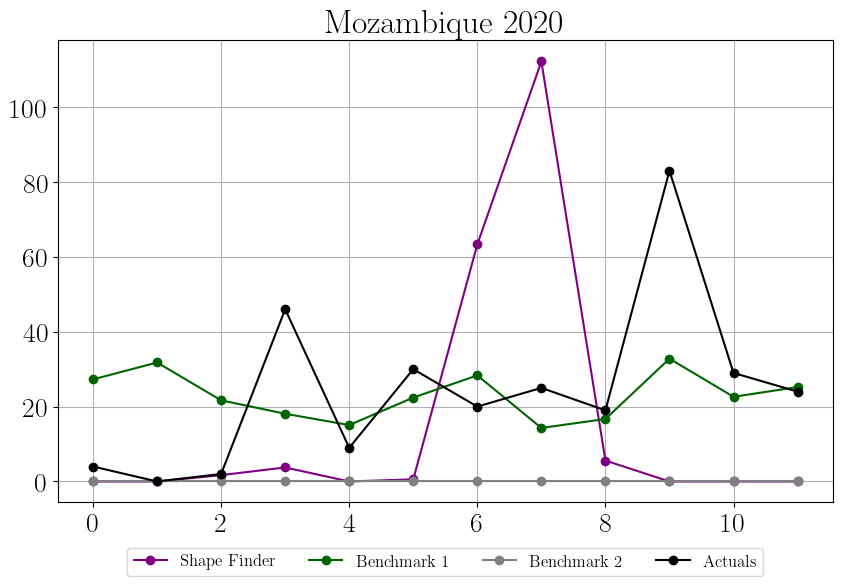

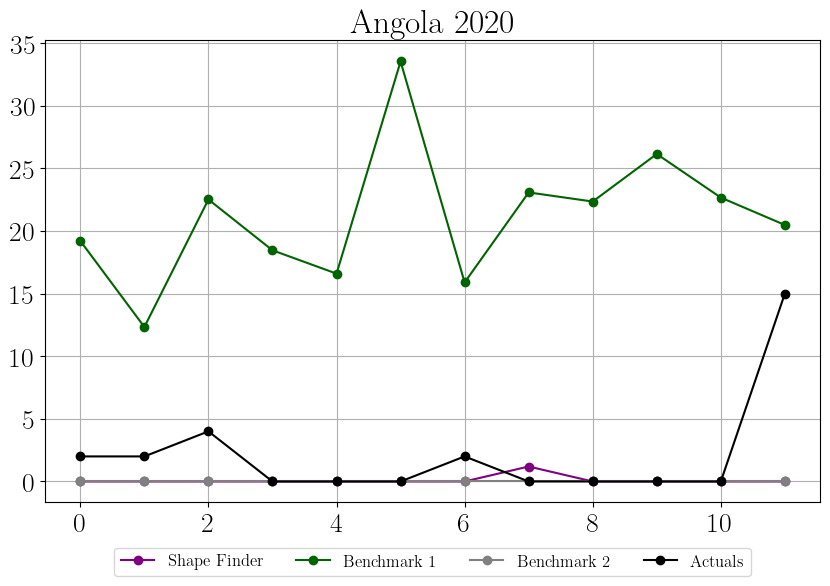

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


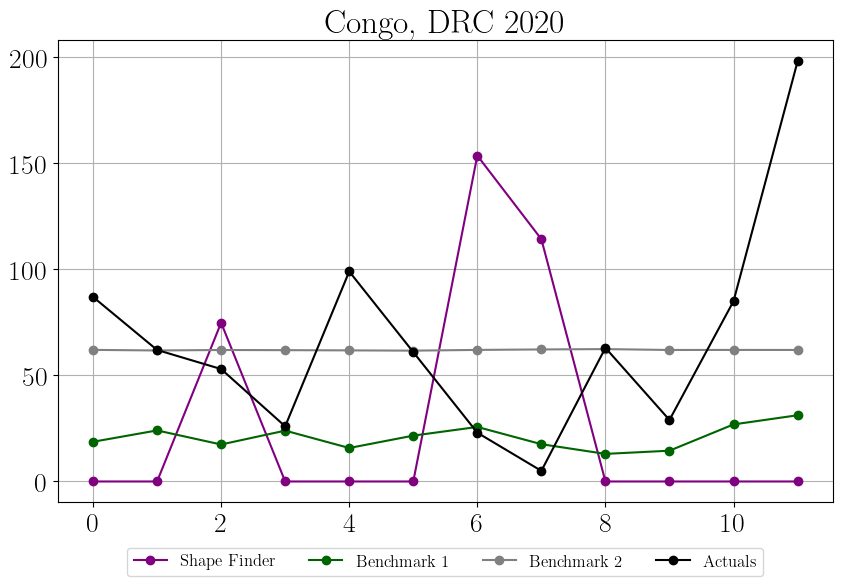

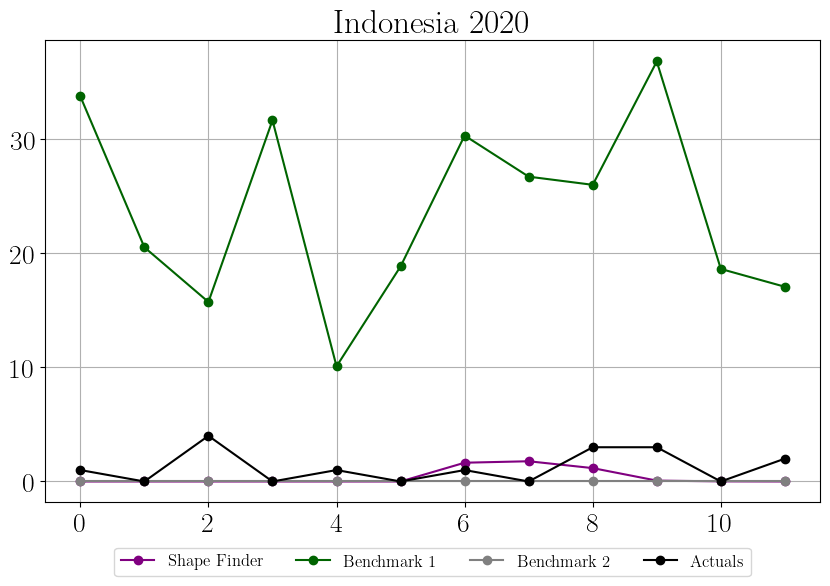

No patterns found to predict. Maybe increase the minimum distance.


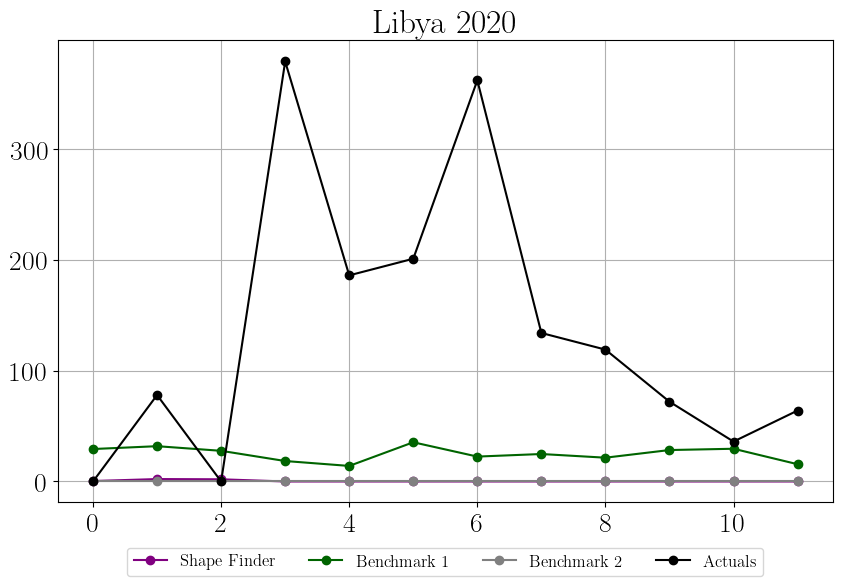

No patterns found to predict. Maybe increase the minimum distance.


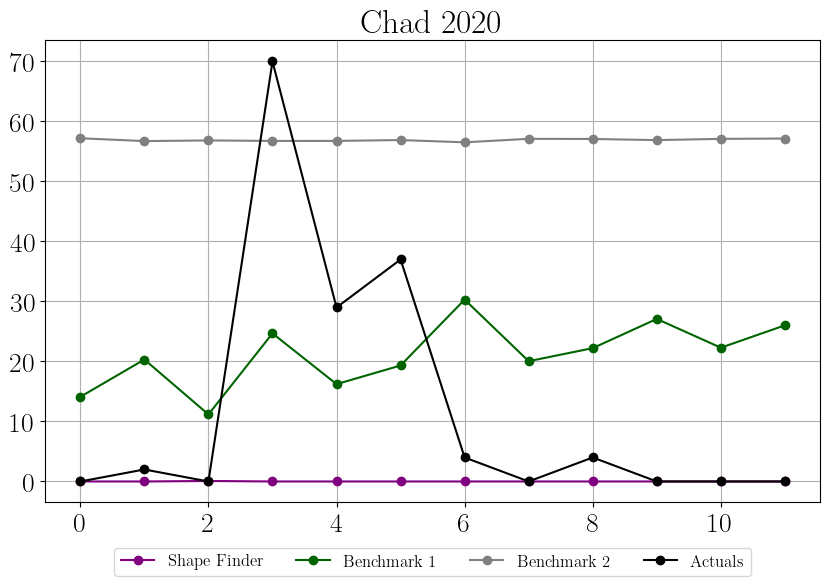

No patterns found to predict. Maybe increase the minimum distance.


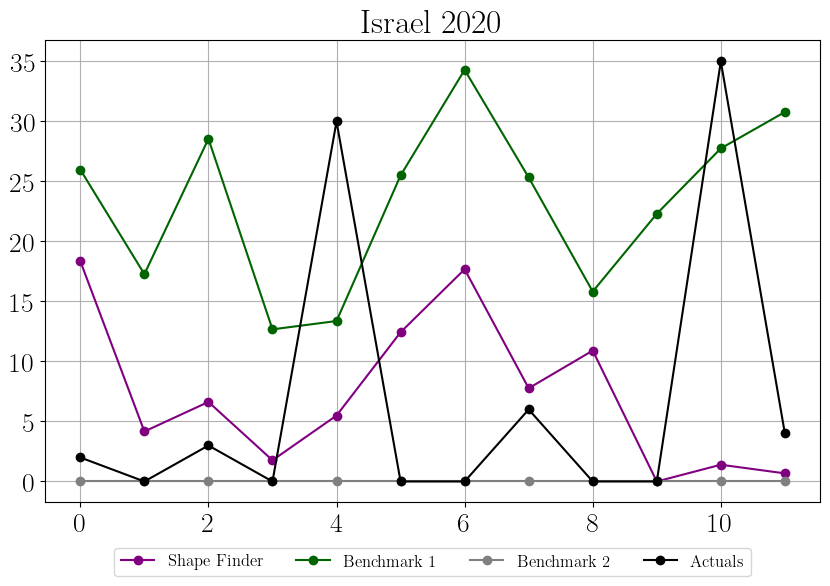

No patterns found to predict. Maybe increase the minimum distance.


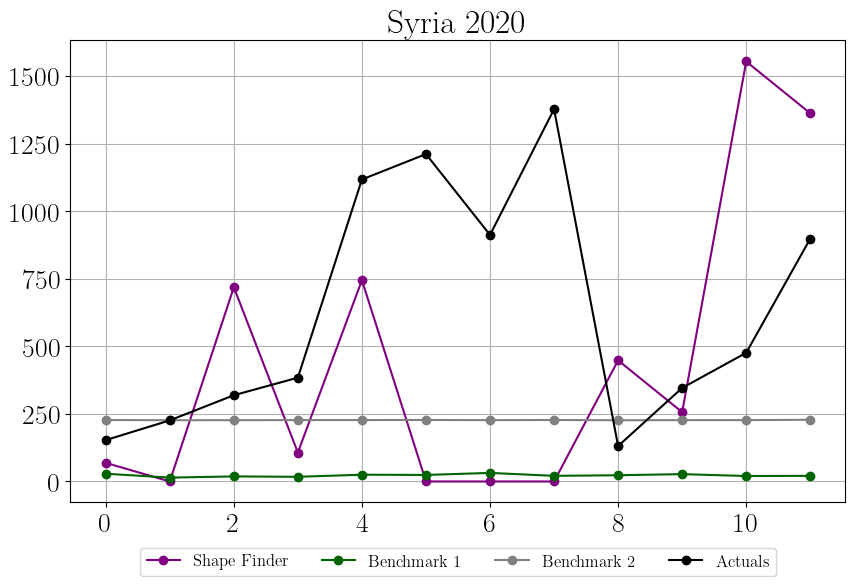

No patterns found to predict. Maybe increase the minimum distance.


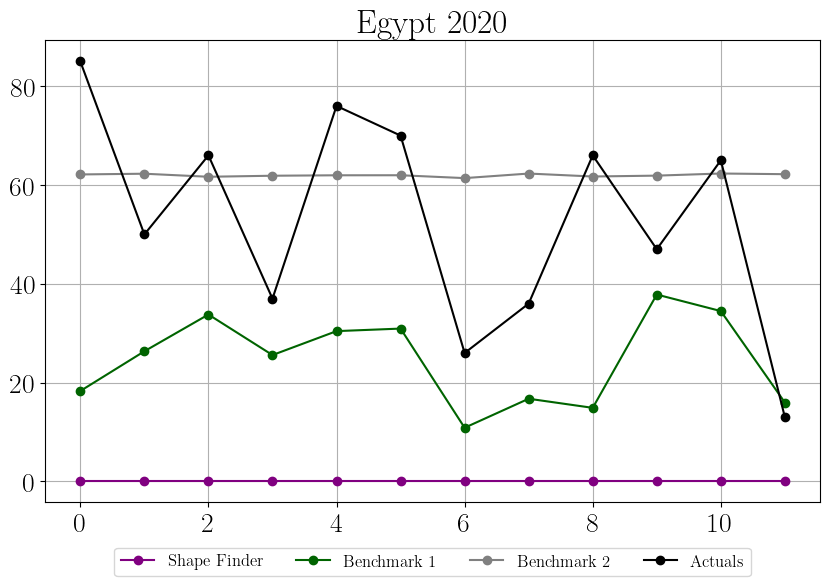

No patterns found to predict. Maybe increase the minimum distance.


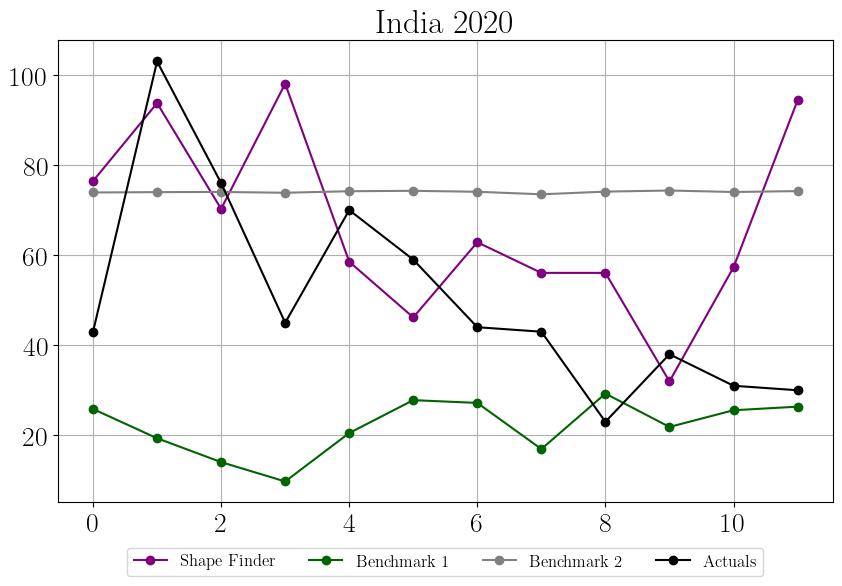

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


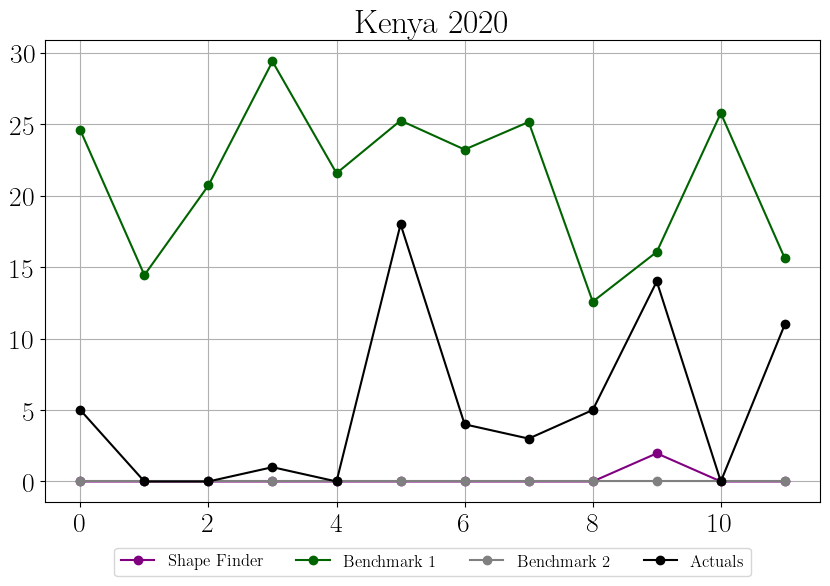

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


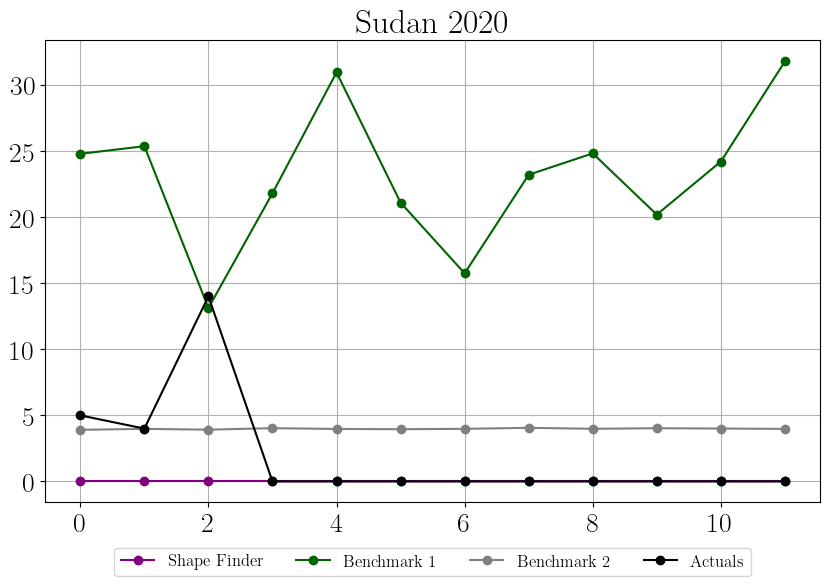

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


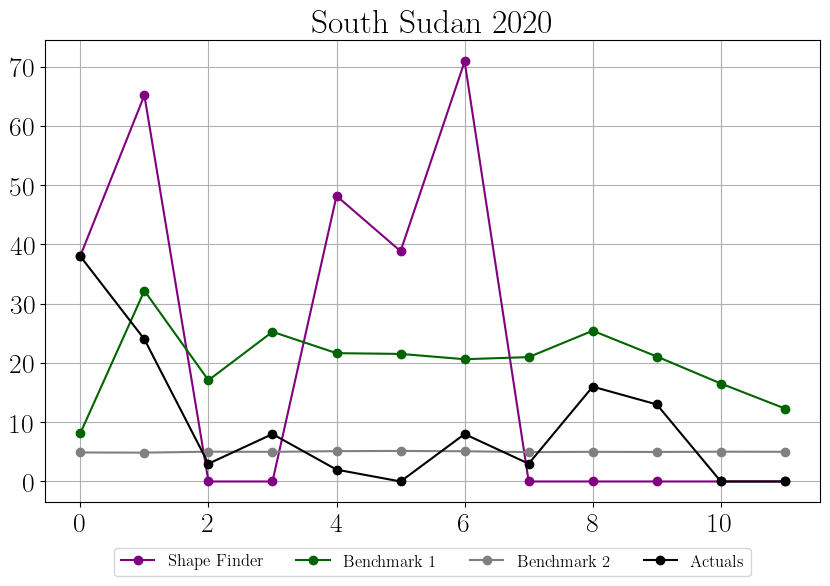

No patterns found to predict. Maybe increase the minimum distance.


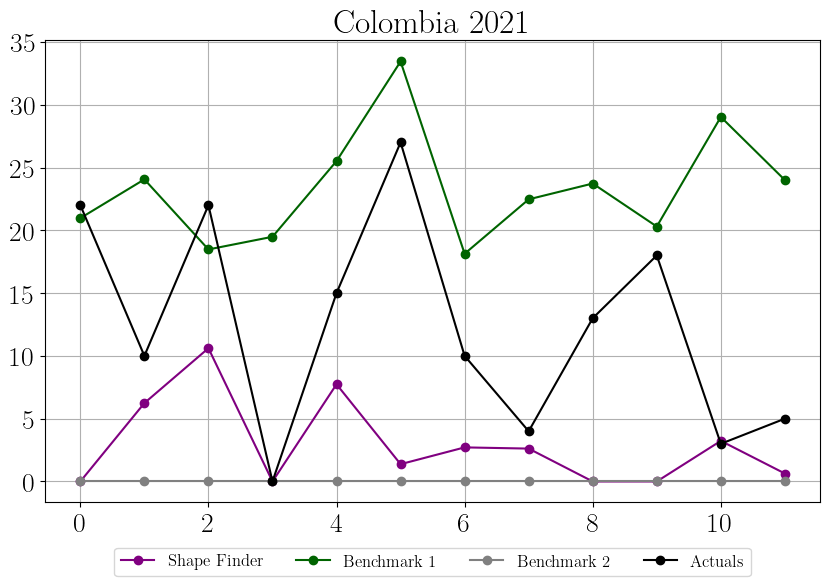

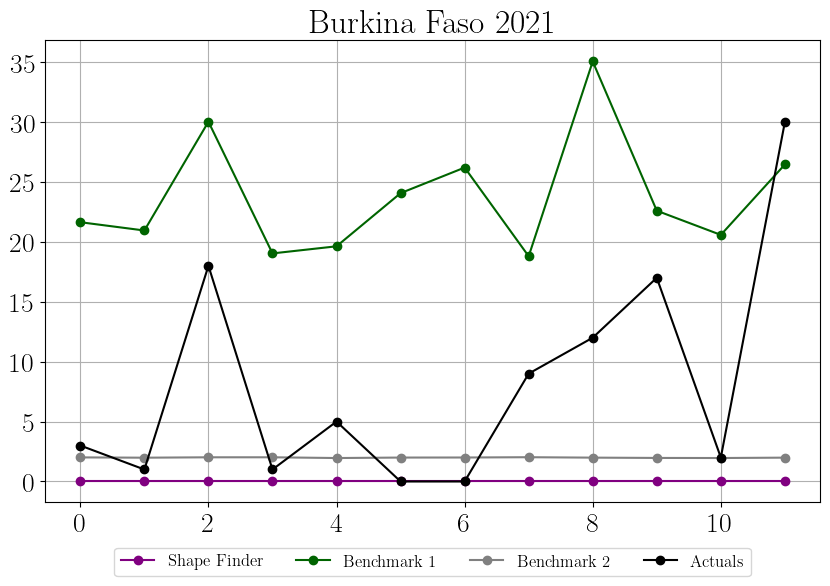

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


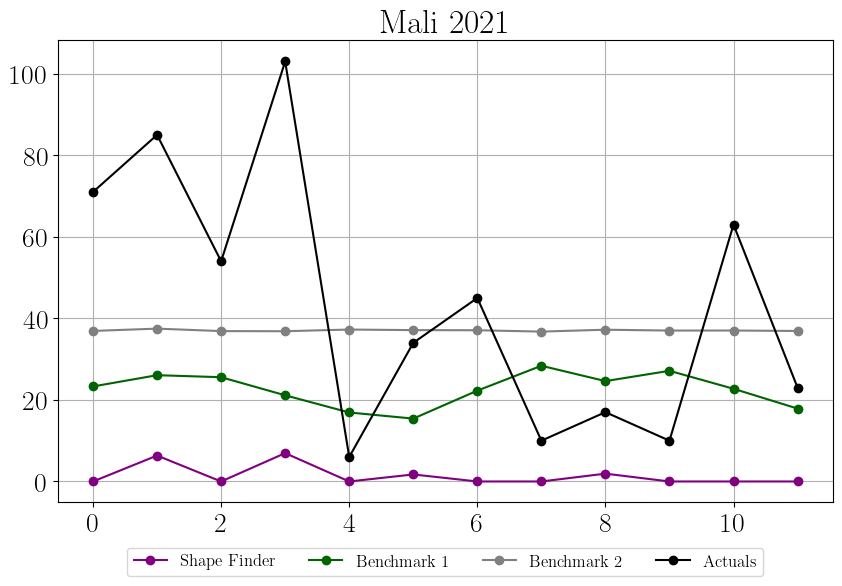

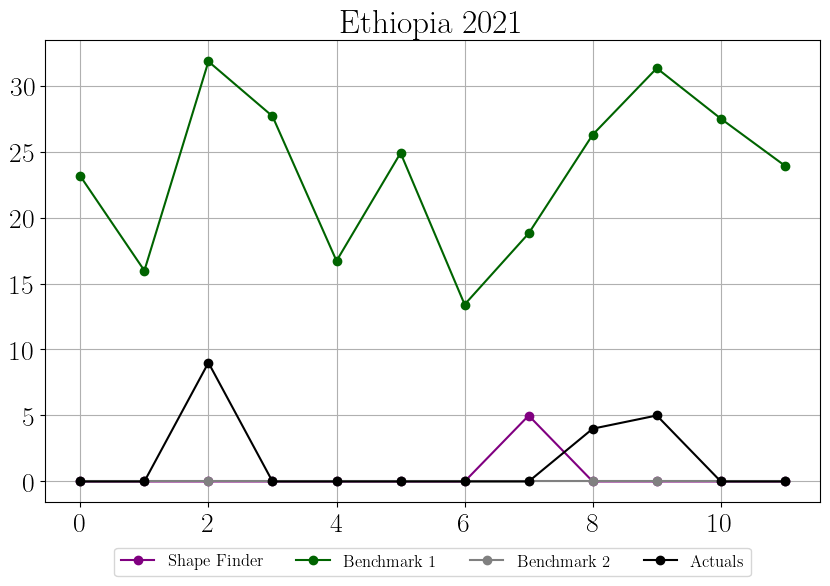

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


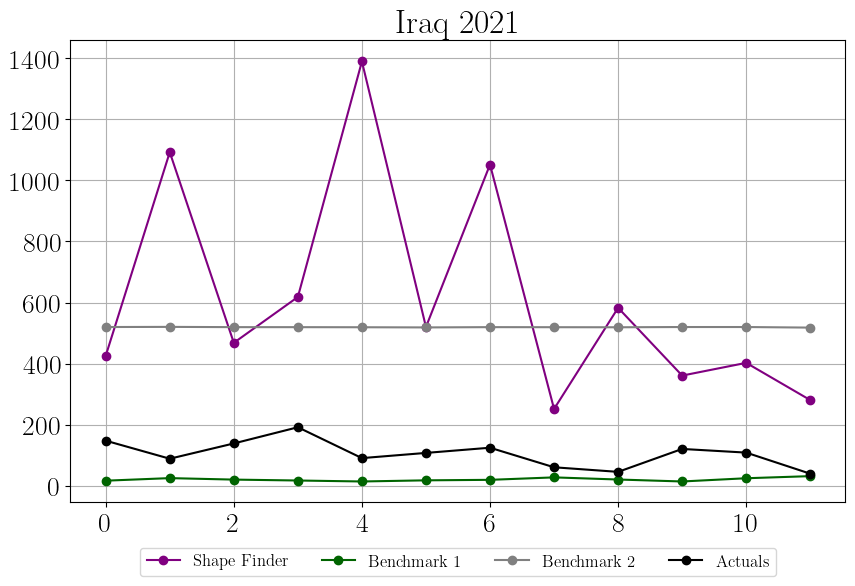

No patterns found to predict. Maybe increase the minimum distance.


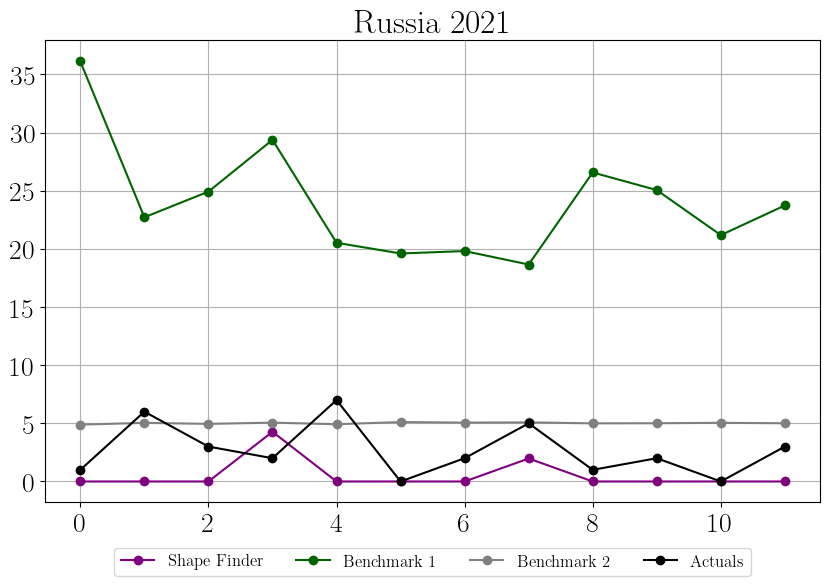

No patterns found to predict. Maybe increase the minimum distance.


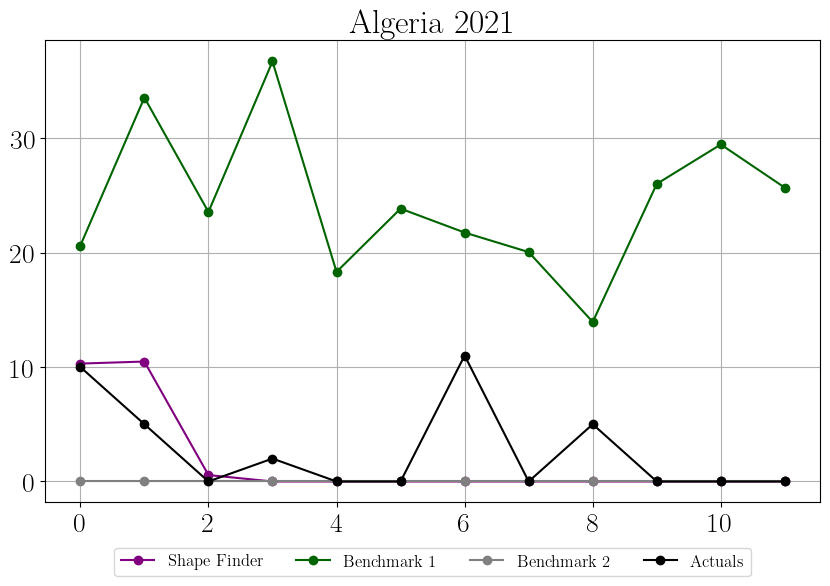

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


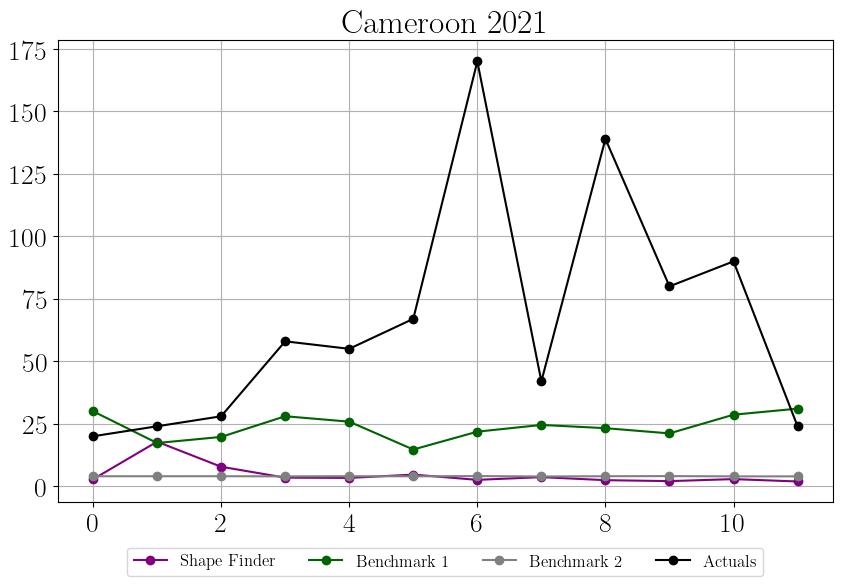

No patterns found to predict. Maybe increase the minimum distance.


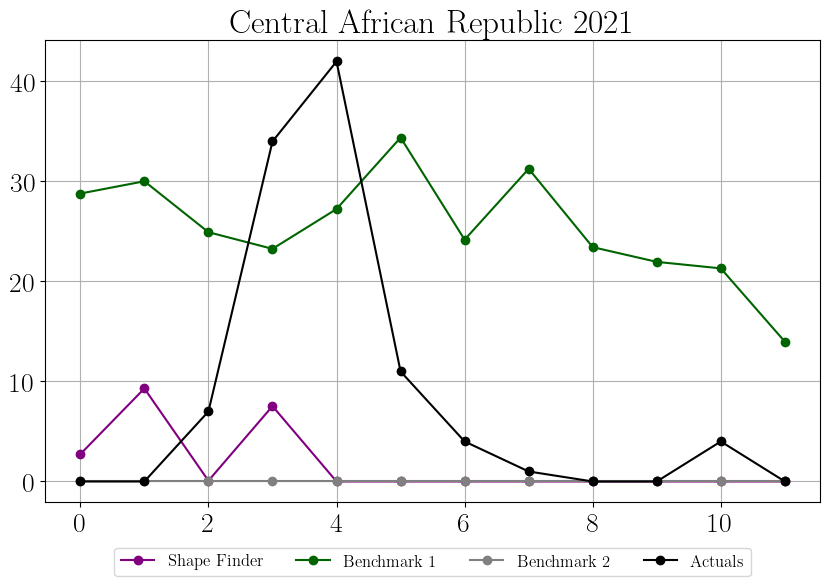

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


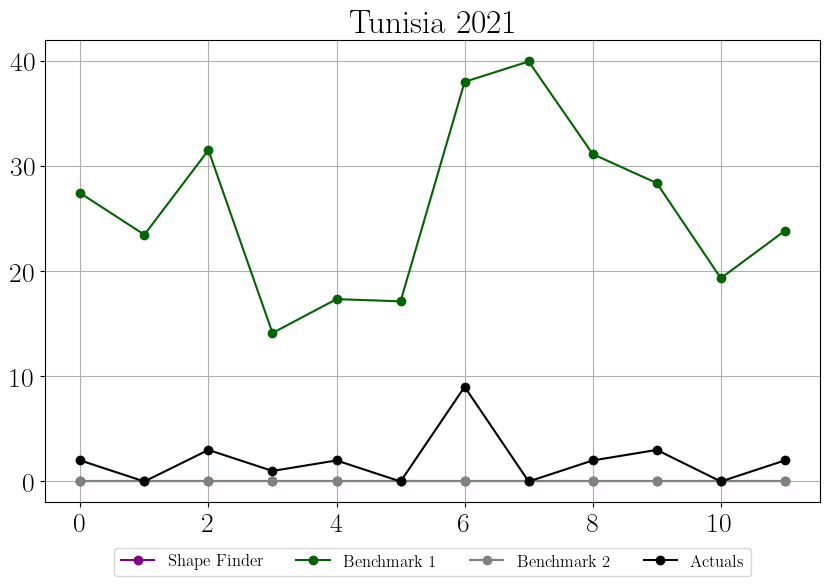

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


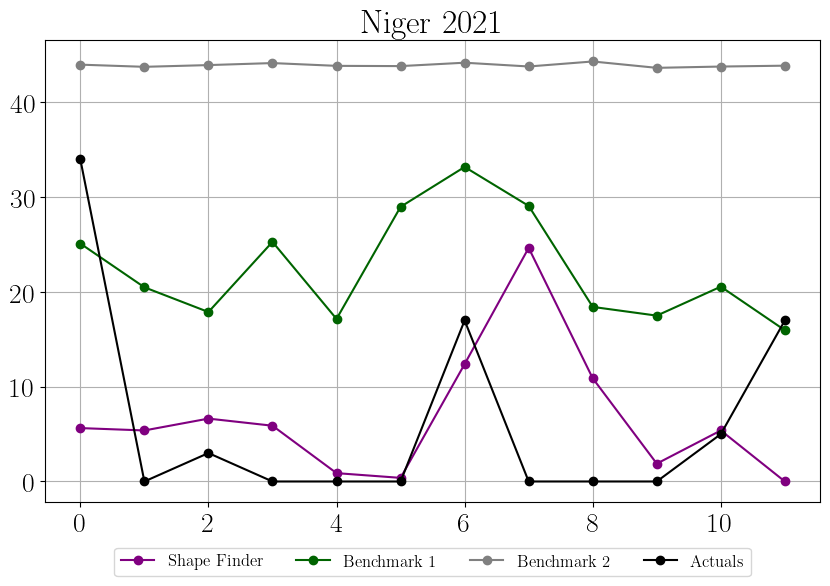

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


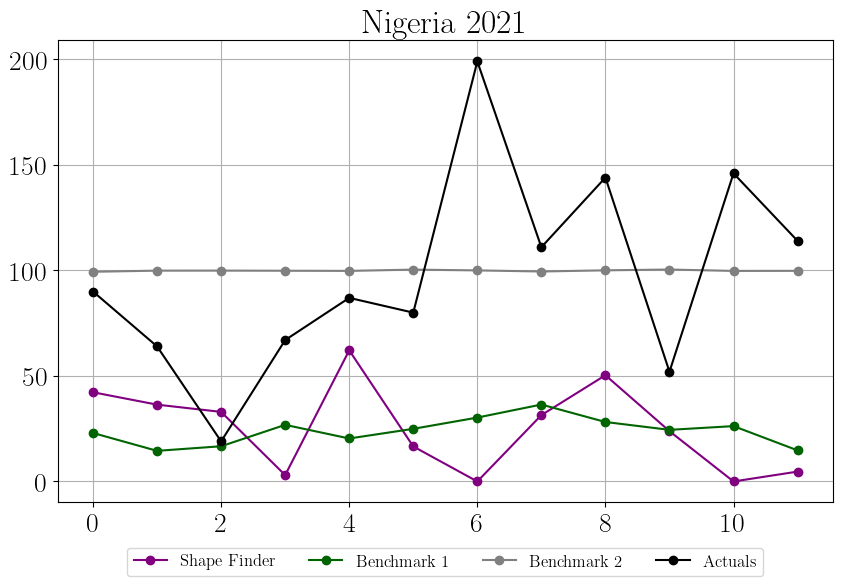

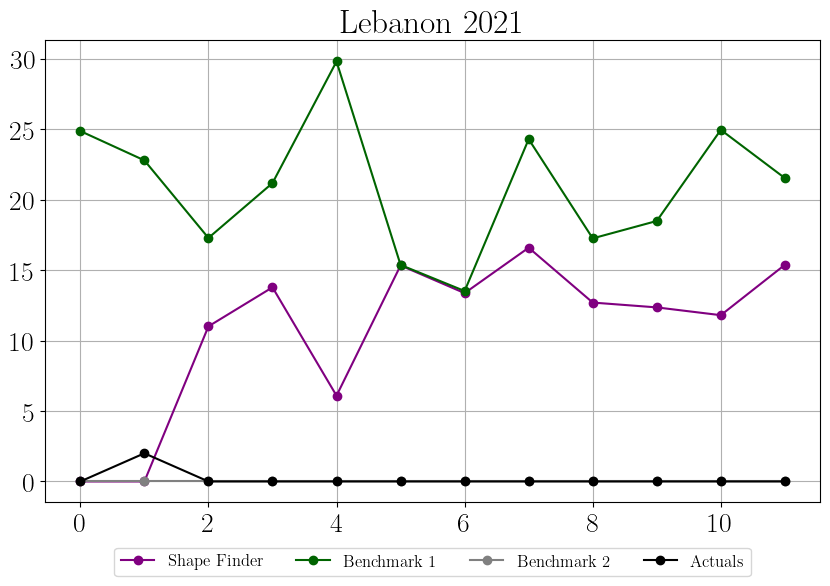

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


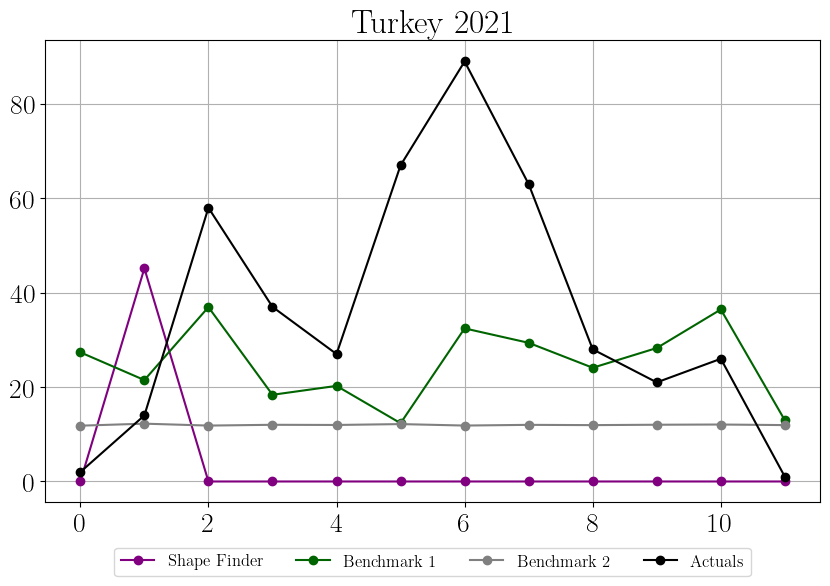

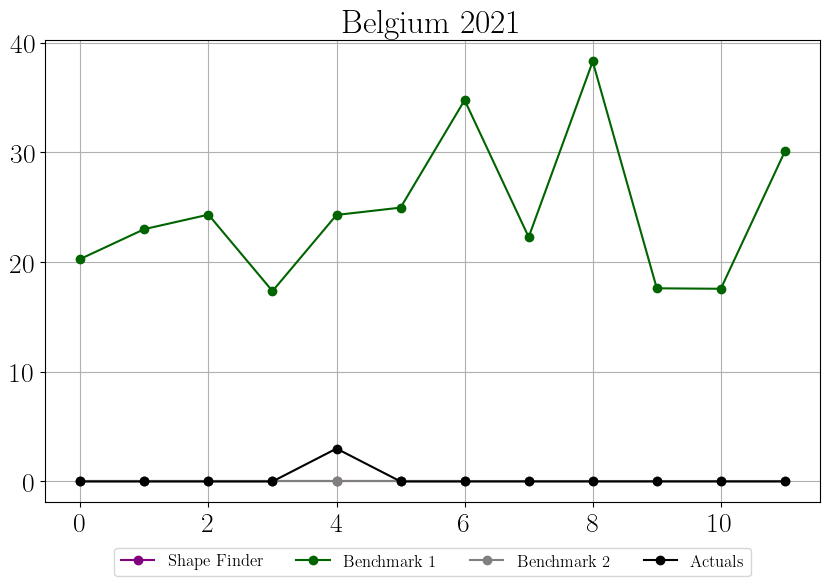

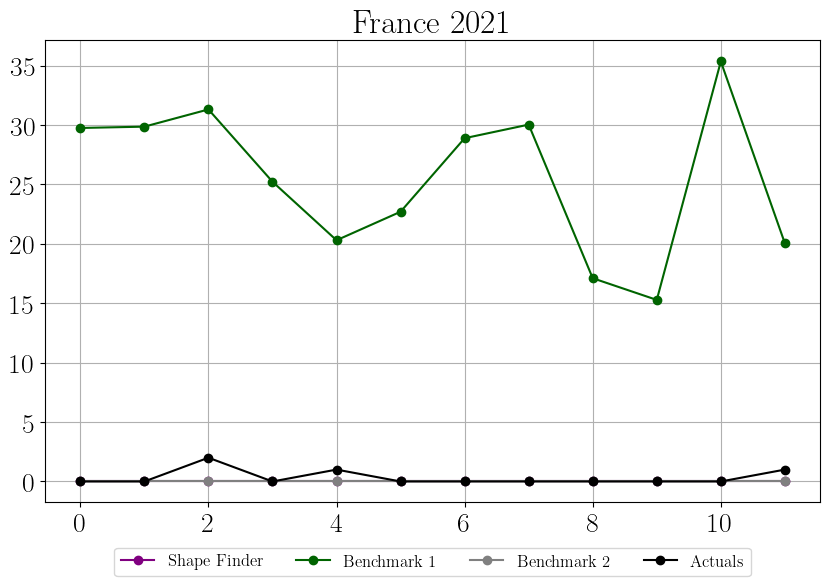

No patterns found to predict. Maybe increase the minimum distance.


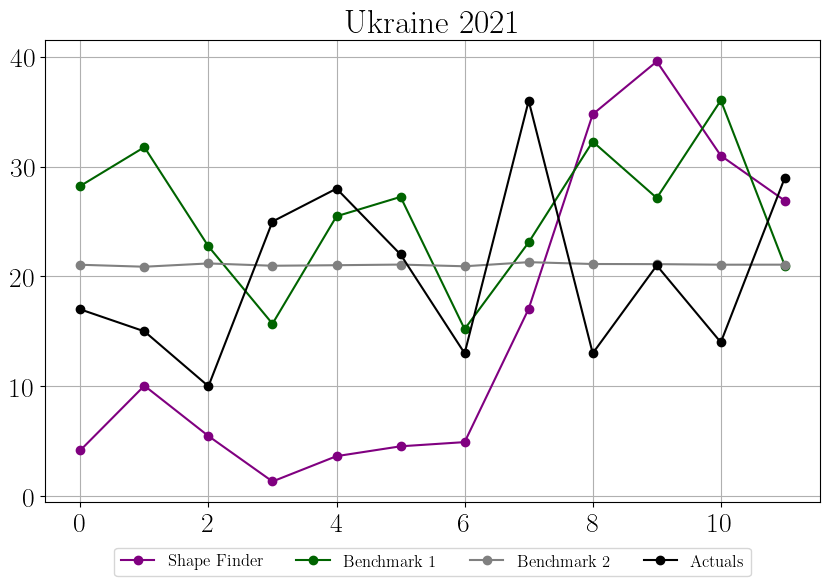

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


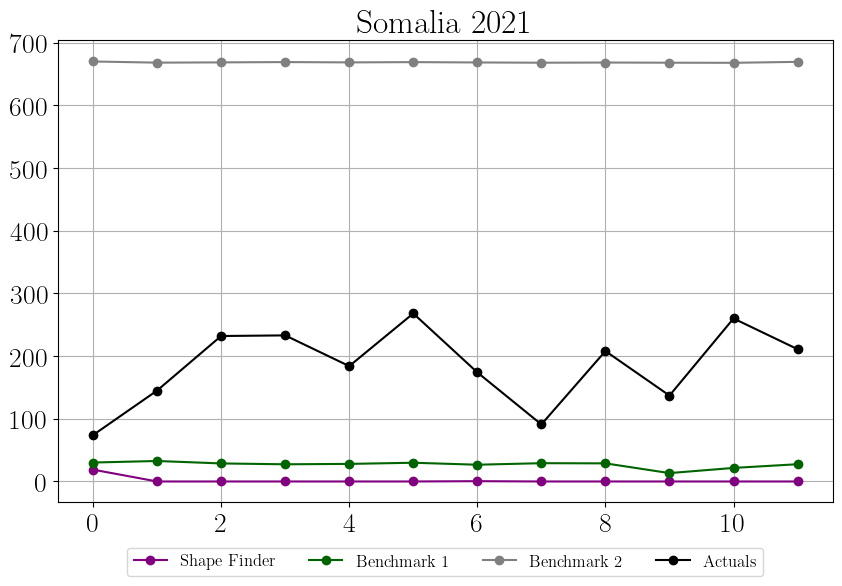

No patterns found to predict. Maybe increase the minimum distance.


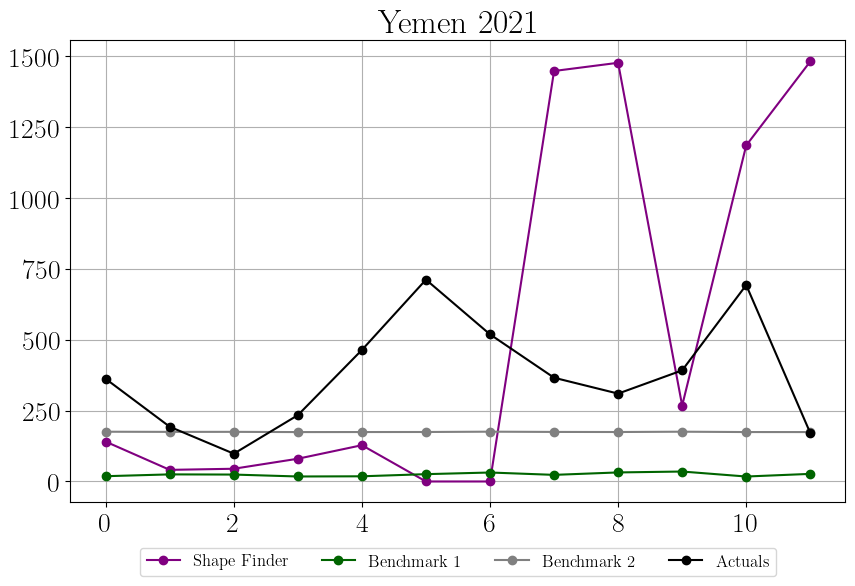

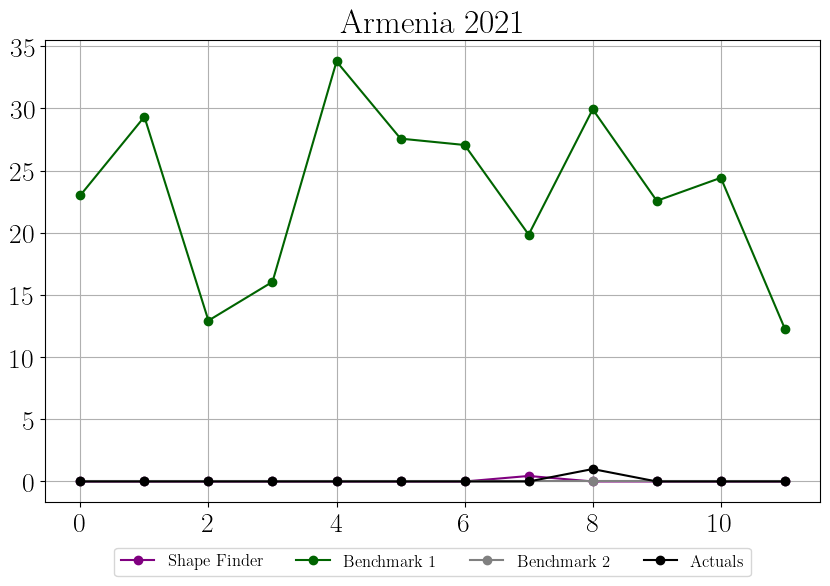

No patterns found to predict. Maybe increase the minimum distance.


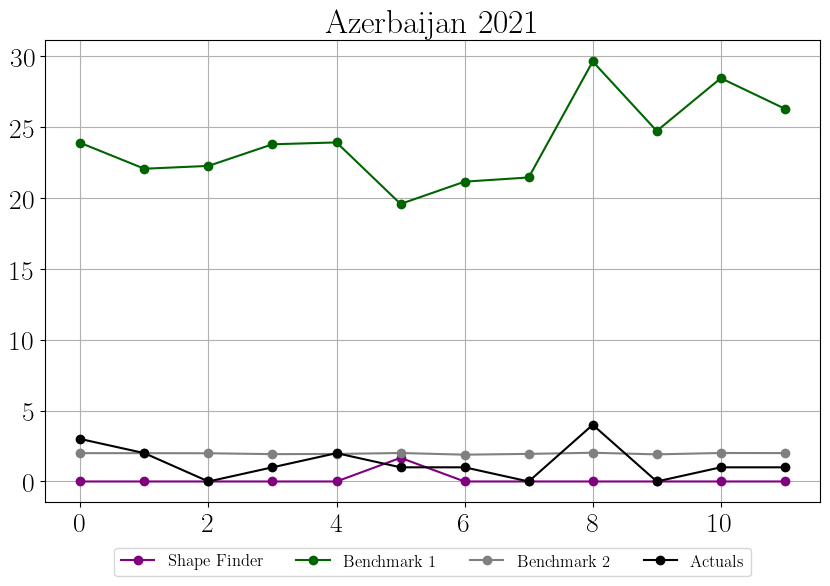

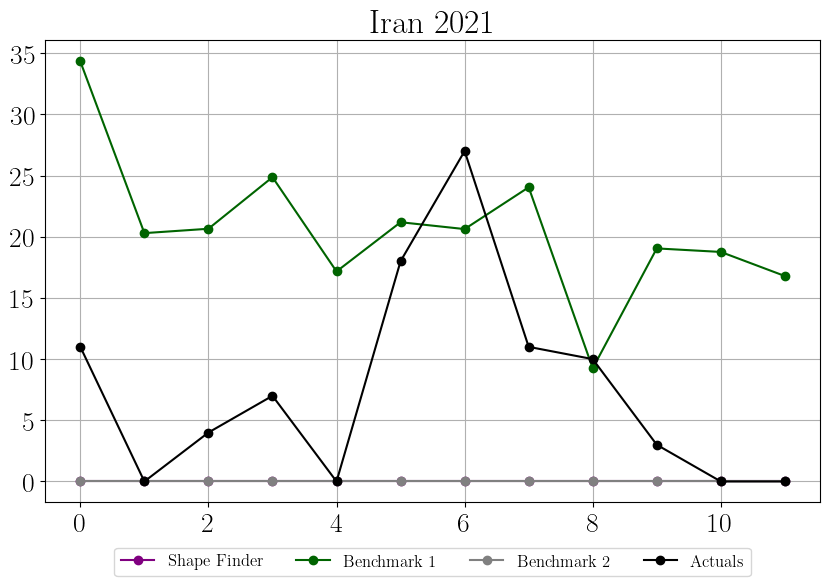

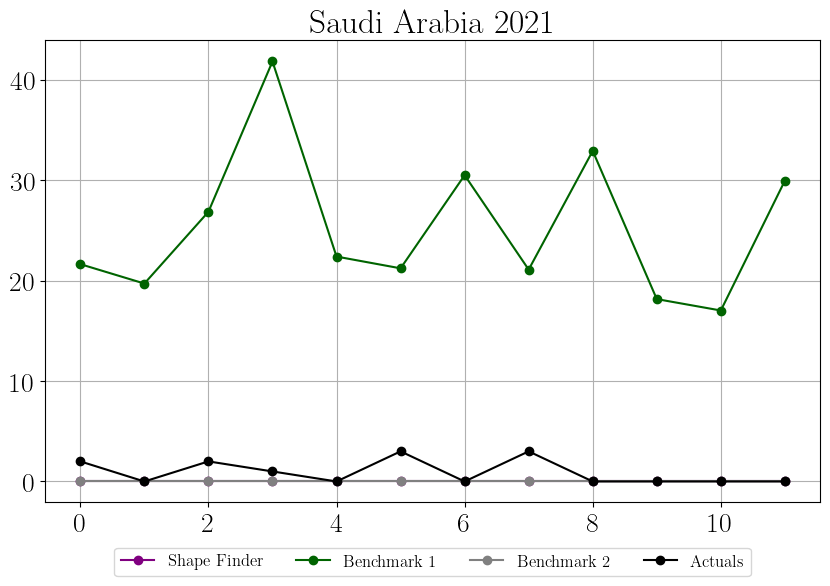

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


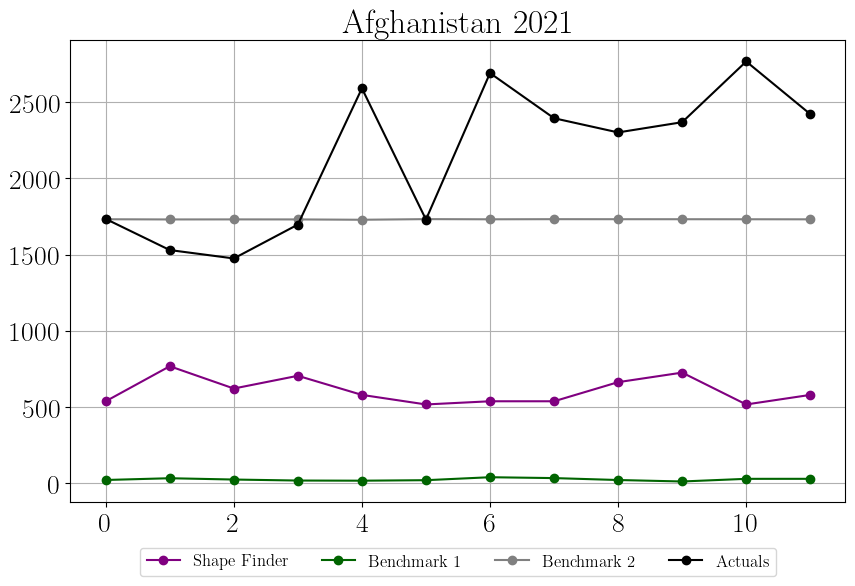

No patterns found to predict. Maybe increase the minimum distance.


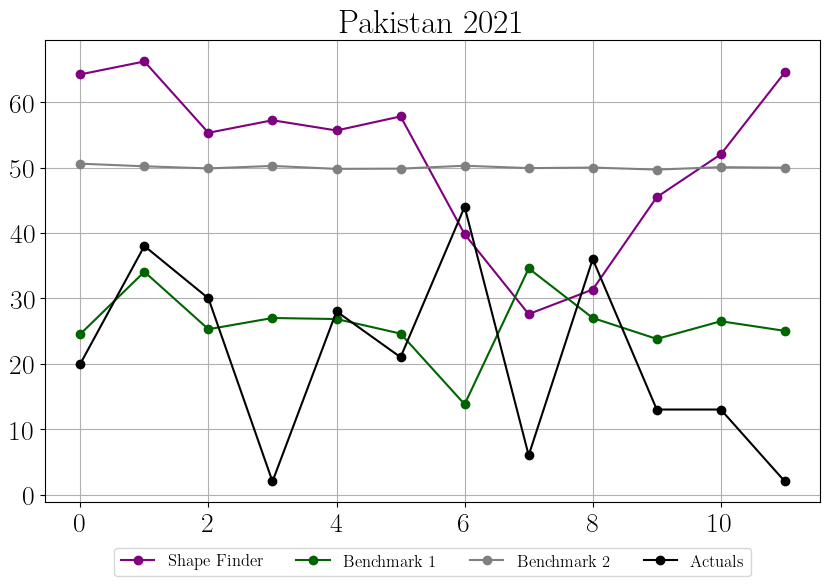

No patterns found to predict. Maybe increase the minimum distance.


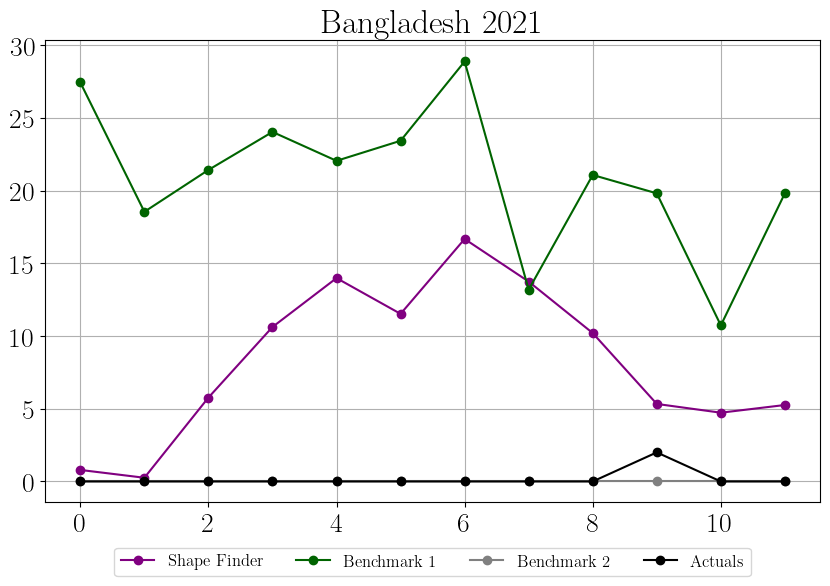

No patterns found to predict. Maybe increase the minimum distance.


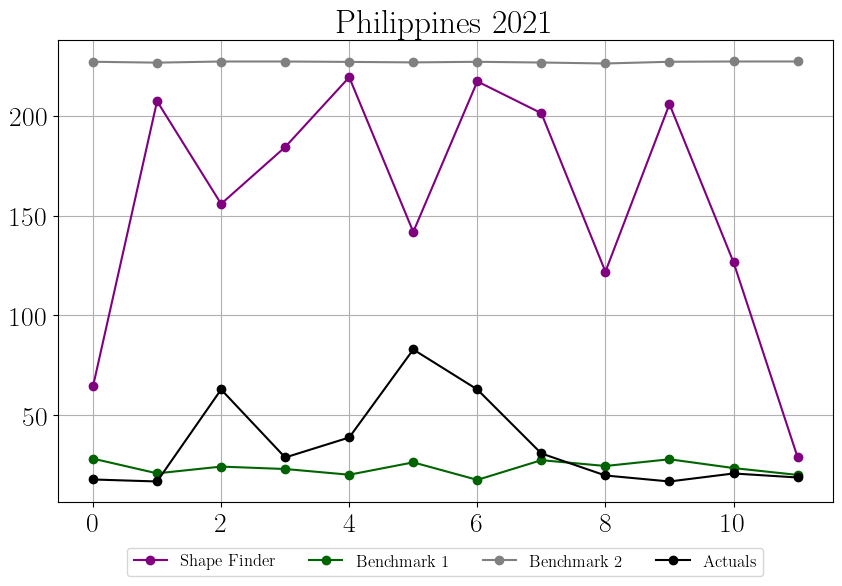

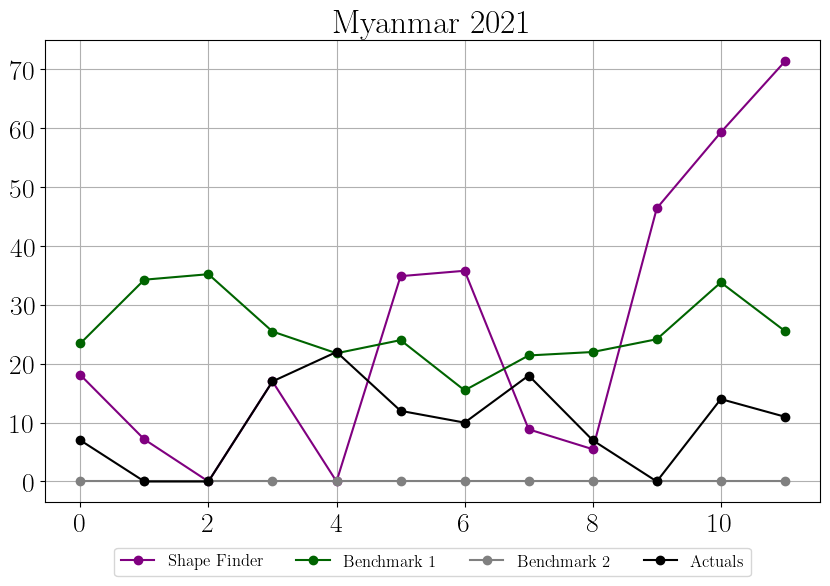

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


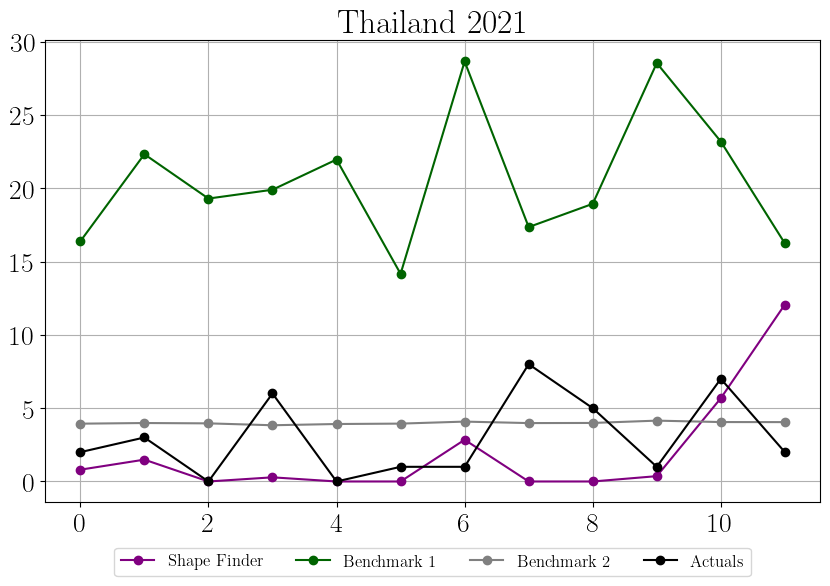

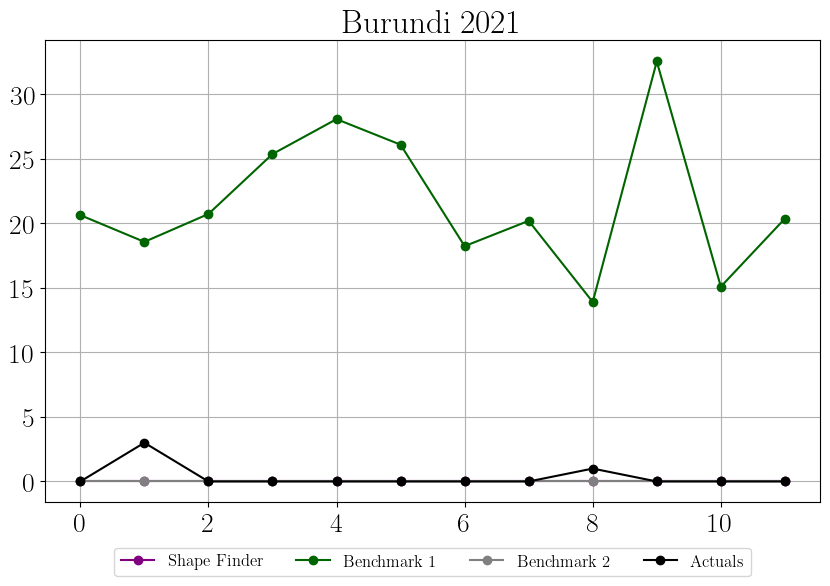

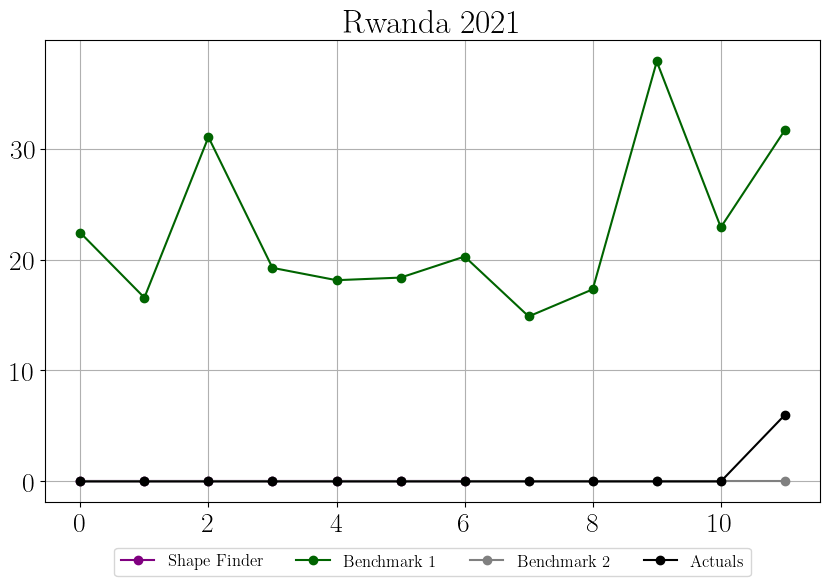

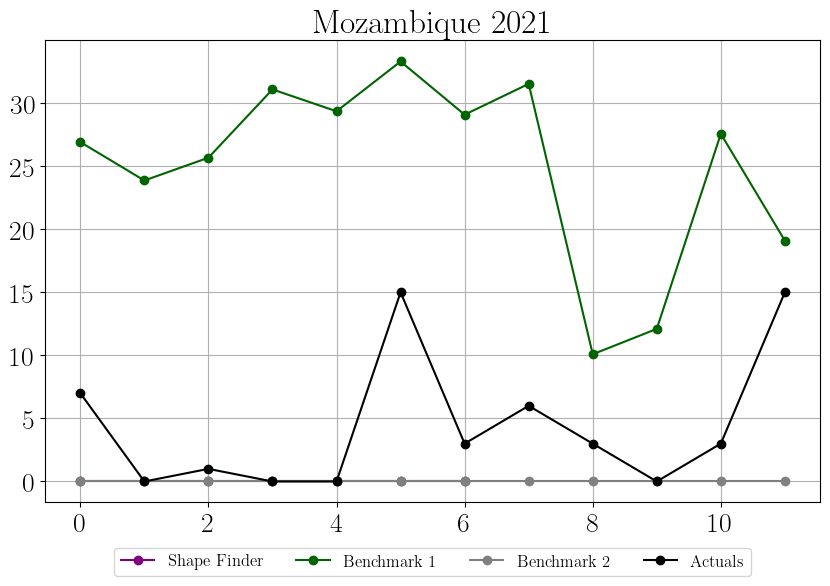

No patterns found to predict. Maybe increase the minimum distance.


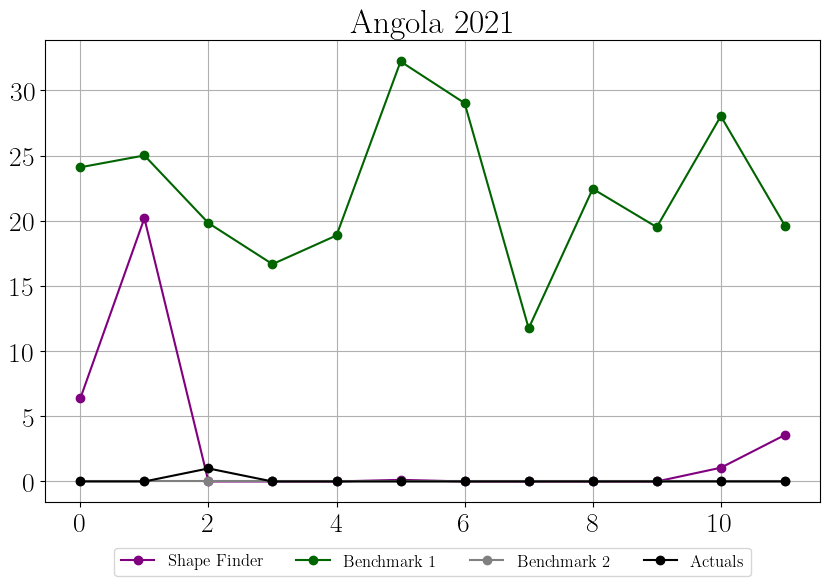

No patterns found to predict. Maybe increase the minimum distance.


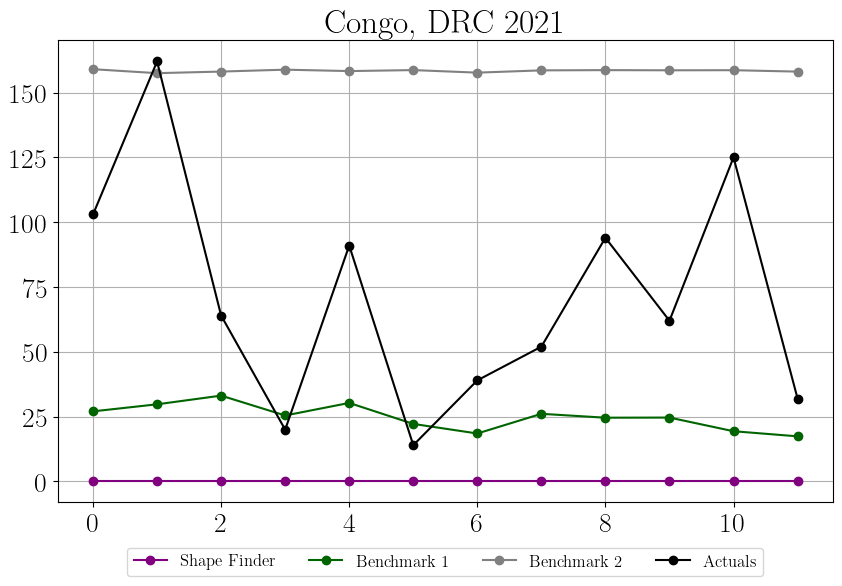

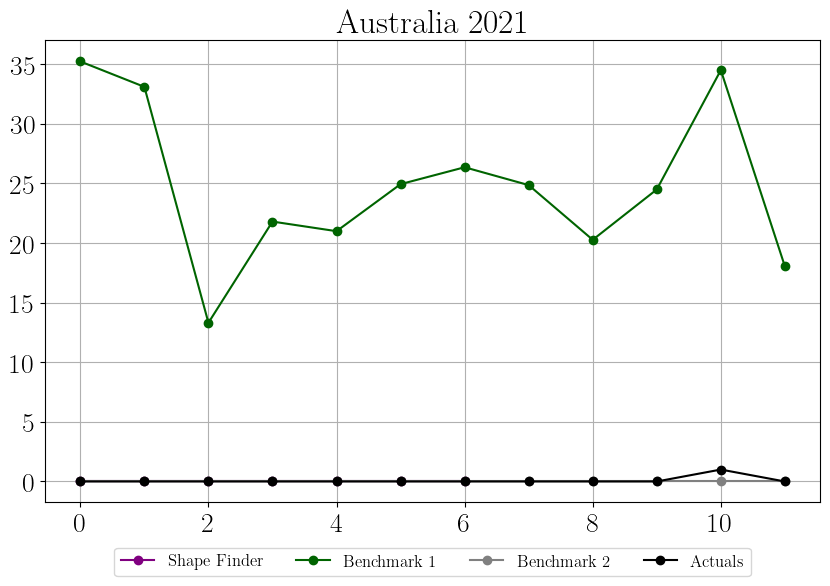

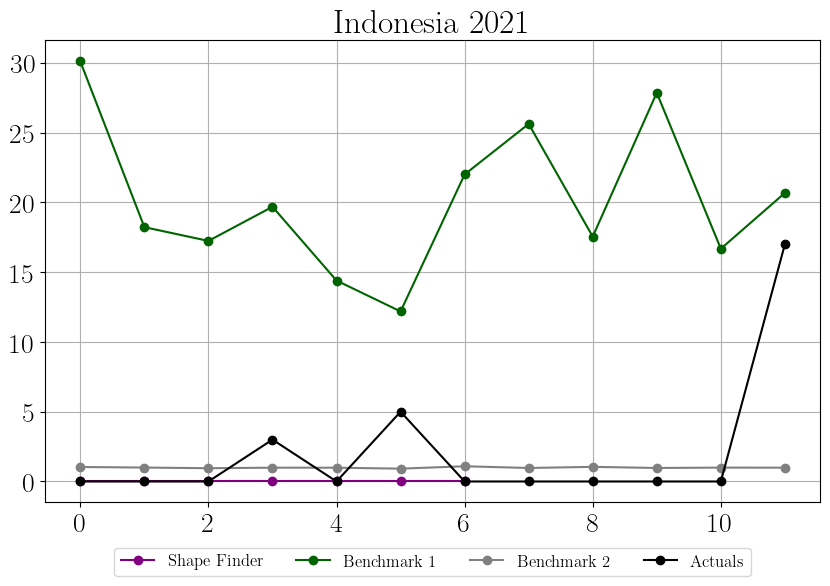

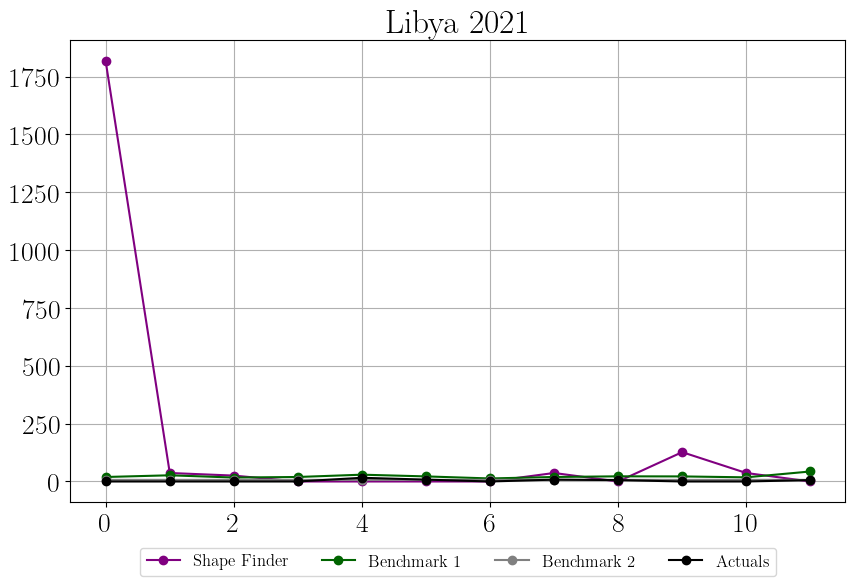

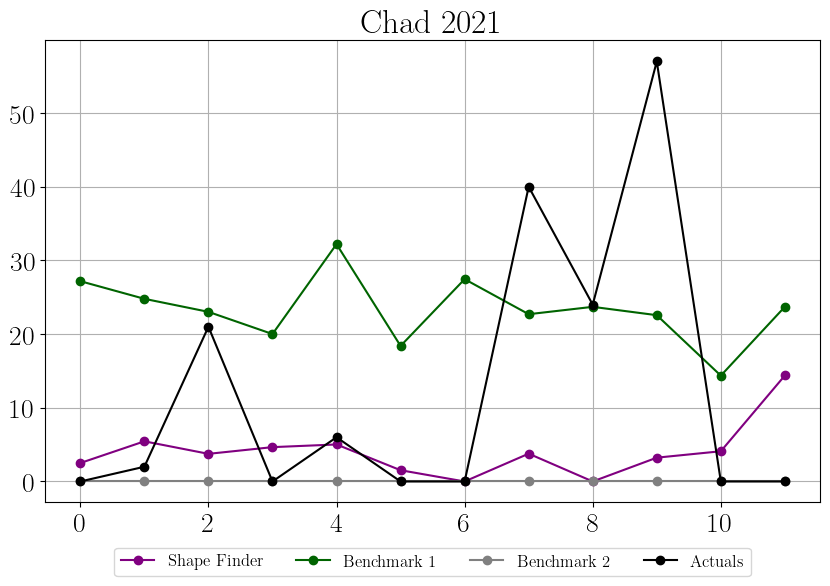

No patterns found to predict. Maybe increase the minimum distance.


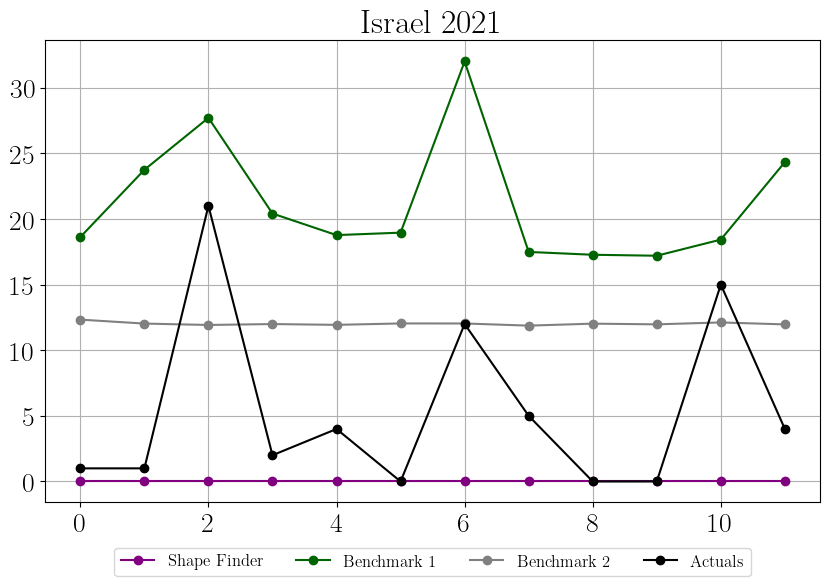

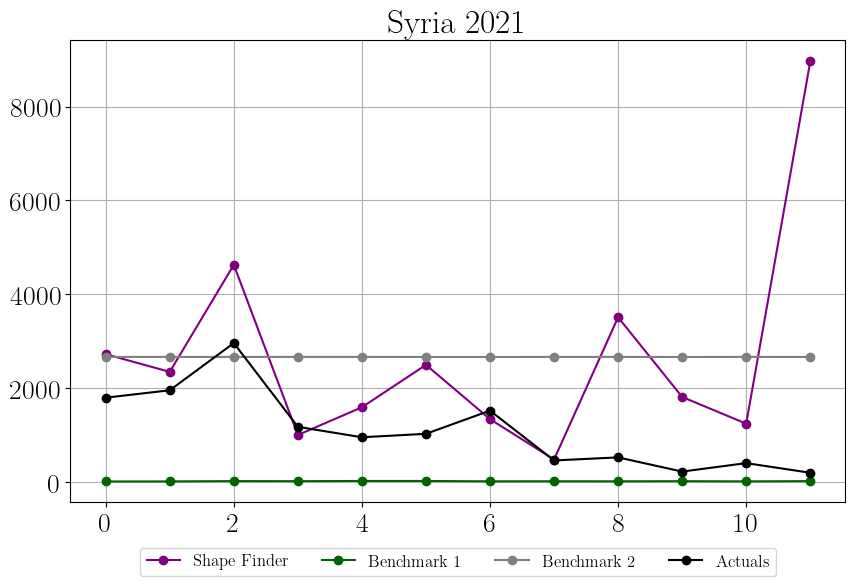

No patterns found to predict. Maybe increase the minimum distance.
No patterns found to predict. Maybe increase the minimum distance.


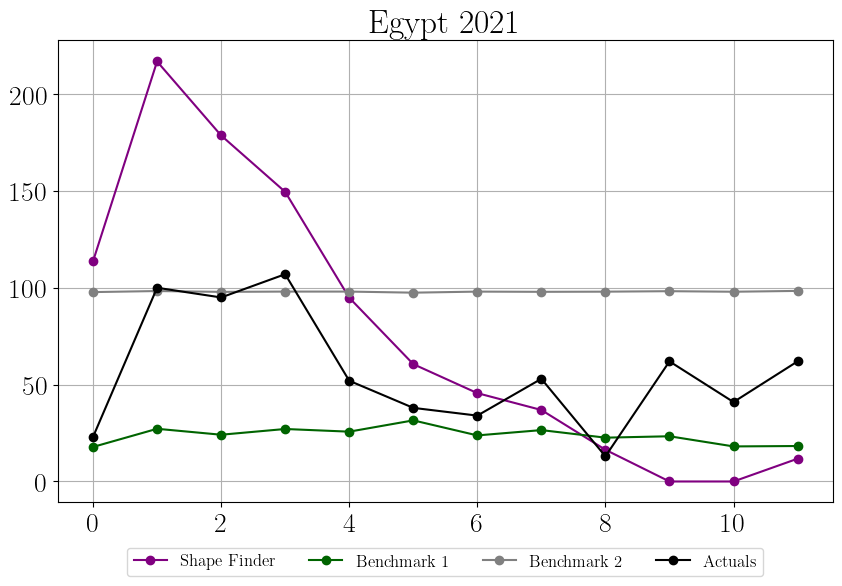

No patterns found to predict. Maybe increase the minimum distance.


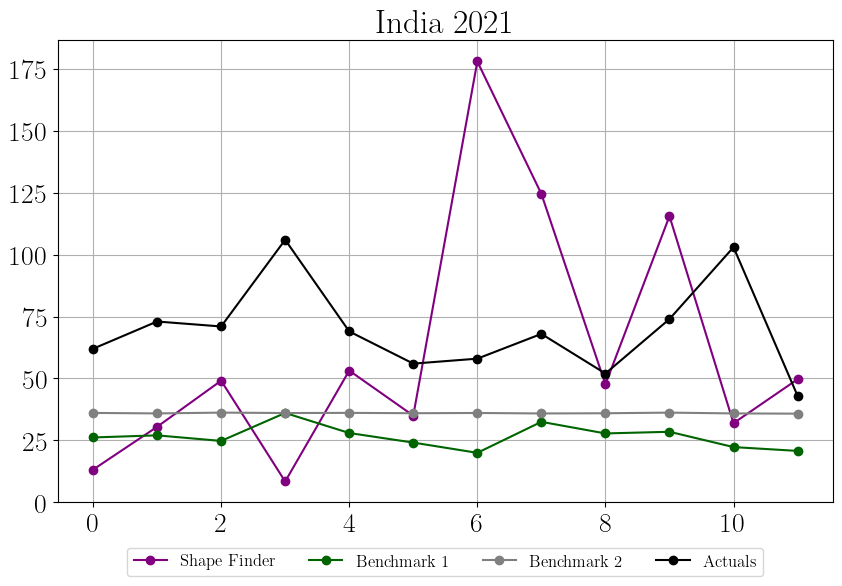

No patterns found to predict. Maybe increase the minimum distance.


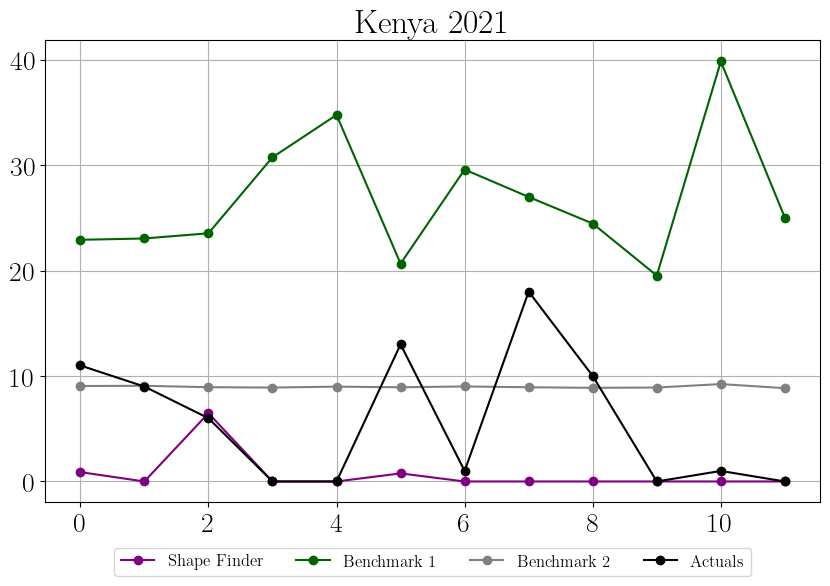

No patterns found to predict. Maybe increase the minimum distance.


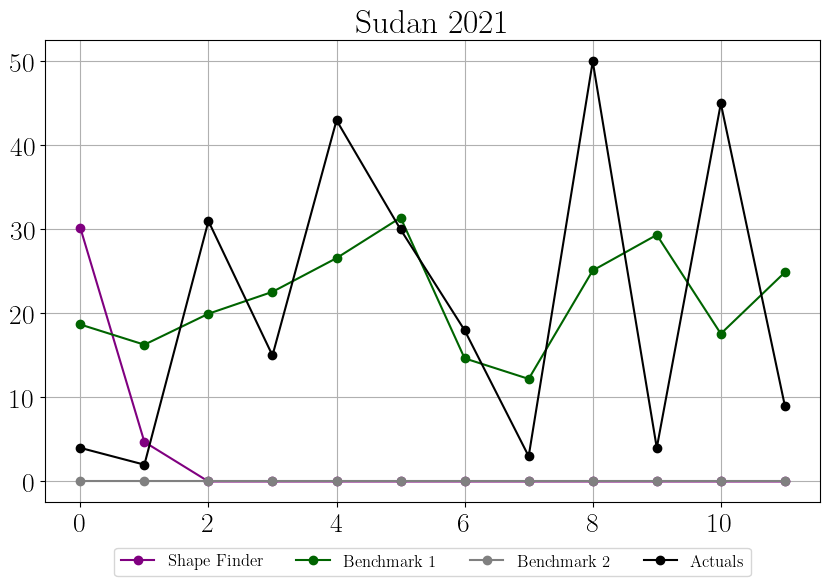

No patterns found to predict. Maybe increase the minimum distance.


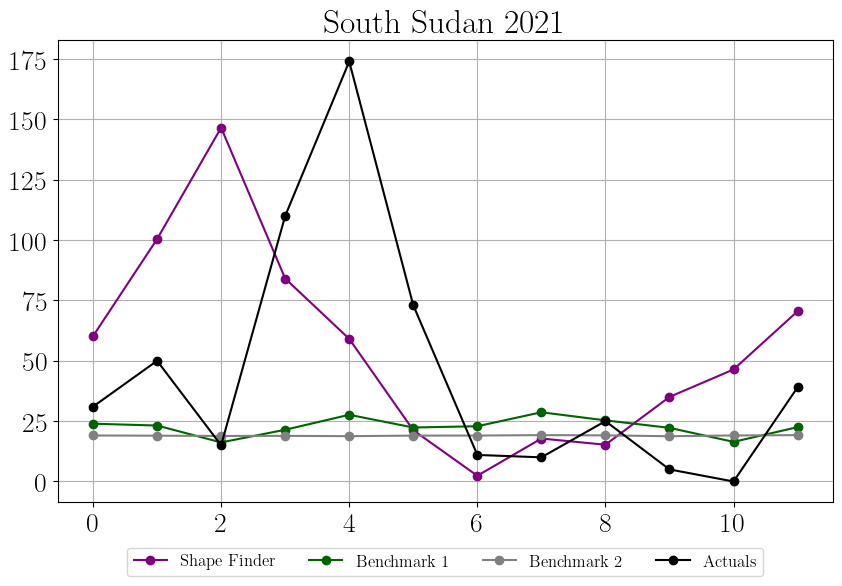

In [5]:
h=15
h_train=10
for min_d in [0.1]:
    for min_d_e in [0.1]:
        tot_df_sf=pd.DataFrame() # Predictions shape finder, for differenct values of num (over rows)
        tot_df_ar=pd.DataFrame() # Predictions benchmark 1, for different values of num (over rows)
        tot_df_ar2=pd.DataFrame() # Predictions benchmark 2, for different values of num (over rows)
        tot_df_obs=pd.DataFrame() # Actual values, for different values of num (over rows)
        
        tot_df_sf_diff=pd.DataFrame() # Difference t and t-1, shape finder, for different values of num (over rows)
        tot_df_ar_diff=pd.DataFrame() # Difference t and t-1, benchmark 1, for different values of num (over rows)
        tot_df_ar2_diff=pd.DataFrame() # Difference t and t-1, benchmark 2, for different values of num (over rows)
        tot_df_obs_diff=pd.DataFrame() # Difference t and t-1, actual values, for different values of num (over rows)
        
        for num in range(4):
            
            if num == 0:
                df_tot_m=df_tot_tot
                bench1=bench1_tot
                bench2=bench2_tot
            else:
                df_tot_m=df_tot_tot.iloc[:(-12*num),:] # remove last 1,2,3 years
                bench1=bench1_tot.iloc[:(-12*num),:]
                bench2=bench2_tot.iloc[:(-12*num),:]
            
        # =============================================================================
        # Forecast : ShapeFinder vs Bencharks
        # =============================================================================
        
            
            train_df = df_tot_m.iloc[:-15-h_train,:]
            test_df = df_tot_m.iloc[-15-h_train:,:]
            
            dtw_sel=2
            
            df_sf_tot=pd.DataFrame() # Predictions shape finder, all countries
            df_ar=pd.DataFrame() # Predictions benchmark 1, all countries
            df_ar2=pd.DataFrame() # Predictions benchmark 2, all countries
            df_obs=pd.DataFrame() # Actual values, all countries 
            #df_sf_tot=pd.DataFrame() Dubplicate?
            
            df_ar_d=pd.DataFrame() # Difference t and t-1, benchmark 1
            df_ar2_d=pd.DataFrame() # Difference t and t-1, benchmark 2
            df_obs_d=pd.DataFrame() # Difference t and t-1, actual values
            df_sf_diff_tot=pd.DataFrame() # Difference t and t-1, shape finder
            
            for row in range(len(test_df.columns)):
                ts=test_df.iloc[:,row]
                df_sf=pd.DataFrame()
                seq=ts.iloc[:h_train]
                min_d_2=min_d
                
                if (seq==0).all()==False: # check if test not flat
                    
                    ### Shape Finder ###
                    sh = Shape()
                    sh.set_shape(np.array(seq))
                    scaler = MinMaxScaler((0,1))
                    df_scaler=pd.concat([seq,seq,seq],axis=1)
                    df_scaler.index=range(len(df_scaler))
                    df_scaler.columns = ['Prediction', 'CI lower', 'CI upper']
                    fitted_scaler = scaler.fit(df_scaler)
                    model = finder(train_df,Shape=sh)
                    pred = model.predict(horizon=h,plot=False,metric='dtw',min_d=min_d_2,dtw_sel=dtw_sel,select=True)
                    
                    while pred is None: # Increase distance until prediction is possible
                        min_d_2=min_d_2+min_d_e
                        pred = model.predict(horizon=h,plot=False,metric='dtw',min_d=min_d_2,dtw_sel=dtw_sel,select=True)
                    
                    
                    pred=fitted_scaler.inverse_transform(pred) # Convert to non normalized 
                    pred[pred<0]=0 # Correct negative predictions 
                    pred=pd.DataFrame(pred)
                    
                else: # if test is flat, flat predictions are returned
                    pred=pd.concat([seq,seq,seq],axis=1)
                    pred.columns=[0,1,2]

                # Save predictions for shape finder 
                df_sf=pd.concat([df_sf,pred],axis=0)
                seq=pred.iloc[:,0]

                # Append predictions
                df_sf_diff=df_sf.iloc[2:15,:]
                df_sf=df_sf.iloc[3:15,:]
                df_sf=df_sf.reset_index(drop=True)
                df_sf_tot = pd.concat([df_sf_tot,df_sf.iloc[:,0]],axis=1)
                
                ### Bench mark ###
                ben1=bench1.iloc[-12:,row]
                ben2=bench2.iloc[-12:,row]
                obs = ts.iloc[-12:]
                ben1=ben1.reset_index(drop=True) 
                ben2=ben2.reset_index(drop=True) 
                obs=obs.reset_index(drop=True) 

                # Append benchmarks and actuals
                df_ar=pd.concat([df_ar,ben1],axis=1)
                df_ar2=pd.concat([df_ar2,ben2],axis=1)
                df_obs=pd.concat([df_obs,obs],axis=1)
                 
                if (obs==0).all()==False: # plot if actuals are not flat 
                    plt.figure(figsize=(10, 6))
                    plt.plot(df_sf_tot.iloc[:,-1], label='Shape Finder', marker='o',color='purple')
                    plt.plot(df_ar.iloc[:,-1], label='Benchmark 1', marker='o',color='darkgreen')
                    plt.plot(df_ar2.iloc[:,-1], label='Benchmark 2', marker='o',color='gray')
                    plt.plot(obs,label='Actuals',marker='o',color="black")
                    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), ncol=5,fontsize=12)
                    plt.grid(True)
                    if num==0: 
                        plt.title(f"{test_df.columns[row]} 2018")
                    if num==1: 
                        plt.title(f"{test_df.columns[row]} 2019")
                    if num==2: 
                        plt.title(f"{test_df.columns[row]} 2020")
                    if num==3: 
                        plt.title(f"{test_df.columns[row]} 2021")
                    plt.savefig(os.path.join(out_paths["analysis"],f"preds_{test_df.columns[row]}_num{num}.jpeg"),dpi=400,bbox_inches="tight")
                    plt.show()
                
                ### Differences, between t and t-1 ###                
                df_sf_diff=df_sf_diff.reset_index(drop=True)
                df_sf_diff=df_sf_diff.diff()
                df_sf_diff=df_sf_diff.iloc[1:,:]
                df_sf_diff_tot = pd.concat([df_sf_diff_tot,df_sf_diff.iloc[:,0]],axis=1)
                
                ### Bench mark ###
                ben1_diff=bench1.iloc[-13:,row]
                ben1_diff=ben1_diff.diff()
                ben1_diff=ben1_diff.iloc[1:]
                ben2_diff=bench2.iloc[-13:,row]
                ben2_diff=ben2_diff.diff()
                ben2_diff=ben2_diff.iloc[1:]
                obs_diff = ts.iloc[-13:]
                obs_diff=obs_diff.diff()
                obs_diff=obs_diff.iloc[1:]
                 
                ben1_diff=ben1_diff.reset_index(drop=True) 
                ben2_diff=ben2_diff.reset_index(drop=True) 
                obs_diff=obs_diff.reset_index(drop=True) 
                ben1=ben1.reset_index(drop=True) 
                ben2=ben2.reset_index(drop=True) 
                obs=obs.reset_index(drop=True) 
                
                df_ar_d=pd.concat([df_ar_d,ben1_diff],axis=1)
                df_ar2_d=pd.concat([df_ar2_d,ben2_diff],axis=1)
                df_obs_d=pd.concat([df_obs_d,obs_diff],axis=1)
                
                
            ### Merge results for differenct num ###                                                             
            tot_df_sf=pd.concat([tot_df_sf,df_sf_tot],axis=0)
            tot_df_ar=pd.concat([tot_df_ar,df_ar],axis=0)
            tot_df_ar2=pd.concat([tot_df_ar2,df_ar2],axis=0)
            tot_df_obs=pd.concat([tot_df_obs,df_obs],axis=0)
            tot_df_sf_diff=pd.concat([tot_df_sf_diff,df_sf_diff_tot],axis=0)
            tot_df_ar_diff=pd.concat([tot_df_ar_diff,df_ar_d],axis=0)
            tot_df_ar2_diff=pd.concat([tot_df_ar2_diff,df_ar2_d],axis=0)
            tot_df_obs_diff=pd.concat([tot_df_obs_diff,df_obs_d],axis=0)
        
        ### Add country names ###
        tot_df_sf.columns = tot_df_obs.columns
        tot_df_ar.columns = tot_df_obs.columns
        tot_df_ar2.columns = tot_df_obs.columns
        tot_df_sf_diff.columns = tot_df_obs_diff.columns
        tot_df_ar_diff.columns = tot_df_obs_diff.columns
        tot_df_ar2_diff.columns = tot_df_obs_diff.columns
        
        tot_df_sf=tot_df_sf.fillna(0)
        tot_df_sf_diff=tot_df_sf_diff.fillna(0)
        
        
#tot_df_sf.to_csv('10_h15.csv')
#tot_df_ar.to_csv('ar.csv')
#tot_df_ar2.to_csv('ar2.csv')
#tot_df_obs.to_csv('obs.csv')






In [ ]:
l_sf=[]
l_b=[]
l_b2=[]
l_sf_d=[]
l_b_d=[]
l_b2_d=[]
df_fin=[]
df_fin2=[]
df_fin3=[]
df_fin4=[]
df_fin5=[]
df_fin6=[]
df_fin7=[]
df_fin8=[]
h=15

for min_d in [0.3]:
    for min_d_e in [0.1]:
        tot_df_sf=pd.DataFrame() # Predictions shape finder, for differenct values of num (over rows)
        tot_df_ar=pd.DataFrame() # Predictions benchmark 1, for different values of num (over rows)
        tot_df_ar2=pd.DataFrame() # Predictions benchmark 2, for different values of num (over rows)
        tot_df_obs=pd.DataFrame() # Actual values, for different values of num (over rows)
        
        tot_df_sf_diff=pd.DataFrame() # Difference t and t-1, shape finder, for different values of num (over rows)
        tot_df_ar_diff=pd.DataFrame() # Difference t and t-1, benchmark 1, for different values of num (over rows)
        tot_df_ar2_diff=pd.DataFrame() # Difference t and t-1, benchmark 2, for different values of num (over rows)
        tot_df_obs_diff=pd.DataFrame() # Difference t and t-1, actual values, for different values of num (over rows)
        
        for num in range(4):
            
            if num == 0:
                df_tot_m=df_tot_tot
                bench1=bench1_tot
                bench2=bench2_tot
            else:
                df_tot_m=df_tot_tot.iloc[:(-12*num),:] # remove last 1,2,3 years
                bench1=bench1_tot.iloc[:(-12*num),:]
                bench2=bench2_tot.iloc[:(-12*num),:]
            
        # =============================================================================
        # Forecast : ShapeFinder vs Bencharks
        # =============================================================================
        
        ############## Conflict
            
            train_df = df_tot_m.iloc[:-15-h,:]
            test_df = df_tot_m.iloc[-15-h:,:]
            
            dtw_sel=2
            
            df_sf_tot=pd.DataFrame() # Predictions shape finder, all countries
            df_ar=pd.DataFrame() # Predictions benchmark 1, all countries
            df_ar2=pd.DataFrame() # Predictions benchmark 2, all countries
            df_obs=pd.DataFrame() # Actual values, all countries 
            #df_sf_tot=pd.DataFrame() Dubplicate?
            
            df_ar_d=pd.DataFrame() # Difference t and t-1, benchmark 1
            df_ar2_d=pd.DataFrame() # Difference t and t-1, benchmark 2
            df_obs_d=pd.DataFrame() # Difference t and t-1, actual values
            df_sf_diff_tot=pd.DataFrame() # Difference t and t-1, shape finder
            
            for row in range(len(test_df.columns)):
                ts=test_df.iloc[:,row]
                df_sf=pd.DataFrame()
                seq=ts.iloc[:h]
                
                for i in range(math.ceil(15/h)):
                    min_d_2=min_d
                    
                    if (seq==0).all()==False: # check if test not flat

                        ### Shape finder ###
                        sh = Shape()
                        sh.set_shape(np.array(seq))
                        scaler = MinMaxScaler((0,1))
                        df_scaler=pd.concat([seq,seq,seq],axis=1)
                        df_scaler.index=range(len(df_scaler))
                        df_scaler.columns = ['Prediction', 'CI lower', 'CI upper']
                        fitted_scaler = scaler.fit(df_scaler)
                        model = finder(train_df,Shape=sh)
                        pred = model.predict(horizon=h,plot=False,metric='dtw',min_d=min_d_2,dtw_sel=dtw_sel,select=True)
                        
                        while pred is None: # Increase distance until prediction is possible
                            min_d_2=min_d_2+min_d_e
                            pred = model.predict(horizon=h,plot=False,metric='dtw',min_d=min_d_2,dtw_sel=dtw_sel,select=True)
                            
                        pred=fitted_scaler.inverse_transform(pred) # Convert to non normalized 
                        pred[pred<0]=0 # Correct negative predictions
                        pred=pd.DataFrame(pred)
                        
                    else: # if test is flat, flat predictions are returned
                        pred=pd.concat([seq,seq,seq],axis=1)
                        pred.columns=[0,1,2]
                        
                    # Save predictions for shape finder 
                    df_sf=pd.concat([df_sf,pred],axis=0) # df_sf=pred?
                    seq=pred.iloc[:,0] # overwrite seq with predictions
                
                # Append predictions
                df_sf_diff=df_sf.iloc[2:15,:]
                df_sf=df_sf.iloc[3:15,:]
                df_sf=df_sf.reset_index(drop=True)
                df_sf_tot = pd.concat([df_sf_tot,df_sf.iloc[:,0]],axis=1) 
                
                ### Benchmark ### 
                ben1=bench1.iloc[-12:,row]
                ben2=bench2.iloc[-12:,row]
                obs = ts.iloc[-12:]
                 
                ben1=ben1.reset_index(drop=True) 
                ben2=ben2.reset_index(drop=True) 
                obs=obs.reset_index(drop=True) 
                
                # Append benchmarks and actuals
                df_ar=pd.concat([df_ar,ben1],axis=1)
                df_ar2=pd.concat([df_ar2,ben2],axis=1)
                df_obs=pd.concat([df_obs,obs],axis=1)
                 
                if (obs==0).all()==False: # plot if actuals are not flat 
                    plt.figure(figsize=(10, 6))
                    plt.plot(df_sf_tot.iloc[:,-1], label='ShapeFinder', marker='o',color='r')
                    plt.plot(df_ar.iloc[:,-1], label='Bench1', marker='o',color='g')
                    plt.plot(df_ar2.iloc[:,-1], label='Bench2', marker='o',color='b')
                    plt.plot(obs,label='Obs',marker='o',linewidth=3)
                    plt.legend()
                    plt.grid(True)
                    plt.title(f"{test_df.columns[row]} num={num}")
                    plt.savefig(os.path.join(out_paths["analysis"],f"preds_{test_df.columns[row]}.jpeg"),dpi=400,bbox_inches="tight")
                    plt.show()
                
                ### Differences, between t and t-1 ###
                df_sf_diff=df_sf_diff.reset_index(drop=True)
                df_sf_diff=df_sf_diff.diff()
                df_sf_diff=df_sf_diff.iloc[1:,:]
                df_sf_diff_tot = pd.concat([df_sf_diff_tot,df_sf_diff.iloc[:,0]],axis=1)
                
                ben1_diff=bench1.iloc[-13:,row]
                ben1_diff=ben1_diff.diff()
                ben1_diff=ben1_diff.iloc[1:]
                ben2_diff=bench2.iloc[-13:,row]
                ben2_diff=ben2_diff.diff()
                ben2_diff=ben2_diff.iloc[1:]
                obs_diff = ts.iloc[-13:]
                obs_diff=obs_diff.diff()
                obs_diff=obs_diff.iloc[1:]
                 
                ben1_diff=ben1_diff.reset_index(drop=True) 
                ben2_diff=ben2_diff.reset_index(drop=True) 
                obs_diff=obs_diff.reset_index(drop=True) 
                ben1=ben1.reset_index(drop=True) 
                ben2=ben2.reset_index(drop=True) 
                obs=obs.reset_index(drop=True) 
                
                df_ar_d=pd.concat([df_ar_d,ben1_diff],axis=1)
                df_ar2_d=pd.concat([df_ar2_d,ben2_diff],axis=1)
                df_obs_d=pd.concat([df_obs_d,obs_diff],axis=1)
                             
            ### Merge results for differenct num ###                
            tot_df_sf=pd.concat([tot_df_sf,df_sf_tot],axis=0)
            tot_df_ar=pd.concat([tot_df_ar,df_ar],axis=0)
            tot_df_ar2=pd.concat([tot_df_ar2,df_ar2],axis=0)
            tot_df_obs=pd.concat([tot_df_obs,df_obs],axis=0)
            tot_df_sf_diff=pd.concat([tot_df_sf_diff,df_sf_diff_tot],axis=0)
            tot_df_ar_diff=pd.concat([tot_df_ar_diff,df_ar_d],axis=0)
            tot_df_ar2_diff=pd.concat([tot_df_ar2_diff,df_ar2_d],axis=0)
            tot_df_obs_diff=pd.concat([tot_df_obs_diff,df_obs_d],axis=0)

        ### Add country names ###
        tot_df_sf.columns = tot_df_obs.columns
        tot_df_ar.columns = tot_df_obs.columns
        tot_df_ar2.columns = tot_df_obs.columns
        tot_df_sf_diff.columns = tot_df_obs_diff.columns
        tot_df_ar_diff.columns = tot_df_obs_diff.columns
        tot_df_ar2_diff.columns = tot_df_obs_diff.columns
        
        ### Append, if more values for min_d, min_d_e are considered ###       
        df_fin.append(tot_df_sf)
        df_fin2.append(tot_df_ar)
        df_fin3.append(tot_df_ar2)
        df_fin4.append(tot_df_obs)
        df_fin5.append(tot_df_sf_diff)
        df_fin6.append(tot_df_ar_diff)
        df_fin7.append(tot_df_ar2_diff)
        df_fin8.append(tot_df_obs_diff)
        
        ### Error plot ###
        err_sf=[]
        err_b=[]
        err_b2=[]
        for i in range(len(tot_df_sf.columns)):
            for y in range(4):
                err_sf.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_sf.iloc[y*12:(y+1)*12,i]))
                err_b.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar.iloc[y*12:(y+1)*12,i]))
                err_b2.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar2.iloc[y*12:(y+1)*12,i]))
            err_sf.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_sf.iloc[:,i]))
            err_b.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar.iloc[:,i]))
            err_b2.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar2.iloc[:,i]))
        
        err_sf = np.array(err_sf).reshape((5,191),order='F')
        err_b = np.array(err_b).reshape((5,191),order='F')
        err_b2 = np.array(err_b2).reshape((5,191),order='F')
        
        x_labels = ['ShapeFinder', 'Bench1', 'Bench2']
        means = [err_sf[4, :].mean(), err_b[4, :].mean(), err_b2[4, :].mean()]
        plt.bar(x_labels, means)
        plt.xlabel('Models')
        plt.ylabel('MSE') 
        plt.title('Mean Squared Error Comparison')
        plt.savefig(os.path.join(out_paths["analysis"],f"mse.jpeg"),dpi=400,bbox_inches="tight")
        plt.show()

        l_sf.append(err_sf)
        l_b.append(err_b)
        l_b2.append(err_b2)

        ### DTW Distance plot ###
        tot_df_sf_diff.index = tot_df_sf.index
        err_sf_d=[]
        err_b_d=[]
        err_b2_d=[]
        for i in range(len(tot_df_sf_diff.columns)):
            for y in range(4):
                if (tot_df_obs_diff.iloc[y*12:(y+1)*12,i]==0).all() and (tot_df_sf_diff.iloc[y*12:(y+1)*12,i]==0).all():
                    err_sf_d.append(0.0)
                else :
                    err_sf_d.append(dtw.distance(tot_df_obs_diff.iloc[y*12:(y+1)*12,i], tot_df_sf_diff.iloc[y*12:(y+1)*12,i]))
                if (tot_df_obs_diff.iloc[y*12:(y+1)*12,i]==0).all() and  (tot_df_ar_diff.iloc[y*12:(y+1)*12,i]==0).all():    
                    err_b_d.append(0.0)
                else:
                    err_b_d.append(dtw.distance(tot_df_obs_diff.iloc[y*12:(y+1)*12,i], tot_df_ar_diff.iloc[y*12:(y+1)*12,i]))
                if (tot_df_obs_diff.iloc[y*12:(y+1)*12,i]==0).all() and  (tot_df_ar2_diff.iloc[y*12:(y+1)*12,i]==0).all():    
                    err_b2_d.append(0.0)
                else:
                    err_b2_d.append(dtw.distance(tot_df_obs_diff.iloc[y*12:(y+1)*12,i], tot_df_ar2_diff.iloc[y*12:(y+1)*12,i]))

        err_sf_d = np.array(err_sf_d).reshape((4,191),order='F')
        err_b_d = np.array(err_b_d).reshape((4,191),order='F')
        err_b2_d = np.array(err_b2_d).reshape((4,191),order='F')
        
        x_labels = ['ShapeFinder', 'Bench1', 'Bench2']
        means = [err_sf_d.mean(), err_b_d.mean(), err_b2_d.mean()]
        plt.bar(x_labels, means)
        plt.xlabel('Models')
        plt.ylabel('DTW') 
        plt.title('DTW of diff')
        plt.savefig(os.path.join(out_paths["analysis"],f"dtw_diff.jpeg"),dpi=400,bbox_inches="tight")
        plt.show()
        
        l_sf_d.append(err_sf_d)
        l_b_d.append(err_b_d)
        l_b2_d.append(err_b2_d)

In [ ]:
# =============================================================================
# Normalized
# =============================================================================

scaler=MinMaxScaler((0,1))
df = scaler.fit_transform(df_tot_tot) 
df=pd.DataFrame(df)

for k in range(len(df_fin)):
    tot_df_nn=df_fin[k]
    tot_df_nn=scaler.transform(tot_df_nn)
    tot_df_nn=pd.DataFrame(tot_df_nn)
    tot_df_ar=df_fin2[0]
    tot_df_ar=scaler.transform(tot_df_ar)
    tot_df_ar=pd.DataFrame(tot_df_ar)
    tot_df_ar2=df_fin3[0]
    tot_df_ar2=scaler.transform(tot_df_ar2)
    tot_df_ar2=pd.DataFrame(tot_df_ar2)
    tot_df_obs=df_fin4[0]
    tot_df_obs=scaler.transform(tot_df_obs)
    tot_df_obs=pd.DataFrame(tot_df_obs)
    err_nn=[]
    err_b=[]
    err_b2=[]
    for i in range(12):
        err_nn.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_nn.loc[i].to_numpy().flatten()))
        err_b.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_ar.loc[i].to_numpy().flatten()))
        err_b2.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_ar2.loc[i].to_numpy().flatten()))
    plt.plot(err_nn,label=k)
#plt.plot(err_b,label='ar1')    
plt.plot(err_b2,label='ar2')   
plt.legend()
plt.show()

tot_df_nn=df_fin[0]
tot_df_nn=scaler.transform(tot_df_nn)
tot_df_nn=pd.DataFrame(tot_df_nn)
tot_df_nn=tot_df_nn.fillna(0)
# for i in range(5,12):    
#     tot_df_nn.loc[i]=df_fin[2].loc[i]    

tot_df_ar=df_fin2[0]
tot_df_ar=scaler.transform(tot_df_ar)
tot_df_ar=pd.DataFrame(tot_df_ar)
tot_df_ar2=df_fin3[0]
tot_df_ar2=scaler.transform(tot_df_ar2)
tot_df_ar2=pd.DataFrame(tot_df_ar2)
tot_df_obs=df_fin4[0]
tot_df_obs=scaler.transform(tot_df_obs)
tot_df_obs=pd.DataFrame(tot_df_obs)
err_nn=[]
err_b=[]
err_b2=[]
for i in range(len(tot_df_nn.columns)):
    for y in range(4):
        err_nn.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_nn.iloc[y*12:(y+1)*12,i]))
        err_b.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar.iloc[y*12:(y+1)*12,i]))
        err_b2.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar2.iloc[y*12:(y+1)*12,i]))
    err_nn.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_nn.iloc[:,i]))
    err_b.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar.iloc[:,i]))
    err_b2.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar2.iloc[:,i]))

err_nn = np.array(err_nn).reshape((5,191),order='F')
err_b = np.array(err_b).reshape((5,191),order='F')
err_b2 = np.array(err_b2).reshape((5,191),order='F')

x_labels = ['Bench1', 'Bench2']
mea_2=(err_b2[:4, :].flatten()-err_nn[:4, :].flatten())
mea_1=(err_b[:4, :].flatten()-err_nn[:4, :].flatten())
means = [mea_2.mean(),mea_1.mean()]
plt.bar(x_labels, means, capsize=5)
plt.xlabel('Models')
plt.ylabel('MSE')  # You might want to add a y-label too
plt.title('Mean Squared Error Normalized Comparison')  # You can add a title if needed
#plt.yscale('log')
plt.show()

#### No zeros

err_nn=[]
err_b=[]
err_b2=[]
go=0
for i in range(len(tot_df_nn.columns)):
    if (tot_df_obs.iloc[:,i]==0).all()==False:
        for y in range(4):
            err_nn.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_nn.iloc[y*12:(y+1)*12,i]))
            err_b.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar.iloc[y*12:(y+1)*12,i]))
            err_b2.append(mean_squared_error(tot_df_obs.iloc[y*12:(y+1)*12,i], tot_df_ar2.iloc[y*12:(y+1)*12,i]))
        err_nn.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_nn.iloc[:,i]))
        err_b.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar.iloc[:,i]))
        err_b2.append(mean_squared_error(tot_df_obs.iloc[:,i], tot_df_ar2.iloc[:,i]))
        go=go+1
        
err_nn = np.array(err_nn).reshape((5,go),order='F')
err_b = np.array(err_b).reshape((5,go),order='F')
err_b2 = np.array(err_b2).reshape((5,go),order='F')

x_labels = ['Bench2', 'Bench1']
mea_2=(err_b2[:4, :].flatten()-err_nn[:4, :].flatten())
mea_1=(err_b[:4, :].flatten()-err_nn[:4, :].flatten())
means = [mea_2.mean(),mea_1.mean()]
confidence_intervals = [1.96 * np.std(mea_2) / np.sqrt(len(mea_2)),
                        1.96 * np.std(mea_1) / np.sqrt(len(mea_1))]
plt.bar(x_labels, means, yerr=confidence_intervals, capsize=5)
plt.xlabel('Models')
plt.ylabel('MSE')  # You might want to add a y-label too
plt.title('Mean Squared Error Normalized Comparison')  # You can add a title if needed
plt.yscale('log')
plt.show()

x_labels = ['Bench2']
means = [mea_2.mean()]
confidence_intervals = [1.96 * np.std(mea_2) / np.sqrt(len(mea_2))]
plt.bar(x_labels, means, yerr=confidence_intervals, capsize=5)
plt.xlabel('Models')
plt.ylabel('MSE')  # You might want to add a y-label too
plt.title('Mean Squared Error Normalized Comparison')  # You can add a title if needed
plt.show()

In [ ]:
# =============================================================================
# Diff
# =============================================================================

tot_df_obs=df_fin8[0]
# scaler=MinMaxScaler((0,1))
# tot_df_obs = scaler.fit_transform(tot_df_obs) 
# tot_df_obs=pd.DataFrame(tot_df_obs)

# for k in range(len(df_fin)):
#     tot_df_nn=df_fin5[k]
#     tot_df_nn=scaler.transform(tot_df_nn)
#     tot_df_nn=pd.DataFrame(tot_df_nn)
#     tot_df_ar=df_fin6[0]
#     tot_df_ar=scaler.transform(tot_df_ar)
#     tot_df_ar=pd.DataFrame(tot_df_ar)
#     tot_df_ar2=df_fin7[0]
#     tot_df_ar2=scaler.transform(tot_df_ar2)
#     tot_df_ar2=pd.DataFrame(tot_df_ar2)
#     err_nn=[]
#     err_b=[]
#     err_b2=[]
#     for i in range(12):
#         err_nn.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_nn.loc[i].to_numpy().flatten()))
#         err_b.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_ar.loc[i].to_numpy().flatten()))
#         err_b2.append(mean_squared_error(tot_df_obs.loc[i].to_numpy().flatten(), tot_df_ar2.loc[i].to_numpy().flatten()))
#     plt.plot(err_nn,label=k)
# #plt.plot(err_b,label='ar1')    
# plt.plot(err_b2,label='ar2')   
# plt.legend()
# plt.show()

tot_df_nn=df_fin5[0].iloc[:-1]
tot_df_ar=df_fin6[0]
tot_df_ar2=df_fin7[0]
# tot_df_nn=scaler.transform(tot_df_nn)
# tot_df_nn=pd.DataFrame(tot_df_nn)
cg_nn=[]
cg_b=[]
cg_b2=[]
count=0
for i in range(len(tot_df_nn.columns)):
    for y in range(len(tot_df_nn)):
        if abs(tot_df_obs.iloc[y,i])>20:
            if tot_df_obs.iloc[y,i]>0:
                if (tot_df_nn.iloc[y,i]>0.7*tot_df_obs.iloc[y,i]) and (tot_df_nn.iloc[y,i]<1.3*tot_df_obs.iloc[y,i]):
                    cg_nn.append((y,i))
                if (tot_df_ar.iloc[y,i]>0.7*tot_df_obs.iloc[y,i]) and (tot_df_ar.iloc[y,i]<1.3*tot_df_obs.iloc[y,i]):
                    cg_b.append((y,i))
                if (tot_df_ar2.iloc[y,i]>0.7*tot_df_obs.iloc[y,i]) and (tot_df_ar2.iloc[y,i]<1.3*tot_df_obs.iloc[y,i]):
                    cg_b2.append((y,i))
            if tot_df_obs.iloc[y,i]<0:     
                if (tot_df_nn.iloc[y,i]<0.7*tot_df_obs.iloc[y,i]) and (tot_df_nn.iloc[y,i]>1.3*tot_df_obs.iloc[y,i]):
                    cg_nn.append((y,i))
                if (tot_df_ar.iloc[y,i]<0.7*tot_df_obs.iloc[y,i]) and (tot_df_ar.iloc[y,i]>1.3*tot_df_obs.iloc[y,i]):
                    cg_b.append((y,i))
                if (tot_df_ar2.iloc[y,i]<0.7*tot_df_obs.iloc[y,i]) and (tot_df_ar2.iloc[y,i]>1.3*tot_df_obs.iloc[y,i]):
                    cg_b2.append((y,i))
            count=count+1    

first_elements = [tup[0] for tup in cg_nn]
second_elements = [tup[1] for tup in cg_nn]
df_cgn = pd.DataFrame({'1': first_elements, '2': second_elements})


plot_nn=df_fin[0] 
plot_ar=df_fin2[0]
plot_ar2=df_fin3[0]
plot_obs=df_fin4[0]
year=['2019','2020','2021','2022']
for i in range(191):
    if (plot_obs.iloc[:,i]==0).all()==False:
        for y in range(4):
            plt.plot(plot_nn.iloc[y*12:(y+1)*12,i].reset_index(drop=True),label='ShapeFinder')
            plt.plot(plot_ar.iloc[y*12:(y+1)*12,i].reset_index(drop=True),label='B1')
            plt.plot(plot_ar2.iloc[y*12:(y+1)*12,i].reset_index(drop=True),label='B2')
            plt.plot(plot_obs.iloc[y*12:(y+1)*12,i].reset_index(drop=True),label='Obs',marker='o',linewidth=5)
            plt.legend()
            plt.title(plot_nn.columns[i]+year[y])
            plt.show()

err_nn = np.array(err_nn).reshape((5,191),order='F')
err_b = np.array(err_b).reshape((5,191),order='F')
err_b2 = np.array(err_b2).reshape((5,191),order='F')

x_labels = ['Bench1', 'Bench2']
mea_2=(err_b2[:4, :].flatten()-err_nn[:4, :].flatten())
mea_1=(err_b[:4, :].flatten()-err_nn[:4, :].flatten())
means = [mea_2.mean(),mea_1.mean()]
plt.bar(x_labels, means, capsize=5)
plt.xlabel('Models')
plt.ylabel('MSE')  # You might want to add a y-label too
plt.title('Mean Squared Error Normalized Comparison')  # You can add a title if needed
plt.yscale('log')
plt.show()